In [1]:
import numpy as np
import tensorflow as tf

In [2]:
import IPython

In [3]:
import soundfile as sf

In [4]:
import librosa
s, sr=librosa.load('train_clean_male.wav', sr=None)
S=librosa.stft(s, n_fft=1024, hop_length=512)
sn, sr=librosa.load('train_dirty_male.wav', sr=None)
X=librosa.stft(sn, n_fft=1024, hop_length=512)

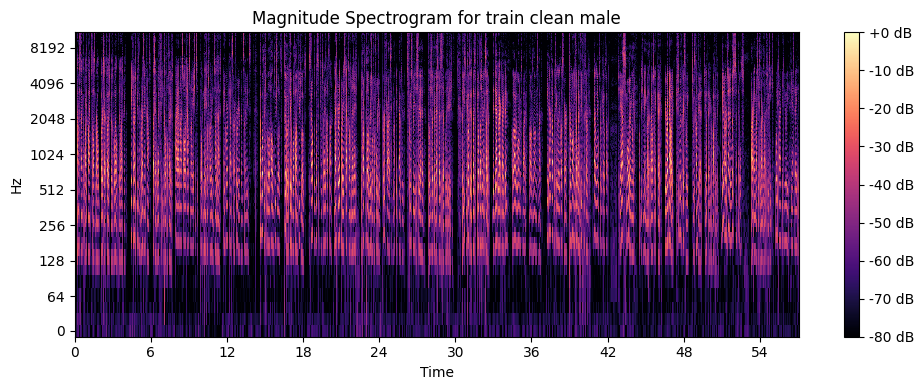

In [66]:
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.amplitude_to_db(S_abs, ref=np.max), y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Magnitude Spectrogram for train clean male')
plt.tight_layout()

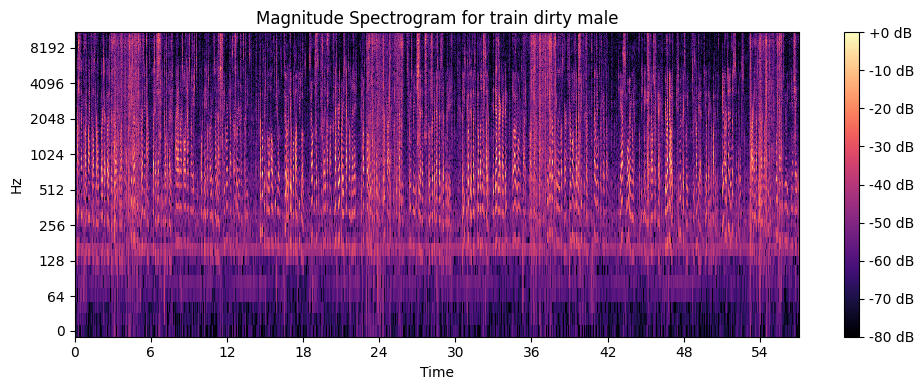

In [67]:
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.amplitude_to_db(X_abs, ref=np.max), y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Magnitude Spectrogram for train dirty male')
plt.tight_layout()

In [5]:
S_abs = np.abs(S)
X_abs = np.abs(X)


In [6]:
S_tp = np.transpose(S_abs)
X_tp = np.transpose(X_abs)


In [7]:
S_tp.shape, X_tp.shape

((2459, 513), (2459, 513))

In [8]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(1300, activation='relu', input_shape=(513,)),
    tf.keras.layers.Dense(1300, activation='relu'),
    tf.keras.layers.Dense(513, activation='relu'),  
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='mse')

In [9]:
ts, sr=librosa.load('test_x_01.wav', sr=None)
ts=librosa.stft(ts, n_fft=1024, hop_length=512)
tx, sr=librosa.load('test_s_01.wav', sr=None)
tx=librosa.stft(tx, n_fft=1024, hop_length=512)

In [10]:
ts_abs = np.abs(ts)
tx_abs = np.abs(tx)


In [11]:
ts_tp = np.transpose(ts_abs)
tx_tp = np.transpose(tx_abs)


In [12]:
ts_tp.shape, tx_tp.shape

((142, 513), (142, 513))

In [13]:
model.fit(X_tp,S_tp, epochs=200,validation_data=(tx_tp,ts_tp), batch_size=64)

Epoch 1/200
39/39 [==============================] - 1s 22ms/step - loss: 0.0707 - val_loss: 0.2088
Epoch 2/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0407 - val_loss: 0.1563
Epoch 3/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0236 - val_loss: 0.1237
Epoch 4/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0157 - val_loss: 0.1061
Epoch 5/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0120 - val_loss: 0.0946
Epoch 6/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0102 - val_loss: 0.0894
Epoch 7/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0088 - val_loss: 0.0826
Epoch 8/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0080 - val_loss: 0.0788
Epoch 9/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0073 - val_loss: 0.0758
Epoch 10/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0069 - val_loss: 0.0725

39/39 [==============================] - 1s 19ms/step - loss: 0.0024 - val_loss: 0.0447
Epoch 83/200
39/39 [==============================] - 1s 21ms/step - loss: 0.0023 - val_loss: 0.0447
Epoch 84/200
39/39 [==============================] - 1s 20ms/step - loss: 0.0023 - val_loss: 0.0449
Epoch 85/200
39/39 [==============================] - 1s 20ms/step - loss: 0.0023 - val_loss: 0.0443
Epoch 86/200
39/39 [==============================] - 1s 22ms/step - loss: 0.0023 - val_loss: 0.0450
Epoch 87/200
39/39 [==============================] - 1s 20ms/step - loss: 0.0024 - val_loss: 0.0445
Epoch 88/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0023 - val_loss: 0.0446
Epoch 89/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0024 - val_loss: 0.0443
Epoch 90/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0024 - val_loss: 0.0446
Epoch 91/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0023 - val_loss: 0.0453
Epo

39/39 [==============================] - 1s 19ms/step - loss: 0.0018 - val_loss: 0.0427
Epoch 163/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0018 - val_loss: 0.0425
Epoch 164/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0018 - val_loss: 0.0422
Epoch 165/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0018 - val_loss: 0.0424
Epoch 166/200
39/39 [==============================] - 1s 18ms/step - loss: 0.0018 - val_loss: 0.0421
Epoch 167/200
39/39 [==============================] - 1s 19ms/step - loss: 0.0018 - val_loss: 0.0421
Epoch 168/200
39/39 [==============================] - 1s 20ms/step - loss: 0.0018 - val_loss: 0.0423
Epoch 169/200
39/39 [==============================] - 1s 20ms/step - loss: 0.0018 - val_loss: 0.0428
Epoch 170/200
39/39 [==============================] - 1s 21ms/step - loss: 0.0019 - val_loss: 0.0435
Epoch 171/200
39/39 [==============================] - 1s 21ms/step - loss: 0.0019 - val_loss: 0

In [14]:
recon = model.predict(X_tp)

77/77 [==============================] - 0s 4ms/step


In [16]:
np.shape(tx_tp)

(142, 513)

In [17]:
S_hat_test = (X / X_abs) * np.transpose(recon)

In [18]:
 sh_test = librosa.istft(S_hat_test, n_fft=1024, hop_length=512)


In [19]:
sf.write('test_s_01_recons.wav', sh_test, sr)

In [20]:
IPython.display.Audio("test_s_01_recons.wav")


In [21]:
recon_test = model.predict(tx_tp)

5/5 [==============================] - 0s 3ms/step


In [22]:
sum_of_squares_signal = np.sum(ts_abs ** 2)
sum_of_squares_noise = np.sum((ts_abs - np.transpose(recon_test)) ** 2)

# Calculate SNR in decibels (dB)
snr = 10 * np.log10(sum_of_squares_signal / sum_of_squares_noise)

In [23]:
snr

8.434150218963623

In [24]:
TX_2, sr=librosa.load('test_x_02.wav', sr=None)
tx_2=librosa.stft(TX_2, n_fft=1024, hop_length=512)

In [25]:
tx_2_abs = np.abs(tx_2)
tx_2_tp = np.transpose(tx_2_abs)


In [26]:
recon_2 = model.predict(tx_2_tp)

12/12 [==============================] - 0s 3ms/step


In [27]:
S_hat_test2 = (tx_2 / tx_2_abs) * np.transpose(recon_2)


In [28]:
 sh_test2 = librosa.istft(S_hat_test2, n_fft=1024, hop_length=512)


In [29]:
sf.write('test_s_02_recons.wav', sh_test2, sr)

In [30]:
IPython.display.Audio("test_s_02_recons.wav")


# Question 2

In [31]:
import librosa
s, sr=librosa.load('train_clean_male.wav', sr=None)
S=librosa.stft(s, n_fft=1024, hop_length=512)
sn, sr=librosa.load('train_dirty_male.wav', sr=None)
X=librosa.stft(sn, n_fft=1024, hop_length=512)

In [32]:
S_abs = np.abs(S)
X_abs = np.abs(X)


In [33]:
S_tp = np.transpose(S_abs)
X_tp = np.transpose(X_abs)


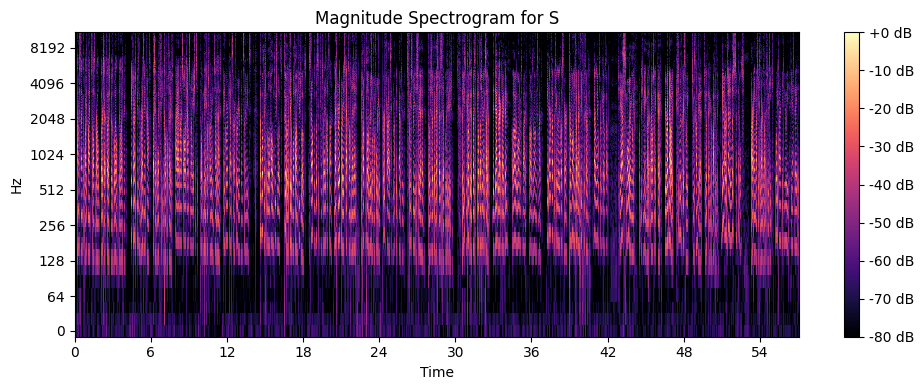

In [64]:
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.amplitude_to_db(S_abs, ref=np.max), y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Magnitude Spectrogram for train clean male')
plt.tight_layout()

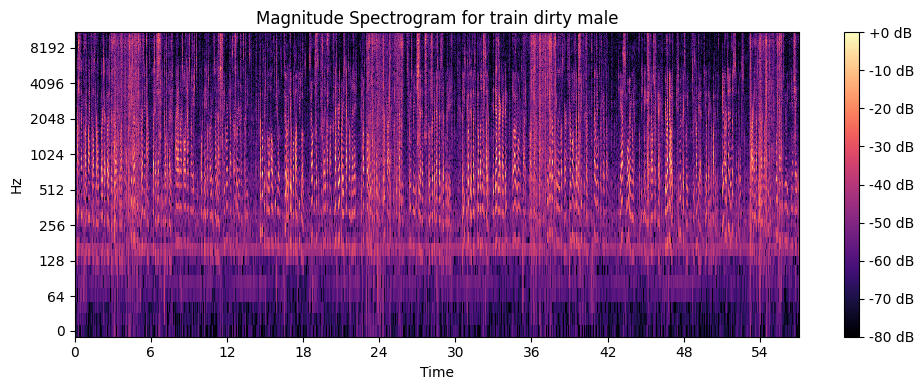

In [65]:
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.amplitude_to_db(X_abs, ref=np.max), y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Magnitude Spectrogram for train dirty male')
plt.tight_layout()

In [34]:
S_tp.shape, X_tp.shape

((2459, 513), (2459, 513))

In [35]:
model2 = tf.keras.Sequential([
    tf.keras.layers.Conv1D(filters=32, kernel_size=10, activation='relu', input_shape=(513, 1)),
    tf.keras.layers.MaxPooling1D(pool_size=2, strides=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(513, activation='relu'),
])
model2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='mse')

In [36]:
ts, sr=librosa.load('test_x_01.wav', sr=None)
ts=librosa.stft(ts, n_fft=1024, hop_length=512)
tx, sr=librosa.load('test_s_01.wav', sr=None)
tx=librosa.stft(tx, n_fft=1024, hop_length=512)

In [37]:
ts_abs = np.abs(ts)
tx_abs = np.abs(tx)


In [38]:
ts_tp = np.transpose(ts_abs)
tx_tp = np.transpose(tx_abs)


In [39]:
ts_tp.shape, tx_tp.shape

((142, 513), (142, 513))

In [40]:
model2.fit(X_tp,S_tp, epochs=400,validation_data=(tx_tp,ts_tp), batch_size=64)

Epoch 1/400
39/39 [==============================] - 2s 33ms/step - loss: 0.0819 - val_loss: 0.2187
Epoch 2/400
39/39 [==============================] - 1s 32ms/step - loss: 0.0648 - val_loss: 0.2019
Epoch 3/400
39/39 [==============================] - 1s 31ms/step - loss: 0.0559 - val_loss: 0.1930
Epoch 4/400
39/39 [==============================] - 1s 31ms/step - loss: 0.0491 - val_loss: 0.1821
Epoch 5/400
39/39 [==============================] - 1s 31ms/step - loss: 0.0432 - val_loss: 0.1703
Epoch 6/400
39/39 [==============================] - 1s 31ms/step - loss: 0.0377 - val_loss: 0.1586
Epoch 7/400
39/39 [==============================] - 1s 31ms/step - loss: 0.0327 - val_loss: 0.1479
Epoch 8/400
39/39 [==============================] - 1s 31ms/step - loss: 0.0284 - val_loss: 0.1369
Epoch 9/400
39/39 [==============================] - 1s 31ms/step - loss: 0.0247 - val_loss: 0.1297
Epoch 10/400
39/39 [==============================] - 1s 32ms/step - loss: 0.0217 - val_loss: 0.1208

39/39 [==============================] - 1s 30ms/step - loss: 0.0026 - val_loss: 0.0368
Epoch 83/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0025 - val_loss: 0.0367
Epoch 84/400
39/39 [==============================] - 1s 31ms/step - loss: 0.0025 - val_loss: 0.0369
Epoch 85/400
39/39 [==============================] - 1s 29ms/step - loss: 0.0025 - val_loss: 0.0366
Epoch 86/400
39/39 [==============================] - 1s 29ms/step - loss: 0.0025 - val_loss: 0.0362
Epoch 87/400
39/39 [==============================] - 1s 29ms/step - loss: 0.0025 - val_loss: 0.0361
Epoch 88/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0024 - val_loss: 0.0358
Epoch 89/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0024 - val_loss: 0.0361
Epoch 90/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0024 - val_loss: 0.0361
Epoch 91/400
39/39 [==============================] - 1s 29ms/step - loss: 0.0024 - val_loss: 0.0363
Epo

39/39 [==============================] - 1s 30ms/step - loss: 0.0016 - val_loss: 0.0313
Epoch 163/400
39/39 [==============================] - 1s 31ms/step - loss: 0.0016 - val_loss: 0.0311
Epoch 164/400
39/39 [==============================] - 1s 29ms/step - loss: 0.0016 - val_loss: 0.0312
Epoch 165/400
39/39 [==============================] - 1s 29ms/step - loss: 0.0016 - val_loss: 0.0311
Epoch 166/400
39/39 [==============================] - 1s 29ms/step - loss: 0.0016 - val_loss: 0.0310
Epoch 167/400
39/39 [==============================] - 1s 29ms/step - loss: 0.0016 - val_loss: 0.0309
Epoch 168/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0016 - val_loss: 0.0310
Epoch 169/400
39/39 [==============================] - 1s 29ms/step - loss: 0.0016 - val_loss: 0.0313
Epoch 170/400
39/39 [==============================] - 1s 29ms/step - loss: 0.0016 - val_loss: 0.0309
Epoch 171/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0016 - val_loss: 0

39/39 [==============================] - 1s 30ms/step - loss: 0.0013 - val_loss: 0.0297
Epoch 243/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0013 - val_loss: 0.0296
Epoch 244/400
39/39 [==============================] - 1s 31ms/step - loss: 0.0013 - val_loss: 0.0295
Epoch 245/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0013 - val_loss: 0.0298
Epoch 246/400
39/39 [==============================] - 1s 29ms/step - loss: 0.0013 - val_loss: 0.0297
Epoch 247/400
39/39 [==============================] - 1s 31ms/step - loss: 0.0013 - val_loss: 0.0296
Epoch 248/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0013 - val_loss: 0.0296
Epoch 249/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0013 - val_loss: 0.0296
Epoch 250/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0013 - val_loss: 0.0295
Epoch 251/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0013 - val_loss: 0

39/39 [==============================] - 1s 30ms/step - loss: 0.0011 - val_loss: 0.0292
Epoch 323/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0011 - val_loss: 0.0292
Epoch 324/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0011 - val_loss: 0.0292
Epoch 325/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0011 - val_loss: 0.0292
Epoch 326/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0011 - val_loss: 0.0291
Epoch 327/400
39/39 [==============================] - 1s 29ms/step - loss: 0.0011 - val_loss: 0.0291
Epoch 328/400
39/39 [==============================] - 1s 31ms/step - loss: 0.0011 - val_loss: 0.0291
Epoch 329/400
39/39 [==============================] - 1s 33ms/step - loss: 0.0011 - val_loss: 0.0290
Epoch 330/400
39/39 [==============================] - 1s 31ms/step - loss: 0.0011 - val_loss: 0.0291
Epoch 331/400
39/39 [==============================] - 1s 30ms/step - loss: 0.0011 - val_loss: 0

In [41]:
recon = model2.predict(X_tp)

77/77 [==============================] - 0s 4ms/step


In [42]:
S_hat_test = (X / X_abs) * np.transpose(recon)


In [43]:
 sh_test = librosa.istft(S_hat_test, n_fft=1024, hop_length=512)


In [44]:
sf.write('test_s_01_2_recons.wav', sh_test, sr)

In [45]:
IPython.display.Audio("test_s_01_2_recons.wav")


In [46]:
recon_test = model2.predict(tx_tp)

5/5 [==============================] - 0s 4ms/step


In [47]:
sum_of_squares_signal = np.sum(ts_abs ** 2)
sum_of_squares_noise = np.sum((ts_abs - np.transpose(recon_test)) ** 2)

# Calculate SNR in decibels (dB)
snr = 10 * np.log10(sum_of_squares_signal / sum_of_squares_noise)

In [48]:
snr

10.074756145477295

In [49]:
TX_2, sr=librosa.load('test_x_02.wav', sr=None)
tx_2=librosa.stft(TX_2, n_fft=1024, hop_length=512)

In [50]:
tx_2_abs = np.abs(tx_2)
tx_2_tp = np.transpose(tx_2_abs)


In [51]:
recon_2 = model2.predict(tx_2_tp)

12/12 [==============================] - 0s 4ms/step


In [52]:
S_hat_test2 = (tx_2 / tx_2_abs) * np.transpose(recon_2)


In [53]:
 sh_test2 = librosa.istft(S_hat_test2, n_fft=1024, hop_length=512)


In [54]:
sf.write('test_s_02_2_recons.wav', sh_test2, sr)

In [55]:
IPython.display.Audio("test_s_02_2_recons.wav")


# Question 3

In [59]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models,initializers
import matplotlib.pyplot as plt
import numpy as np

In [2]:
import tensorflow_addons as tfa


C:\Users\dassu\AppData\Roaming\Python\Python39\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
C:\Users\dassu\AppData\Roaming\Python\Python39\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.11.0 and strictly below 2.14.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.14.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file a

## Baseline Model

In [68]:
(train_images, train_labels), (test_images, test_labels) = keras.datasets.cifar10.load_data()

train_images, test_images = train_images / 255.0, test_images / 255.0

In [69]:
val_images, train_images = train_images[:5000], train_images[5000:]
val_labels, train_labels = train_labels[:5000], train_labels[5000:]

In [70]:
model = models.Sequential([
    layers.Conv2D(10, (5, 5), activation='relu',kernel_initializer=initializers.he_normal(), input_shape=(32, 32, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(10, (5, 5), activation='relu',kernel_initializer=initializers.he_normal()),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(20, activation='relu',kernel_initializer=initializers.he_normal()),
    layers.Dense(10, activation='softmax',kernel_initializer=initializers.he_normal())
])

In [71]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [72]:
baseline_history = model.fit(train_images, train_labels, epochs=200,batch_size = 64, validation_data=(val_images, val_labels))

Epoch 1/200
704/704 [==============================] - 8s 10ms/step - loss: 1.8989 - accuracy: 0.2972 - val_loss: 1.6481 - val_accuracy: 0.3820
Epoch 2/200
704/704 [==============================] - 7s 10ms/step - loss: 1.5255 - accuracy: 0.4433 - val_loss: 1.4228 - val_accuracy: 0.4842
Epoch 3/200
704/704 [==============================] - 7s 10ms/step - loss: 1.4233 - accuracy: 0.4820 - val_loss: 1.4227 - val_accuracy: 0.4998
Epoch 4/200
704/704 [==============================] - 7s 10ms/step - loss: 1.3708 - accuracy: 0.5030 - val_loss: 1.3496 - val_accuracy: 0.5234
Epoch 5/200
704/704 [==============================] - 7s 10ms/step - loss: 1.3230 - accuracy: 0.5235 - val_loss: 1.3501 - val_accuracy: 0.5232
Epoch 6/200
704/704 [==============================] - 7s 10ms/step - loss: 1.2881 - accuracy: 0.5372 - val_loss: 1.2937 - val_accuracy: 0.5404
Epoch 7/200
704/704 [==============================] - 7s 10ms/step - loss: 1.2507 - accuracy: 0.5535 - val_loss: 1.2346 - val_accuracy:

704/704 [==============================] - 7s 10ms/step - loss: 0.9064 - accuracy: 0.6840 - val_loss: 1.0408 - val_accuracy: 0.6380
Epoch 58/200
704/704 [==============================] - 7s 10ms/step - loss: 0.9065 - accuracy: 0.6841 - val_loss: 1.0502 - val_accuracy: 0.6350
Epoch 59/200
704/704 [==============================] - 7s 10ms/step - loss: 0.9089 - accuracy: 0.6840 - val_loss: 1.0571 - val_accuracy: 0.6392
Epoch 60/200
704/704 [==============================] - 7s 10ms/step - loss: 0.9005 - accuracy: 0.6845 - val_loss: 1.0291 - val_accuracy: 0.6478
Epoch 61/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8958 - accuracy: 0.6872 - val_loss: 1.0924 - val_accuracy: 0.6224
Epoch 62/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8937 - accuracy: 0.6900 - val_loss: 1.0430 - val_accuracy: 0.6462
Epoch 63/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8922 - accuracy: 0.6894 - val_loss: 1.0714 - val_accuracy: 0.634

704/704 [==============================] - 7s 10ms/step - loss: 0.8377 - accuracy: 0.7087 - val_loss: 1.0573 - val_accuracy: 0.6376
Epoch 114/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8379 - accuracy: 0.7056 - val_loss: 1.0415 - val_accuracy: 0.6466
Epoch 115/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8414 - accuracy: 0.7076 - val_loss: 1.0373 - val_accuracy: 0.6468
Epoch 116/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8351 - accuracy: 0.7071 - val_loss: 1.0465 - val_accuracy: 0.6492
Epoch 117/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8367 - accuracy: 0.7071 - val_loss: 1.0449 - val_accuracy: 0.6510
Epoch 118/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8412 - accuracy: 0.7084 - val_loss: 1.1056 - val_accuracy: 0.6304
Epoch 119/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8402 - accuracy: 0.7061 - val_loss: 1.0444 - val_accuracy:

704/704 [==============================] - 7s 10ms/step - loss: 0.8120 - accuracy: 0.7158 - val_loss: 1.0563 - val_accuracy: 0.6442
Epoch 170/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8092 - accuracy: 0.7178 - val_loss: 1.0505 - val_accuracy: 0.6516
Epoch 171/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8017 - accuracy: 0.7205 - val_loss: 1.0452 - val_accuracy: 0.6478
Epoch 172/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8070 - accuracy: 0.7163 - val_loss: 1.0604 - val_accuracy: 0.6490
Epoch 173/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8085 - accuracy: 0.7162 - val_loss: 1.0566 - val_accuracy: 0.6476
Epoch 174/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8074 - accuracy: 0.7164 - val_loss: 1.1027 - val_accuracy: 0.6372
Epoch 175/200
704/704 [==============================] - 7s 10ms/step - loss: 0.8055 - accuracy: 0.7194 - val_loss: 1.0511 - val_accuracy:

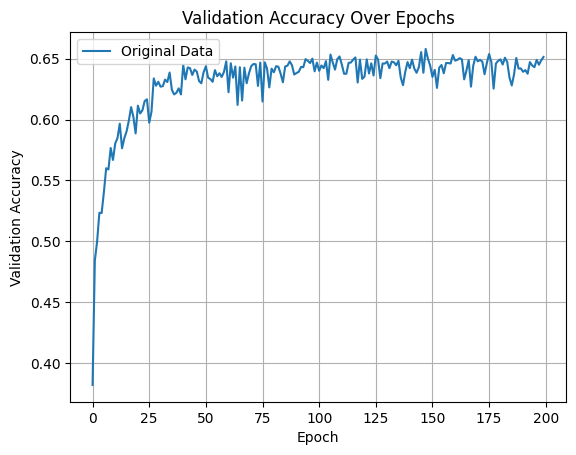

In [73]:
plt.plot(baseline_history.history['val_accuracy'],label = "Original Data")
plt.xlabel('Epoch')
plt.ylabel('Validation Accuracy')
plt.title('Validation Accuracy Over Epochs')
plt.grid(True)
plt.legend()
plt.show()

## Augmented Model

In [74]:
brightened_images = np.minimum(1.1 * train_images, 1.0)
darkened_images = 0.9 * train_images
flipped_images = np.flip(train_images, axis=2)

In [76]:
augmented_train_images = np.concatenate([brightened_images, darkened_images, flipped_images, train_images])
augmented_train_labels = np.concatenate([train_labels, train_labels, train_labels, train_labels])

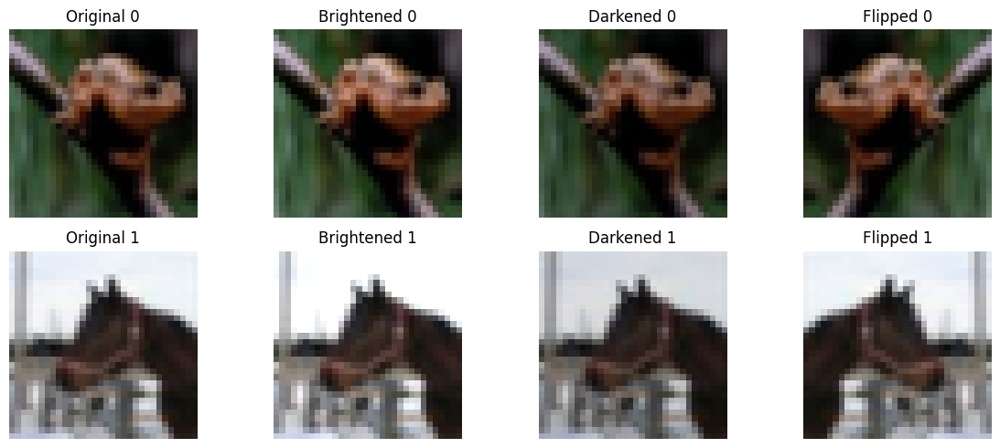

In [78]:
indices = [0, 1]
fig, axes = plt.subplots(2, 4, figsize=(12, 5))
for i, idx in enumerate(indices):
    axes[i, 0].imshow(train_images[idx])
    axes[i, 0].set_title(f'Original {idx}')
    axes[i, 0].axis('off')
for i, idx in enumerate(indices):
    axes[i, 1].imshow(brightened_images[idx])
    axes[i, 1].set_title(f'Brightened {idx}')
    axes[i, 1].axis('off')
for i, idx in enumerate(indices):
    axes[i, 2].imshow(darkened_images[idx])
    axes[i, 2].set_title(f'Darkened {idx}')
    axes[i, 2].axis('off')
for i, idx in enumerate(indices):
    axes[i, 3].imshow(flipped_images[idx])
    axes[i, 3].set_title(f'Flipped {idx}')
    axes[i, 3].axis('off')
plt.tight_layout()
plt.show()

In [79]:
augmented_history = model.fit(augmented_train_images, augmented_train_labels, epochs=200,batch_size = 300, validation_data=(val_images, val_labels))


Epoch 1/200
600/600 [==============================] - 20s 33ms/step - loss: 0.8258 - accuracy: 0.7158 - val_loss: 1.0087 - val_accuracy: 0.6584
Epoch 2/200
600/600 [==============================] - 20s 33ms/step - loss: 0.8216 - accuracy: 0.7163 - val_loss: 1.0058 - val_accuracy: 0.6608
Epoch 3/200
600/600 [==============================] - 18s 31ms/step - loss: 0.8221 - accuracy: 0.7156 - val_loss: 1.0104 - val_accuracy: 0.6606
Epoch 4/200
600/600 [==============================] - 19s 31ms/step - loss: 0.8243 - accuracy: 0.7145 - val_loss: 0.9973 - val_accuracy: 0.6608
Epoch 5/200
600/600 [==============================] - 19s 31ms/step - loss: 0.8212 - accuracy: 0.7162 - val_loss: 0.9949 - val_accuracy: 0.6658
Epoch 6/200
600/600 [==============================] - 18s 30ms/step - loss: 0.8241 - accuracy: 0.7147 - val_loss: 0.9923 - val_accuracy: 0.6596
Epoch 7/200
600/600 [==============================] - 19s 32ms/step - loss: 0.8215 - accuracy: 0.7155 - val_loss: 0.9803 - val_ac

600/600 [==============================] - 18s 30ms/step - loss: 0.7988 - accuracy: 0.7220 - val_loss: 0.9679 - val_accuracy: 0.6684
Epoch 58/200
600/600 [==============================] - 18s 31ms/step - loss: 0.7984 - accuracy: 0.7225 - val_loss: 0.9819 - val_accuracy: 0.6676
Epoch 59/200
600/600 [==============================] - 18s 31ms/step - loss: 0.7998 - accuracy: 0.7220 - val_loss: 0.9769 - val_accuracy: 0.6694
Epoch 60/200
600/600 [==============================] - 18s 31ms/step - loss: 0.7973 - accuracy: 0.7231 - val_loss: 0.9837 - val_accuracy: 0.6660
Epoch 61/200
600/600 [==============================] - 19s 32ms/step - loss: 0.7989 - accuracy: 0.7224 - val_loss: 0.9744 - val_accuracy: 0.6674
Epoch 62/200
600/600 [==============================] - 19s 32ms/step - loss: 0.7975 - accuracy: 0.7227 - val_loss: 0.9704 - val_accuracy: 0.6728
Epoch 63/200
600/600 [==============================] - 18s 31ms/step - loss: 0.7963 - accuracy: 0.7226 - val_loss: 0.9692 - val_accuracy

600/600 [==============================] - 19s 31ms/step - loss: 0.7869 - accuracy: 0.7257 - val_loss: 0.9586 - val_accuracy: 0.6724
Epoch 114/200
600/600 [==============================] - 19s 32ms/step - loss: 0.7871 - accuracy: 0.7255 - val_loss: 0.9647 - val_accuracy: 0.6756
Epoch 115/200
600/600 [==============================] - 20s 34ms/step - loss: 0.7869 - accuracy: 0.7254 - val_loss: 0.9697 - val_accuracy: 0.6720
Epoch 116/200
600/600 [==============================] - 20s 33ms/step - loss: 0.7862 - accuracy: 0.7259 - val_loss: 0.9735 - val_accuracy: 0.6710
Epoch 117/200
600/600 [==============================] - 19s 32ms/step - loss: 0.7865 - accuracy: 0.7265 - val_loss: 0.9653 - val_accuracy: 0.6686
Epoch 118/200
600/600 [==============================] - 19s 32ms/step - loss: 0.7858 - accuracy: 0.7266 - val_loss: 0.9611 - val_accuracy: 0.6680
Epoch 119/200
600/600 [==============================] - 19s 32ms/step - loss: 0.7846 - accuracy: 0.7269 - val_loss: 0.9707 - val_ac

Epoch 169/200
600/600 [==============================] - 19s 31ms/step - loss: 0.7780 - accuracy: 0.7278 - val_loss: 0.9625 - val_accuracy: 0.6686
Epoch 170/200
600/600 [==============================] - 19s 31ms/step - loss: 0.7773 - accuracy: 0.7285 - val_loss: 0.9805 - val_accuracy: 0.6704
Epoch 171/200
600/600 [==============================] - 19s 32ms/step - loss: 0.7766 - accuracy: 0.7280 - val_loss: 0.9605 - val_accuracy: 0.6764
Epoch 172/200
600/600 [==============================] - 19s 32ms/step - loss: 0.7770 - accuracy: 0.7290 - val_loss: 0.9630 - val_accuracy: 0.6772
Epoch 173/200
600/600 [==============================] - 20s 33ms/step - loss: 0.7770 - accuracy: 0.7287 - val_loss: 0.9536 - val_accuracy: 0.6734
Epoch 174/200
600/600 [==============================] - 20s 33ms/step - loss: 0.7765 - accuracy: 0.7291 - val_loss: 0.9633 - val_accuracy: 0.6754
Epoch 175/200
600/600 [==============================] - 20s 33ms/step - loss: 0.7748 - accuracy: 0.7291 - val_loss: 0

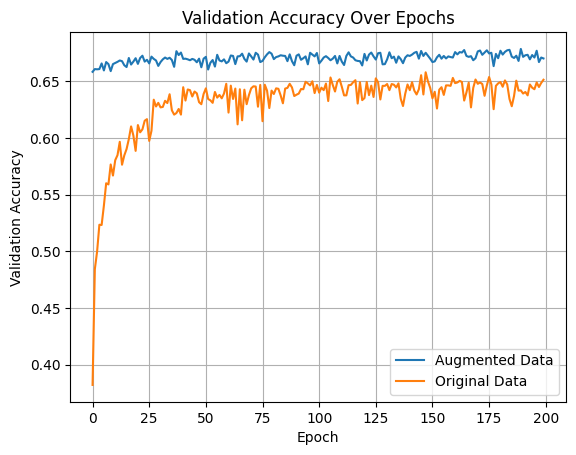

In [80]:
plt.plot(augmented_history.history['val_accuracy'], label = "Augmented Data")
plt.plot(baseline_history.history['val_accuracy'],label = "Original Data")
plt.xlabel('Epoch')
plt.ylabel('Validation Accuracy')
plt.title('Validation Accuracy Over Epochs')
plt.grid(True)
plt.legend()
plt.show()

# Question 4

In [3]:
(train_images, train_labels), (test_images, test_labels) = keras.datasets.cifar10.load_data()

In [4]:
main_task_train_images = train_images[-500:]
main_task_train_labels = train_labels[-500:]
main_task_train_images = (main_task_train_images/127.5) - 1.0
main_task_train_labels = tf.keras.utils.to_categorical(main_task_train_labels,num_classes=10)

## Pretext Learning

In [5]:
pretext_task_train_images = train_images[:-500]
pretext_task_train_labels = np.zeros(len(pretext_task_train_images), dtype=np.int32)

In [6]:
flipped_images = np.flip(pretext_task_train_images, axis=2)
rotated_images = np.rot90(pretext_task_train_images, axes=(1, 2))

In [7]:
pretext_task_train_images = np.concatenate([pretext_task_train_images, flipped_images, rotated_images])
pretext_task_train_labels = np.concatenate([pretext_task_train_labels, np.ones(len(flipped_images), dtype=np.int32), np.ones(len(rotated_images), dtype=np.int32)*2])

In [8]:
pretext_task_train_images = (pretext_task_train_images/127.5) - 1.0
pretext_task_train_labels = tf.keras.utils.to_categorical(pretext_task_train_labels,num_classes=3)

In [9]:
pretext_model = models.Sequential([
    layers.Conv2D(10, (5, 5), activation='relu', kernel_initializer=initializers.he_normal(), input_shape=(32, 32, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(10, (5, 5), activation='relu', kernel_initializer=initializers.he_normal()),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(20, activation='relu', kernel_initializer=initializers.he_normal()),
    layers.Dense(3, activation='softmax', kernel_initializer=initializers.he_normal())
])

In [10]:
pretext_model.compile(optimizer='adam',
                       loss='categorical_crossentropy',
                       metrics=['accuracy'])


In [11]:
pretext_model_history = pretext_model.fit(pretext_task_train_images, pretext_task_train_labels, epochs=100,batch_size =500,shuffle = True)


Epoch 1/100
297/297 [==============================] - 14s 45ms/step - loss: 0.9674 - accuracy: 0.4669
Epoch 2/100
297/297 [==============================] - 13s 44ms/step - loss: 0.8890 - accuracy: 0.5175
Epoch 3/100
297/297 [==============================] - 13s 45ms/step - loss: 0.8675 - accuracy: 0.5287
Epoch 4/100
297/297 [==============================] - 13s 44ms/step - loss: 0.8502 - accuracy: 0.5375
Epoch 5/100
297/297 [==============================] - 13s 44ms/step - loss: 0.8372 - accuracy: 0.5448
Epoch 6/100
297/297 [==============================] - 13s 45ms/step - loss: 0.8260 - accuracy: 0.5500
Epoch 7/100
297/297 [==============================] - 13s 44ms/step - loss: 0.8172 - accuracy: 0.5560
Epoch 8/100
297/297 [==============================] - 13s 45ms/step - loss: 0.8107 - accuracy: 0.5590
Epoch 9/100
297/297 [==============================] - 13s 45ms/step - loss: 0.8038 - accuracy: 0.5628
Epoch 10/100
297/297 [==============================] - 13s 45ms/step - l

In [12]:
pretext_model.save("pretext_model")

INFO:tensorflow:Assets written to: pretext_model\assets


INFO:tensorflow:Assets written to: pretext_model\assets


## Baseline Model

In [13]:
main_task_test_images = train_images[-10500:-500]
main_task_test_labels = train_labels[-10500:-500]
main_task_test_images = (main_task_test_images/127.5) - 1
main_task_test_labels = tf.keras.utils.to_categorical(main_task_test_labels,num_classes = 10)

In [14]:
main_task_test_images.shape

(10000, 32, 32, 3)

In [15]:
baseline_model = models.Sequential([
    layers.Conv2D(10, (5, 5), activation='relu',kernel_initializer=initializers.he_normal(), input_shape=(32, 32, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(10, (5, 5), activation='relu',kernel_initializer=initializers.he_normal()),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(20, activation='relu',kernel_initializer=initializers.he_normal()),
    layers.Dense(10, activation='softmax')
])

In [16]:
baseline_model.compile(optimizer='adam',
                       loss='categorical_crossentropy',
                       metrics=['accuracy'])


In [17]:
baseline_model_history = baseline_model.fit(main_task_train_images, main_task_train_labels, epochs=10000,validation_data=(main_task_test_images, main_task_test_labels))

Epoch 1/10000
16/16 [==============================] - 2s 77ms/step - loss: 2.3892 - accuracy: 0.1480 - val_loss: 2.2787 - val_accuracy: 0.1512
Epoch 2/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.2062 - accuracy: 0.2140 - val_loss: 2.2126 - val_accuracy: 0.1856
Epoch 3/10000
16/16 [==============================] - 1s 61ms/step - loss: 2.1217 - accuracy: 0.2400 - val_loss: 2.1689 - val_accuracy: 0.2114
Epoch 4/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.0427 - accuracy: 0.2440 - val_loss: 2.1338 - val_accuracy: 0.2155
Epoch 5/10000
16/16 [==============================] - 1s 62ms/step - loss: 1.9549 - accuracy: 0.2980 - val_loss: 2.0847 - val_accuracy: 0.2444
Epoch 6/10000
16/16 [==============================] - 1s 62ms/step - loss: 1.8855 - accuracy: 0.3100 - val_loss: 2.0650 - val_accuracy: 0.2549
Epoch 7/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.8070 - accuracy: 0.3780 - val_loss: 2.0675 - val_accuracy:

16/16 [==============================] - 1s 68ms/step - loss: 0.0045 - accuracy: 1.0000 - val_loss: 6.3181 - val_accuracy: 0.3134
Epoch 114/10000
16/16 [==============================] - 1s 75ms/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 6.3448 - val_accuracy: 0.3118
Epoch 115/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.0042 - accuracy: 1.0000 - val_loss: 6.3616 - val_accuracy: 0.3131
Epoch 116/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.0041 - accuracy: 1.0000 - val_loss: 6.3894 - val_accuracy: 0.3124
Epoch 117/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0040 - accuracy: 1.0000 - val_loss: 6.4047 - val_accuracy: 0.3127
Epoch 118/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0039 - accuracy: 1.0000 - val_loss: 6.4383 - val_accuracy: 0.3119
Epoch 119/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.0039 - accuracy: 1.0000 - val_loss: 6.4460 - val_accuracy: 0

16/16 [==============================] - 1s 61ms/step - loss: 5.9083e-04 - accuracy: 1.0000 - val_loss: 8.0050 - val_accuracy: 0.3104
Epoch 225/10000
16/16 [==============================] - 1s 61ms/step - loss: 5.8516e-04 - accuracy: 1.0000 - val_loss: 8.0168 - val_accuracy: 0.3113
Epoch 226/10000
16/16 [==============================] - 1s 63ms/step - loss: 5.7584e-04 - accuracy: 1.0000 - val_loss: 8.0351 - val_accuracy: 0.3111
Epoch 227/10000
16/16 [==============================] - 1s 68ms/step - loss: 5.6775e-04 - accuracy: 1.0000 - val_loss: 8.0408 - val_accuracy: 0.3112
Epoch 228/10000
16/16 [==============================] - 1s 70ms/step - loss: 5.6126e-04 - accuracy: 1.0000 - val_loss: 8.0519 - val_accuracy: 0.3110
Epoch 229/10000
16/16 [==============================] - 1s 69ms/step - loss: 5.5126e-04 - accuracy: 1.0000 - val_loss: 8.0664 - val_accuracy: 0.3105
Epoch 230/10000
16/16 [==============================] - 1s 69ms/step - loss: 5.4760e-04 - accuracy: 1.0000 - val_lo

Epoch 279/10000
16/16 [==============================] - 1s 79ms/step - loss: 2.9489e-04 - accuracy: 1.0000 - val_loss: 8.5993 - val_accuracy: 0.3094
Epoch 280/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.8629e-04 - accuracy: 1.0000 - val_loss: 8.6118 - val_accuracy: 0.3103
Epoch 281/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.8378e-04 - accuracy: 1.0000 - val_loss: 8.6230 - val_accuracy: 0.3102
Epoch 282/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.7823e-04 - accuracy: 1.0000 - val_loss: 8.6300 - val_accuracy: 0.3093
Epoch 283/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.7631e-04 - accuracy: 1.0000 - val_loss: 8.6454 - val_accuracy: 0.3102
Epoch 284/10000
16/16 [==============================] - 1s 79ms/step - loss: 2.7300e-04 - accuracy: 1.0000 - val_loss: 8.6470 - val_accuracy: 0.3091
Epoch 285/10000
16/16 [==============================] - 1s 72ms/step - loss: 2.7043e-04 - accuracy:

Epoch 388/10000
16/16 [==============================] - 1s 68ms/step - loss: 8.6034e-05 - accuracy: 1.0000 - val_loss: 9.6248 - val_accuracy: 0.3089
Epoch 389/10000
16/16 [==============================] - 1s 69ms/step - loss: 8.4691e-05 - accuracy: 1.0000 - val_loss: 9.6315 - val_accuracy: 0.3090
Epoch 390/10000
16/16 [==============================] - 1s 83ms/step - loss: 8.4170e-05 - accuracy: 1.0000 - val_loss: 9.6448 - val_accuracy: 0.3089
Epoch 391/10000
16/16 [==============================] - 1s 75ms/step - loss: 8.2938e-05 - accuracy: 1.0000 - val_loss: 9.6520 - val_accuracy: 0.3086
Epoch 392/10000
16/16 [==============================] - 1s 69ms/step - loss: 8.2826e-05 - accuracy: 1.0000 - val_loss: 9.6632 - val_accuracy: 0.3085
Epoch 393/10000
16/16 [==============================] - 1s 68ms/step - loss: 8.1989e-05 - accuracy: 1.0000 - val_loss: 9.6674 - val_accuracy: 0.3089
Epoch 394/10000
16/16 [==============================] - 1s 68ms/step - loss: 8.0681e-05 - accuracy:

16/16 [==============================] - 1s 75ms/step - loss: 2.8795e-05 - accuracy: 1.0000 - val_loss: 10.5327 - val_accuracy: 0.3097
Epoch 497/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.8451e-05 - accuracy: 1.0000 - val_loss: 10.5374 - val_accuracy: 0.3090
Epoch 498/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.8081e-05 - accuracy: 1.0000 - val_loss: 10.5472 - val_accuracy: 0.3094
Epoch 499/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.7823e-05 - accuracy: 1.0000 - val_loss: 10.5554 - val_accuracy: 0.3094
Epoch 500/10000
16/16 [==============================] - 1s 79ms/step - loss: 2.7662e-05 - accuracy: 1.0000 - val_loss: 10.5641 - val_accuracy: 0.3096
Epoch 501/10000
16/16 [==============================] - 1s 76ms/step - loss: 2.7318e-05 - accuracy: 1.0000 - val_loss: 10.5723 - val_accuracy: 0.3097
Epoch 502/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.6959e-05 - accuracy: 1.0000 - 

16/16 [==============================] - 1s 70ms/step - loss: 1.0095e-05 - accuracy: 1.0000 - val_loss: 11.3970 - val_accuracy: 0.3094
Epoch 605/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.0034e-05 - accuracy: 1.0000 - val_loss: 11.4054 - val_accuracy: 0.3099
Epoch 606/10000
16/16 [==============================] - 1s 87ms/step - loss: 9.9908e-06 - accuracy: 1.0000 - val_loss: 11.4122 - val_accuracy: 0.3094
Epoch 607/10000
16/16 [==============================] - 1s 75ms/step - loss: 9.7815e-06 - accuracy: 1.0000 - val_loss: 11.4178 - val_accuracy: 0.3093
Epoch 608/10000
16/16 [==============================] - 1s 68ms/step - loss: 9.7293e-06 - accuracy: 1.0000 - val_loss: 11.4293 - val_accuracy: 0.3097
Epoch 609/10000
16/16 [==============================] - 1s 66ms/step - loss: 9.6723e-06 - accuracy: 1.0000 - val_loss: 11.4347 - val_accuracy: 0.3090
Epoch 610/10000
16/16 [==============================] - 1s 69ms/step - loss: 9.5753e-06 - accuracy: 1.0000 - 

16/16 [==============================] - 1s 86ms/step - loss: 3.6766e-06 - accuracy: 1.0000 - val_loss: 12.2386 - val_accuracy: 0.3088
Epoch 713/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.6387e-06 - accuracy: 1.0000 - val_loss: 12.2430 - val_accuracy: 0.3088
Epoch 714/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.6208e-06 - accuracy: 1.0000 - val_loss: 12.2523 - val_accuracy: 0.3089
Epoch 715/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.6013e-06 - accuracy: 1.0000 - val_loss: 12.2584 - val_accuracy: 0.3085
Epoch 716/10000
16/16 [==============================] - 1s 73ms/step - loss: 3.5457e-06 - accuracy: 1.0000 - val_loss: 12.2678 - val_accuracy: 0.3087
Epoch 717/10000
16/16 [==============================] - 1s 87ms/step - loss: 3.5212e-06 - accuracy: 1.0000 - val_loss: 12.2779 - val_accuracy: 0.3094
Epoch 718/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.4859e-06 - accuracy: 1.0000 - 

16/16 [==============================] - 1s 63ms/step - loss: 1.3595e-06 - accuracy: 1.0000 - val_loss: 13.0644 - val_accuracy: 0.3088
Epoch 821/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.3566e-06 - accuracy: 1.0000 - val_loss: 13.0672 - val_accuracy: 0.3087
Epoch 822/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.3378e-06 - accuracy: 1.0000 - val_loss: 13.0769 - val_accuracy: 0.3089
Epoch 823/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.3239e-06 - accuracy: 1.0000 - val_loss: 13.0827 - val_accuracy: 0.3091
Epoch 824/10000
16/16 [==============================] - 1s 62ms/step - loss: 1.3132e-06 - accuracy: 1.0000 - val_loss: 13.0949 - val_accuracy: 0.3091
Epoch 825/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.3118e-06 - accuracy: 1.0000 - val_loss: 13.0958 - val_accuracy: 0.3090
Epoch 826/10000
16/16 [==============================] - 1s 62ms/step - loss: 1.2925e-06 - accuracy: 1.0000 - 

16/16 [==============================] - 1s 76ms/step - loss: 5.1212e-07 - accuracy: 1.0000 - val_loss: 13.8673 - val_accuracy: 0.3096
Epoch 929/10000
16/16 [==============================] - 1s 70ms/step - loss: 5.0783e-07 - accuracy: 1.0000 - val_loss: 13.8741 - val_accuracy: 0.3088
Epoch 930/10000
16/16 [==============================] - 1s 70ms/step - loss: 5.0163e-07 - accuracy: 1.0000 - val_loss: 13.8832 - val_accuracy: 0.3092
Epoch 931/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.9972e-07 - accuracy: 1.0000 - val_loss: 13.8906 - val_accuracy: 0.3093
Epoch 932/10000
16/16 [==============================] - 1s 75ms/step - loss: 4.9543e-07 - accuracy: 1.0000 - val_loss: 13.8977 - val_accuracy: 0.3096
Epoch 933/10000
16/16 [==============================] - 1s 76ms/step - loss: 4.8900e-07 - accuracy: 1.0000 - val_loss: 13.9050 - val_accuracy: 0.3093
Epoch 934/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.8470e-07 - accuracy: 1.0000 - 

16/16 [==============================] - 1s 70ms/step - loss: 1.9121e-07 - accuracy: 1.0000 - val_loss: 14.6357 - val_accuracy: 0.3099
Epoch 1037/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.9097e-07 - accuracy: 1.0000 - val_loss: 14.6424 - val_accuracy: 0.3092
Epoch 1038/10000
16/16 [==============================] - 1s 80ms/step - loss: 1.8787e-07 - accuracy: 1.0000 - val_loss: 14.6490 - val_accuracy: 0.3096
Epoch 1039/10000
16/16 [==============================] - 1s 76ms/step - loss: 1.8525e-07 - accuracy: 1.0000 - val_loss: 14.6564 - val_accuracy: 0.3098
Epoch 1040/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.8430e-07 - accuracy: 1.0000 - val_loss: 14.6636 - val_accuracy: 0.3092
Epoch 1041/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.8239e-07 - accuracy: 1.0000 - val_loss: 14.6672 - val_accuracy: 0.3092
Epoch 1042/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.8096e-07 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 1.1492e-07 - accuracy: 1.0000 - val_loss: 14.9785 - val_accuracy: 0.3092
Epoch 1091/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.1468e-07 - accuracy: 1.0000 - val_loss: 14.9846 - val_accuracy: 0.3093
Epoch 1092/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.1206e-07 - accuracy: 1.0000 - val_loss: 14.9916 - val_accuracy: 0.3090
Epoch 1093/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.1420e-07 - accuracy: 1.0000 - val_loss: 14.9988 - val_accuracy: 0.3091
Epoch 1094/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.1420e-07 - accuracy: 1.0000 - val_loss: 15.0031 - val_accuracy: 0.3091
Epoch 1095/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.1206e-07 - accuracy: 1.0000 - val_loss: 15.0079 - val_accuracy: 0.3095
Epoch 1096/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.1158e-07 - accuracy: 1.0

16/16 [==============================] - 1s 62ms/step - loss: 6.9857e-08 - accuracy: 1.0000 - val_loss: 15.2769 - val_accuracy: 0.3098
Epoch 1145/10000
16/16 [==============================] - 1s 67ms/step - loss: 6.8903e-08 - accuracy: 1.0000 - val_loss: 15.2903 - val_accuracy: 0.3094
Epoch 1146/10000
16/16 [==============================] - 1s 67ms/step - loss: 7.0572e-08 - accuracy: 1.0000 - val_loss: 15.2907 - val_accuracy: 0.3098
Epoch 1147/10000
16/16 [==============================] - 1s 64ms/step - loss: 6.8188e-08 - accuracy: 1.0000 - val_loss: 15.2938 - val_accuracy: 0.3093
Epoch 1148/10000
16/16 [==============================] - 1s 63ms/step - loss: 6.8903e-08 - accuracy: 1.0000 - val_loss: 15.3012 - val_accuracy: 0.3095
Epoch 1149/10000
16/16 [==============================] - 1s 63ms/step - loss: 6.6996e-08 - accuracy: 1.0000 - val_loss: 15.3104 - val_accuracy: 0.3094
Epoch 1150/10000
16/16 [==============================] - 1s 62ms/step - loss: 6.4611e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 4.3392e-08 - accuracy: 1.0000 - val_loss: 15.5087 - val_accuracy: 0.3096
Epoch 1199/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.3154e-08 - accuracy: 1.0000 - val_loss: 15.5102 - val_accuracy: 0.3091
Epoch 1200/10000
16/16 [==============================] - 1s 71ms/step - loss: 4.1246e-08 - accuracy: 1.0000 - val_loss: 15.5151 - val_accuracy: 0.3094
Epoch 1201/10000
16/16 [==============================] - 1s 71ms/step - loss: 4.1008e-08 - accuracy: 1.0000 - val_loss: 15.5162 - val_accuracy: 0.3096
Epoch 1202/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.1723e-08 - accuracy: 1.0000 - val_loss: 15.5186 - val_accuracy: 0.3091
Epoch 1203/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.0293e-08 - accuracy: 1.0000 - val_loss: 15.5225 - val_accuracy: 0.3092
Epoch 1204/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.3631e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 2.8849e-08 - accuracy: 1.0000 - val_loss: 15.6610 - val_accuracy: 0.3086
Epoch 1253/10000
16/16 [==============================] - 1s 77ms/step - loss: 2.7180e-08 - accuracy: 1.0000 - val_loss: 15.6680 - val_accuracy: 0.3092
Epoch 1254/10000
16/16 [==============================] - 1s 77ms/step - loss: 3.0041e-08 - accuracy: 1.0000 - val_loss: 15.6682 - val_accuracy: 0.3090
Epoch 1255/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.6226e-08 - accuracy: 1.0000 - val_loss: 15.6690 - val_accuracy: 0.3084
Epoch 1256/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.6703e-08 - accuracy: 1.0000 - val_loss: 15.6786 - val_accuracy: 0.3082
Epoch 1257/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.7180e-08 - accuracy: 1.0000 - val_loss: 15.6752 - val_accuracy: 0.3084
Epoch 1258/10000
16/16 [==============================] - 1s 72ms/step - loss: 2.6941e-08 - accuracy: 1.0

16/16 [==============================] - 1s 74ms/step - loss: 1.9312e-08 - accuracy: 1.0000 - val_loss: 15.8834 - val_accuracy: 0.3097
Epoch 1307/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.3365e-08 - accuracy: 1.0000 - val_loss: 15.8899 - val_accuracy: 0.3099
Epoch 1308/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.9312e-08 - accuracy: 1.0000 - val_loss: 15.8916 - val_accuracy: 0.3087
Epoch 1309/10000
16/16 [==============================] - 1s 85ms/step - loss: 1.9312e-08 - accuracy: 1.0000 - val_loss: 15.9075 - val_accuracy: 0.3094
Epoch 1310/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.9789e-08 - accuracy: 1.0000 - val_loss: 15.9097 - val_accuracy: 0.3092
Epoch 1311/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.9789e-08 - accuracy: 1.0000 - val_loss: 15.9120 - val_accuracy: 0.3091
Epoch 1312/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.0742e-08 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 1.4782e-08 - accuracy: 1.0000 - val_loss: 16.4517 - val_accuracy: 0.3087
Epoch 1361/10000
16/16 [==============================] - 1s 89ms/step - loss: 1.7405e-08 - accuracy: 1.0000 - val_loss: 16.4645 - val_accuracy: 0.3083
Epoch 1362/10000
16/16 [==============================] - 1s 72ms/step - loss: 1.9550e-08 - accuracy: 1.0000 - val_loss: 16.4800 - val_accuracy: 0.3090
Epoch 1363/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.5497e-08 - accuracy: 1.0000 - val_loss: 16.4913 - val_accuracy: 0.3085
Epoch 1364/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.5974e-08 - accuracy: 1.0000 - val_loss: 16.5140 - val_accuracy: 0.3089
Epoch 1365/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.7166e-08 - accuracy: 1.0000 - val_loss: 16.5292 - val_accuracy: 0.3083
Epoch 1366/10000
16/16 [==============================] - 1s 86ms/step - loss: 1.6212e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 2.1219e-08 - accuracy: 1.0000 - val_loss: 17.8347 - val_accuracy: 0.3039
Epoch 1415/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.7643e-08 - accuracy: 1.0000 - val_loss: 17.8300 - val_accuracy: 0.3052
Epoch 1416/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.6212e-08 - accuracy: 1.0000 - val_loss: 17.8979 - val_accuracy: 0.3038
Epoch 1417/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.9312e-08 - accuracy: 1.0000 - val_loss: 17.9221 - val_accuracy: 0.3047
Epoch 1418/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8120e-08 - accuracy: 1.0000 - val_loss: 17.9461 - val_accuracy: 0.3054
Epoch 1419/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.8358e-08 - accuracy: 1.0000 - val_loss: 17.9692 - val_accuracy: 0.3039
Epoch 1420/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.2875e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 9.9907e-05 - accuracy: 1.0000 - val_loss: 13.3476 - val_accuracy: 0.3046
Epoch 1523/10000
16/16 [==============================] - 1s 65ms/step - loss: 9.8770e-05 - accuracy: 1.0000 - val_loss: 13.3499 - val_accuracy: 0.3046
Epoch 1524/10000
16/16 [==============================] - 1s 67ms/step - loss: 9.7637e-05 - accuracy: 1.0000 - val_loss: 13.3522 - val_accuracy: 0.3047
Epoch 1525/10000
16/16 [==============================] - 1s 70ms/step - loss: 9.6599e-05 - accuracy: 1.0000 - val_loss: 13.3546 - val_accuracy: 0.3046
Epoch 1526/10000
16/16 [==============================] - 1s 64ms/step - loss: 9.5517e-05 - accuracy: 1.0000 - val_loss: 13.3566 - val_accuracy: 0.3047
Epoch 1527/10000
16/16 [==============================] - 1s 64ms/step - loss: 9.4420e-05 - accuracy: 1.0000 - val_loss: 13.3589 - val_accuracy: 0.3049
Epoch 1528/10000
16/16 [==============================] - 1s 63ms/step - loss: 9.3388e-05 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 5.9372e-05 - accuracy: 1.0000 - val_loss: 13.4598 - val_accuracy: 0.3057
Epoch 1577/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.8887e-05 - accuracy: 1.0000 - val_loss: 13.4614 - val_accuracy: 0.3060
Epoch 1578/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.8378e-05 - accuracy: 1.0000 - val_loss: 13.4636 - val_accuracy: 0.3060
Epoch 1579/10000
16/16 [==============================] - 1s 64ms/step - loss: 5.7901e-05 - accuracy: 1.0000 - val_loss: 13.4656 - val_accuracy: 0.3060
Epoch 1580/10000
16/16 [==============================] - 1s 70ms/step - loss: 5.7430e-05 - accuracy: 1.0000 - val_loss: 13.4672 - val_accuracy: 0.3060
Epoch 1581/10000
16/16 [==============================] - 1s 69ms/step - loss: 5.6942e-05 - accuracy: 1.0000 - val_loss: 13.4696 - val_accuracy: 0.3061
Epoch 1582/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.6475e-05 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 3.9011e-05 - accuracy: 1.0000 - val_loss: 13.5652 - val_accuracy: 0.3068
Epoch 1631/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.8716e-05 - accuracy: 1.0000 - val_loss: 13.5670 - val_accuracy: 0.3067
Epoch 1632/10000
16/16 [==============================] - 1s 62ms/step - loss: 3.8463e-05 - accuracy: 1.0000 - val_loss: 13.5693 - val_accuracy: 0.3065
Epoch 1633/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.8182e-05 - accuracy: 1.0000 - val_loss: 13.5715 - val_accuracy: 0.3065
Epoch 1634/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.7890e-05 - accuracy: 1.0000 - val_loss: 13.5735 - val_accuracy: 0.3065
Epoch 1635/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.7621e-05 - accuracy: 1.0000 - val_loss: 13.5756 - val_accuracy: 0.3065
Epoch 1636/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.7346e-05 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 2.6766e-05 - accuracy: 1.0000 - val_loss: 13.6747 - val_accuracy: 0.3067
Epoch 1685/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.6582e-05 - accuracy: 1.0000 - val_loss: 13.6769 - val_accuracy: 0.3067
Epoch 1686/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.6407e-05 - accuracy: 1.0000 - val_loss: 13.6791 - val_accuracy: 0.3069
Epoch 1687/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.6226e-05 - accuracy: 1.0000 - val_loss: 13.6806 - val_accuracy: 0.3070
Epoch 1688/10000
16/16 [==============================] - 1s 62ms/step - loss: 2.6086e-05 - accuracy: 1.0000 - val_loss: 13.6829 - val_accuracy: 0.3070
Epoch 1689/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.5895e-05 - accuracy: 1.0000 - val_loss: 13.6851 - val_accuracy: 0.3069
Epoch 1690/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.5701e-05 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 1.8507e-05 - accuracy: 1.0000 - val_loss: 13.7933 - val_accuracy: 0.3063
Epoch 1739/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8382e-05 - accuracy: 1.0000 - val_loss: 13.7956 - val_accuracy: 0.3063
Epoch 1740/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8267e-05 - accuracy: 1.0000 - val_loss: 13.7981 - val_accuracy: 0.3063
Epoch 1741/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.8142e-05 - accuracy: 1.0000 - val_loss: 13.7999 - val_accuracy: 0.3064
Epoch 1742/10000
16/16 [==============================] - 1s 72ms/step - loss: 1.8008e-05 - accuracy: 1.0000 - val_loss: 13.8022 - val_accuracy: 0.3063
Epoch 1743/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.7881e-05 - accuracy: 1.0000 - val_loss: 13.8043 - val_accuracy: 0.3064
Epoch 1744/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.7778e-05 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 1.2708e-05 - accuracy: 1.0000 - val_loss: 13.9171 - val_accuracy: 0.3076
Epoch 1793/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.2634e-05 - accuracy: 1.0000 - val_loss: 13.9196 - val_accuracy: 0.3077
Epoch 1794/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.2539e-05 - accuracy: 1.0000 - val_loss: 13.9220 - val_accuracy: 0.3076
Epoch 1795/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.2451e-05 - accuracy: 1.0000 - val_loss: 13.9244 - val_accuracy: 0.3076
Epoch 1796/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.2366e-05 - accuracy: 1.0000 - val_loss: 13.9269 - val_accuracy: 0.3075
Epoch 1797/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.2286e-05 - accuracy: 1.0000 - val_loss: 13.9291 - val_accuracy: 0.3075
Epoch 1798/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.2211e-05 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 8.8511e-06 - accuracy: 1.0000 - val_loss: 14.0436 - val_accuracy: 0.3076
Epoch 1847/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.8003e-06 - accuracy: 1.0000 - val_loss: 14.0459 - val_accuracy: 0.3075
Epoch 1848/10000
16/16 [==============================] - 1s 70ms/step - loss: 8.7400e-06 - accuracy: 1.0000 - val_loss: 14.0486 - val_accuracy: 0.3077
Epoch 1849/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.6842e-06 - accuracy: 1.0000 - val_loss: 14.0513 - val_accuracy: 0.3077
Epoch 1850/10000
16/16 [==============================] - 1s 63ms/step - loss: 8.6272e-06 - accuracy: 1.0000 - val_loss: 14.0532 - val_accuracy: 0.3077
Epoch 1851/10000
16/16 [==============================] - 1s 66ms/step - loss: 8.5678e-06 - accuracy: 1.0000 - val_loss: 14.0556 - val_accuracy: 0.3078
Epoch 1852/10000
16/16 [==============================] - 1s 64ms/step - loss: 8.5151e-06 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 6.2336e-06 - accuracy: 1.0000 - val_loss: 14.1759 - val_accuracy: 0.3087
Epoch 1901/10000
16/16 [==============================] - 1s 64ms/step - loss: 6.1933e-06 - accuracy: 1.0000 - val_loss: 14.1790 - val_accuracy: 0.3085
Epoch 1902/10000
16/16 [==============================] - 1s 64ms/step - loss: 6.1518e-06 - accuracy: 1.0000 - val_loss: 14.1812 - val_accuracy: 0.3087
Epoch 1903/10000
16/16 [==============================] - 1s 69ms/step - loss: 6.1072e-06 - accuracy: 1.0000 - val_loss: 14.1841 - val_accuracy: 0.3086
Epoch 1904/10000
16/16 [==============================] - 1s 71ms/step - loss: 6.0657e-06 - accuracy: 1.0000 - val_loss: 14.1864 - val_accuracy: 0.3085
Epoch 1905/10000
16/16 [==============================] - 1s 66ms/step - loss: 6.0247e-06 - accuracy: 1.0000 - val_loss: 14.1893 - val_accuracy: 0.3084
Epoch 1906/10000
16/16 [==============================] - 1s 70ms/step - loss: 5.9902e-06 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 4.3129e-06 - accuracy: 1.0000 - val_loss: 14.3251 - val_accuracy: 0.3087
Epoch 1955/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.2827e-06 - accuracy: 1.0000 - val_loss: 14.3278 - val_accuracy: 0.3087
Epoch 1956/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.2536e-06 - accuracy: 1.0000 - val_loss: 14.3309 - val_accuracy: 0.3088
Epoch 1957/10000
16/16 [==============================] - 1s 89ms/step - loss: 4.2254e-06 - accuracy: 1.0000 - val_loss: 14.3335 - val_accuracy: 0.3088
Epoch 1958/10000
16/16 [==============================] - 1s 73ms/step - loss: 4.1961e-06 - accuracy: 1.0000 - val_loss: 14.3364 - val_accuracy: 0.3089
Epoch 1959/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.1697e-06 - accuracy: 1.0000 - val_loss: 14.3394 - val_accuracy: 0.3091
Epoch 1960/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.1387e-06 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 2.9859e-06 - accuracy: 1.0000 - val_loss: 14.4826 - val_accuracy: 0.3096
Epoch 2009/10000
16/16 [==============================] - 1s 83ms/step - loss: 2.9702e-06 - accuracy: 1.0000 - val_loss: 14.4855 - val_accuracy: 0.3095
Epoch 2010/10000
16/16 [==============================] - 1s 75ms/step - loss: 2.9447e-06 - accuracy: 1.0000 - val_loss: 14.4880 - val_accuracy: 0.3097
Epoch 2011/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.9230e-06 - accuracy: 1.0000 - val_loss: 14.4906 - val_accuracy: 0.3096
Epoch 2012/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.9073e-06 - accuracy: 1.0000 - val_loss: 14.4942 - val_accuracy: 0.3096
Epoch 2013/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.8872e-06 - accuracy: 1.0000 - val_loss: 14.4968 - val_accuracy: 0.3097
Epoch 2014/10000
16/16 [==============================] - 1s 86ms/step - loss: 2.8677e-06 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 2.0604e-06 - accuracy: 1.0000 - val_loss: 14.6492 - val_accuracy: 0.3089
Epoch 2063/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.0478e-06 - accuracy: 1.0000 - val_loss: 14.6526 - val_accuracy: 0.3090
Epoch 2064/10000
16/16 [==============================] - 1s 76ms/step - loss: 2.0308e-06 - accuracy: 1.0000 - val_loss: 14.6555 - val_accuracy: 0.3091
Epoch 2065/10000
16/16 [==============================] - 1s 76ms/step - loss: 2.0180e-06 - accuracy: 1.0000 - val_loss: 14.6582 - val_accuracy: 0.3090
Epoch 2066/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.0049e-06 - accuracy: 1.0000 - val_loss: 14.6621 - val_accuracy: 0.3092
Epoch 2067/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.9905e-06 - accuracy: 1.0000 - val_loss: 14.6654 - val_accuracy: 0.3091
Epoch 2068/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.9770e-06 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 1.4069e-06 - accuracy: 1.0000 - val_loss: 14.8230 - val_accuracy: 0.3101
Epoch 2117/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.3988e-06 - accuracy: 1.0000 - val_loss: 14.8261 - val_accuracy: 0.3104
Epoch 2118/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.3871e-06 - accuracy: 1.0000 - val_loss: 14.8296 - val_accuracy: 0.3105
Epoch 2119/10000
16/16 [==============================] - 1s 79ms/step - loss: 1.3776e-06 - accuracy: 1.0000 - val_loss: 14.8338 - val_accuracy: 0.3105
Epoch 2120/10000
16/16 [==============================] - 1s 78ms/step - loss: 1.3688e-06 - accuracy: 1.0000 - val_loss: 14.8370 - val_accuracy: 0.3105
Epoch 2121/10000
16/16 [==============================] - 1s 73ms/step - loss: 1.3580e-06 - accuracy: 1.0000 - val_loss: 14.8406 - val_accuracy: 0.3104
Epoch 2122/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.3466e-06 - accuracy: 1.0

16/16 [==============================] - 1s 84ms/step - loss: 9.5439e-07 - accuracy: 1.0000 - val_loss: 15.0056 - val_accuracy: 0.3100
Epoch 2171/10000
16/16 [==============================] - 1s 69ms/step - loss: 9.4700e-07 - accuracy: 1.0000 - val_loss: 15.0093 - val_accuracy: 0.3102
Epoch 2172/10000
16/16 [==============================] - 1s 69ms/step - loss: 9.4104e-07 - accuracy: 1.0000 - val_loss: 15.0127 - val_accuracy: 0.3101
Epoch 2173/10000
16/16 [==============================] - 1s 68ms/step - loss: 9.3484e-07 - accuracy: 1.0000 - val_loss: 15.0158 - val_accuracy: 0.3102
Epoch 2174/10000
16/16 [==============================] - 1s 80ms/step - loss: 9.2768e-07 - accuracy: 1.0000 - val_loss: 15.0197 - val_accuracy: 0.3102
Epoch 2175/10000
16/16 [==============================] - 1s 76ms/step - loss: 9.2125e-07 - accuracy: 1.0000 - val_loss: 15.0235 - val_accuracy: 0.3103
Epoch 2176/10000
16/16 [==============================] - 1s 74ms/step - loss: 9.1338e-07 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 6.4087e-07 - accuracy: 1.0000 - val_loss: 15.1983 - val_accuracy: 0.3098
Epoch 2225/10000
16/16 [==============================] - 1s 77ms/step - loss: 6.3538e-07 - accuracy: 1.0000 - val_loss: 15.2019 - val_accuracy: 0.3097
Epoch 2226/10000
16/16 [==============================] - 1s 71ms/step - loss: 6.3062e-07 - accuracy: 1.0000 - val_loss: 15.2056 - val_accuracy: 0.3098
Epoch 2227/10000
16/16 [==============================] - 1s 68ms/step - loss: 6.2632e-07 - accuracy: 1.0000 - val_loss: 15.2093 - val_accuracy: 0.3099
Epoch 2228/10000
16/16 [==============================] - 1s 69ms/step - loss: 6.2394e-07 - accuracy: 1.0000 - val_loss: 15.2129 - val_accuracy: 0.3099
Epoch 2229/10000
16/16 [==============================] - 1s 68ms/step - loss: 6.1965e-07 - accuracy: 1.0000 - val_loss: 15.2157 - val_accuracy: 0.3097
Epoch 2230/10000
16/16 [==============================] - 1s 82ms/step - loss: 6.1560e-07 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 4.3154e-07 - accuracy: 1.0000 - val_loss: 15.3937 - val_accuracy: 0.3097
Epoch 2279/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.3011e-07 - accuracy: 1.0000 - val_loss: 15.3992 - val_accuracy: 0.3097
Epoch 2280/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.2605e-07 - accuracy: 1.0000 - val_loss: 15.4023 - val_accuracy: 0.3097
Epoch 2281/10000
16/16 [==============================] - 1s 79ms/step - loss: 4.2343e-07 - accuracy: 1.0000 - val_loss: 15.4060 - val_accuracy: 0.3097
Epoch 2282/10000
16/16 [==============================] - 1s 72ms/step - loss: 4.2200e-07 - accuracy: 1.0000 - val_loss: 15.4104 - val_accuracy: 0.3099
Epoch 2283/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.1842e-07 - accuracy: 1.0000 - val_loss: 15.4137 - val_accuracy: 0.3100
Epoch 2284/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.1461e-07 - accuracy: 1.0

16/16 [==============================] - 1s 76ms/step - loss: 2.8992e-07 - accuracy: 1.0000 - val_loss: 15.6011 - val_accuracy: 0.3095
Epoch 2333/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.8753e-07 - accuracy: 1.0000 - val_loss: 15.6055 - val_accuracy: 0.3094
Epoch 2334/10000
16/16 [==============================] - 1s 72ms/step - loss: 2.8396e-07 - accuracy: 1.0000 - val_loss: 15.6091 - val_accuracy: 0.3095
Epoch 2335/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.8229e-07 - accuracy: 1.0000 - val_loss: 15.6130 - val_accuracy: 0.3096
Epoch 2336/10000
16/16 [==============================] - 1s 78ms/step - loss: 2.8014e-07 - accuracy: 1.0000 - val_loss: 15.6173 - val_accuracy: 0.3097
Epoch 2337/10000
16/16 [==============================] - 1s 79ms/step - loss: 2.7752e-07 - accuracy: 1.0000 - val_loss: 15.6202 - val_accuracy: 0.3097
Epoch 2338/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.7561e-07 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 1.9145e-07 - accuracy: 1.0000 - val_loss: 15.8199 - val_accuracy: 0.3096
Epoch 2387/10000
16/16 [==============================] - 1s 82ms/step - loss: 1.8859e-07 - accuracy: 1.0000 - val_loss: 15.8241 - val_accuracy: 0.3097
Epoch 2388/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.8764e-07 - accuracy: 1.0000 - val_loss: 15.8279 - val_accuracy: 0.3097
Epoch 2389/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.8668e-07 - accuracy: 1.0000 - val_loss: 15.8320 - val_accuracy: 0.3098
Epoch 2390/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.8573e-07 - accuracy: 1.0000 - val_loss: 15.8355 - val_accuracy: 0.3097
Epoch 2391/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.8382e-07 - accuracy: 1.0000 - val_loss: 15.8398 - val_accuracy: 0.3101
Epoch 2392/10000
16/16 [==============================] - 1s 88ms/step - loss: 1.8311e-07 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 1.2636e-07 - accuracy: 1.0000 - val_loss: 16.0484 - val_accuracy: 0.3110
Epoch 2441/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.2493e-07 - accuracy: 1.0000 - val_loss: 16.0529 - val_accuracy: 0.3110
Epoch 2442/10000
16/16 [==============================] - 1s 84ms/step - loss: 1.2374e-07 - accuracy: 1.0000 - val_loss: 16.0582 - val_accuracy: 0.3112
Epoch 2443/10000
16/16 [==============================] - 1s 72ms/step - loss: 1.2326e-07 - accuracy: 1.0000 - val_loss: 16.0617 - val_accuracy: 0.3112
Epoch 2444/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.2207e-07 - accuracy: 1.0000 - val_loss: 16.0659 - val_accuracy: 0.3111
Epoch 2445/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.2183e-07 - accuracy: 1.0000 - val_loss: 16.0701 - val_accuracy: 0.3112
Epoch 2446/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.2016e-07 - accuracy: 1.0

16/16 [==============================] - 1s 75ms/step - loss: 8.0109e-08 - accuracy: 1.0000 - val_loss: 16.2936 - val_accuracy: 0.3114
Epoch 2495/10000
16/16 [==============================] - 1s 69ms/step - loss: 7.9155e-08 - accuracy: 1.0000 - val_loss: 16.2975 - val_accuracy: 0.3117
Epoch 2496/10000
16/16 [==============================] - 1s 68ms/step - loss: 7.8917e-08 - accuracy: 1.0000 - val_loss: 16.3029 - val_accuracy: 0.3115
Epoch 2497/10000
16/16 [==============================] - 1s 69ms/step - loss: 7.9155e-08 - accuracy: 1.0000 - val_loss: 16.3075 - val_accuracy: 0.3116
Epoch 2498/10000
16/16 [==============================] - 1s 83ms/step - loss: 7.8201e-08 - accuracy: 1.0000 - val_loss: 16.3123 - val_accuracy: 0.3116
Epoch 2499/10000
16/16 [==============================] - 1s 72ms/step - loss: 7.8678e-08 - accuracy: 1.0000 - val_loss: 16.3171 - val_accuracy: 0.3118
Epoch 2500/10000
16/16 [==============================] - 1s 69ms/step - loss: 7.6771e-08 - accuracy: 1.0

16/16 [==============================] - 1s 80ms/step - loss: 4.6968e-08 - accuracy: 1.0000 - val_loss: 16.5589 - val_accuracy: 0.3118
Epoch 2549/10000
16/16 [==============================] - 1s 79ms/step - loss: 4.6730e-08 - accuracy: 1.0000 - val_loss: 16.5643 - val_accuracy: 0.3122
Epoch 2550/10000
16/16 [==============================] - 1s 71ms/step - loss: 4.5300e-08 - accuracy: 1.0000 - val_loss: 16.5698 - val_accuracy: 0.3124
Epoch 2551/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.6492e-08 - accuracy: 1.0000 - val_loss: 16.5753 - val_accuracy: 0.3116
Epoch 2552/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.5300e-08 - accuracy: 1.0000 - val_loss: 16.5792 - val_accuracy: 0.3121
Epoch 2553/10000
16/16 [==============================] - 1s 79ms/step - loss: 4.4823e-08 - accuracy: 1.0000 - val_loss: 16.5849 - val_accuracy: 0.3122
Epoch 2554/10000
16/16 [==============================] - 1s 82ms/step - loss: 4.4584e-08 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 2.6703e-08 - accuracy: 1.0000 - val_loss: 16.8523 - val_accuracy: 0.3122
Epoch 2603/10000
16/16 [==============================] - 1s 79ms/step - loss: 2.6464e-08 - accuracy: 1.0000 - val_loss: 16.8601 - val_accuracy: 0.3123
Epoch 2604/10000
16/16 [==============================] - 1s 79ms/step - loss: 2.7180e-08 - accuracy: 1.0000 - val_loss: 16.8674 - val_accuracy: 0.3123
Epoch 2605/10000
16/16 [==============================] - 1s 72ms/step - loss: 2.6226e-08 - accuracy: 1.0000 - val_loss: 16.8716 - val_accuracy: 0.3124
Epoch 2606/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.5511e-08 - accuracy: 1.0000 - val_loss: 16.8772 - val_accuracy: 0.3126
Epoch 2607/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.5988e-08 - accuracy: 1.0000 - val_loss: 16.8843 - val_accuracy: 0.3123
Epoch 2608/10000
16/16 [==============================] - 1s 74ms/step - loss: 2.5272e-08 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 1.6212e-08 - accuracy: 1.0000 - val_loss: 17.2380 - val_accuracy: 0.3123
Epoch 2657/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.5259e-08 - accuracy: 1.0000 - val_loss: 17.2463 - val_accuracy: 0.3121
Epoch 2658/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.4782e-08 - accuracy: 1.0000 - val_loss: 17.2541 - val_accuracy: 0.3119
Epoch 2659/10000
16/16 [==============================] - 1s 87ms/step - loss: 1.5259e-08 - accuracy: 1.0000 - val_loss: 17.2616 - val_accuracy: 0.3119
Epoch 2660/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.5020e-08 - accuracy: 1.0000 - val_loss: 17.2702 - val_accuracy: 0.3117
Epoch 2661/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.4305e-08 - accuracy: 1.0000 - val_loss: 17.2785 - val_accuracy: 0.3118
Epoch 2662/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.5259e-08 - accuracy: 1.0

16/16 [==============================] - 1s 74ms/step - loss: 9.5367e-09 - accuracy: 1.0000 - val_loss: 17.7119 - val_accuracy: 0.3109
Epoch 2711/10000
16/16 [==============================] - 1s 71ms/step - loss: 9.2983e-09 - accuracy: 1.0000 - val_loss: 17.7235 - val_accuracy: 0.3114
Epoch 2712/10000
16/16 [==============================] - 1s 69ms/step - loss: 9.2983e-09 - accuracy: 1.0000 - val_loss: 17.7332 - val_accuracy: 0.3116
Epoch 2713/10000
16/16 [==============================] - 1s 68ms/step - loss: 9.0599e-09 - accuracy: 1.0000 - val_loss: 17.7425 - val_accuracy: 0.3116
Epoch 2714/10000
16/16 [==============================] - 1s 83ms/step - loss: 8.8215e-09 - accuracy: 1.0000 - val_loss: 17.7535 - val_accuracy: 0.3117
Epoch 2715/10000
16/16 [==============================] - 1s 74ms/step - loss: 9.7752e-09 - accuracy: 1.0000 - val_loss: 17.7640 - val_accuracy: 0.3116
Epoch 2716/10000
16/16 [==============================] - 1s 71ms/step - loss: 8.3446e-09 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 5.9605e-09 - accuracy: 1.0000 - val_loss: 18.4004 - val_accuracy: 0.3101
Epoch 2765/10000
16/16 [==============================] - 1s 82ms/step - loss: 7.6294e-09 - accuracy: 1.0000 - val_loss: 18.4152 - val_accuracy: 0.3101
Epoch 2766/10000
16/16 [==============================] - 1s 73ms/step - loss: 5.2452e-09 - accuracy: 1.0000 - val_loss: 18.4339 - val_accuracy: 0.3098
Epoch 2767/10000
16/16 [==============================] - 1s 69ms/step - loss: 6.6757e-09 - accuracy: 1.0000 - val_loss: 18.4501 - val_accuracy: 0.3100
Epoch 2768/10000
16/16 [==============================] - 1s 69ms/step - loss: 6.9141e-09 - accuracy: 1.0000 - val_loss: 18.4636 - val_accuracy: 0.3100
Epoch 2769/10000
16/16 [==============================] - 1s 70ms/step - loss: 5.7220e-09 - accuracy: 1.0000 - val_loss: 18.4859 - val_accuracy: 0.3096
Epoch 2770/10000
16/16 [==============================] - 1s 77ms/step - loss: 7.3910e-09 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 7.1526e-09 - accuracy: 1.0000 - val_loss: 19.4971 - val_accuracy: 0.3089
Epoch 2819/10000
16/16 [==============================] - 1s 68ms/step - loss: 6.9141e-09 - accuracy: 1.0000 - val_loss: 19.5215 - val_accuracy: 0.3082
Epoch 2820/10000
16/16 [==============================] - 1s 73ms/step - loss: 6.1989e-09 - accuracy: 1.0000 - val_loss: 19.5512 - val_accuracy: 0.3090
Epoch 2821/10000
16/16 [==============================] - 1s 83ms/step - loss: 9.5367e-09 - accuracy: 1.0000 - val_loss: 19.5721 - val_accuracy: 0.3088
Epoch 2822/10000
16/16 [==============================] - 1s 74ms/step - loss: 6.1989e-09 - accuracy: 1.0000 - val_loss: 19.5944 - val_accuracy: 0.3087
Epoch 2823/10000
16/16 [==============================] - 1s 69ms/step - loss: 7.8678e-09 - accuracy: 1.0000 - val_loss: 19.6192 - val_accuracy: 0.3087
Epoch 2824/10000
16/16 [==============================] - 1s 68ms/step - loss: 7.8678e-09 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 1.0252e-08 - accuracy: 1.0000 - val_loss: 21.1054 - val_accuracy: 0.3096
Epoch 2873/10000
16/16 [==============================] - 1s 69ms/step - loss: 9.0599e-09 - accuracy: 1.0000 - val_loss: 21.1403 - val_accuracy: 0.3105
Epoch 2874/10000
16/16 [==============================] - 1s 69ms/step - loss: 8.1062e-09 - accuracy: 1.0000 - val_loss: 21.1913 - val_accuracy: 0.3102
Epoch 2875/10000
16/16 [==============================] - 1s 68ms/step - loss: 7.8678e-09 - accuracy: 1.0000 - val_loss: 21.2442 - val_accuracy: 0.3097
Epoch 2876/10000
16/16 [==============================] - 1s 79ms/step - loss: 1.0014e-08 - accuracy: 1.0000 - val_loss: 21.2795 - val_accuracy: 0.3086
Epoch 2877/10000
16/16 [==============================] - 1s 74ms/step - loss: 7.8678e-09 - accuracy: 1.0000 - val_loss: 21.3222 - val_accuracy: 0.3102
Epoch 2878/10000
16/16 [==============================] - 1s 70ms/step - loss: 9.0599e-09 - accuracy: 1.0

16/16 [==============================] - 1s 76ms/step - loss: 1.2159e-08 - accuracy: 1.0000 - val_loss: 24.1351 - val_accuracy: 0.3077
Epoch 2927/10000
16/16 [==============================] - 1s 80ms/step - loss: 1.0729e-08 - accuracy: 1.0000 - val_loss: 24.1958 - val_accuracy: 0.3076
Epoch 2928/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.1219e-08 - accuracy: 1.0000 - val_loss: 24.1894 - val_accuracy: 0.3076
Epoch 2929/10000
16/16 [==============================] - 1s 71ms/step - loss: 6.0320e-08 - accuracy: 1.0000 - val_loss: 24.1490 - val_accuracy: 0.3046
Epoch 2930/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.4934 - accuracy: 0.7520 - val_loss: 21.3607 - val_accuracy: 0.2716
Epoch 2931/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.5208 - accuracy: 0.7900 - val_loss: 15.6766 - val_accuracy: 0.2869
Epoch 2932/10000
16/16 [==============================] - 1s 74ms/step - loss: 0.5097 - accuracy: 0.8800 - val_lo

16/16 [==============================] - 1s 91ms/step - loss: 9.7978e-05 - accuracy: 1.0000 - val_loss: 14.6215 - val_accuracy: 0.2977
Epoch 3035/10000
16/16 [==============================] - 1s 72ms/step - loss: 9.6886e-05 - accuracy: 1.0000 - val_loss: 14.6242 - val_accuracy: 0.2977
Epoch 3036/10000
16/16 [==============================] - 1s 70ms/step - loss: 9.5830e-05 - accuracy: 1.0000 - val_loss: 14.6265 - val_accuracy: 0.2977
Epoch 3037/10000
16/16 [==============================] - 1s 68ms/step - loss: 9.4718e-05 - accuracy: 1.0000 - val_loss: 14.6291 - val_accuracy: 0.2977
Epoch 3038/10000
16/16 [==============================] - 1s 71ms/step - loss: 9.3769e-05 - accuracy: 1.0000 - val_loss: 14.6321 - val_accuracy: 0.2981
Epoch 3039/10000
16/16 [==============================] - 1s 81ms/step - loss: 9.2685e-05 - accuracy: 1.0000 - val_loss: 14.6341 - val_accuracy: 0.2982
Epoch 3040/10000
16/16 [==============================] - 1s 76ms/step - loss: 9.1726e-05 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 5.6996e-05 - accuracy: 1.0000 - val_loss: 14.7541 - val_accuracy: 0.2994
Epoch 3089/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.6438e-05 - accuracy: 1.0000 - val_loss: 14.7563 - val_accuracy: 0.2993
Epoch 3090/10000
16/16 [==============================] - 1s 64ms/step - loss: 5.5902e-05 - accuracy: 1.0000 - val_loss: 14.7586 - val_accuracy: 0.2993
Epoch 3091/10000
16/16 [==============================] - 1s 67ms/step - loss: 5.5418e-05 - accuracy: 1.0000 - val_loss: 14.7611 - val_accuracy: 0.2992
Epoch 3092/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.4897e-05 - accuracy: 1.0000 - val_loss: 14.7634 - val_accuracy: 0.2992
Epoch 3093/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.4403e-05 - accuracy: 1.0000 - val_loss: 14.7656 - val_accuracy: 0.2992
Epoch 3094/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.3894e-05 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 3.5487e-05 - accuracy: 1.0000 - val_loss: 14.8805 - val_accuracy: 0.2991
Epoch 3143/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.5192e-05 - accuracy: 1.0000 - val_loss: 14.8831 - val_accuracy: 0.2990
Epoch 3144/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.4901e-05 - accuracy: 1.0000 - val_loss: 14.8847 - val_accuracy: 0.2990
Epoch 3145/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.4612e-05 - accuracy: 1.0000 - val_loss: 14.8877 - val_accuracy: 0.2993
Epoch 3146/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.4319e-05 - accuracy: 1.0000 - val_loss: 14.8891 - val_accuracy: 0.2992
Epoch 3147/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.4042e-05 - accuracy: 1.0000 - val_loss: 14.8921 - val_accuracy: 0.2992
Epoch 3148/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.3743e-05 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 2.2781e-05 - accuracy: 1.0000 - val_loss: 15.0095 - val_accuracy: 0.3007
Epoch 3197/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.2595e-05 - accuracy: 1.0000 - val_loss: 15.0108 - val_accuracy: 0.3007
Epoch 3198/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.2389e-05 - accuracy: 1.0000 - val_loss: 15.0137 - val_accuracy: 0.3008
Epoch 3199/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.2234e-05 - accuracy: 1.0000 - val_loss: 15.0167 - val_accuracy: 0.3008
Epoch 3200/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.2031e-05 - accuracy: 1.0000 - val_loss: 15.0180 - val_accuracy: 0.3007
Epoch 3201/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.1875e-05 - accuracy: 1.0000 - val_loss: 15.0211 - val_accuracy: 0.3007
Epoch 3202/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.1703e-05 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 1.4999e-05 - accuracy: 1.0000 - val_loss: 15.1421 - val_accuracy: 0.3011
Epoch 3251/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.4895e-05 - accuracy: 1.0000 - val_loss: 15.1441 - val_accuracy: 0.3012
Epoch 3252/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.4787e-05 - accuracy: 1.0000 - val_loss: 15.1473 - val_accuracy: 0.3013
Epoch 3253/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.4670e-05 - accuracy: 1.0000 - val_loss: 15.1492 - val_accuracy: 0.3013
Epoch 3254/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.4576e-05 - accuracy: 1.0000 - val_loss: 15.1520 - val_accuracy: 0.3013
Epoch 3255/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.4456e-05 - accuracy: 1.0000 - val_loss: 15.1541 - val_accuracy: 0.3012
Epoch 3256/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.4347e-05 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 1.0116e-05 - accuracy: 1.0000 - val_loss: 15.2787 - val_accuracy: 0.3018
Epoch 3305/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.0039e-05 - accuracy: 1.0000 - val_loss: 15.2811 - val_accuracy: 0.3018
Epoch 3306/10000
16/16 [==============================] - 1s 70ms/step - loss: 9.9687e-06 - accuracy: 1.0000 - val_loss: 15.2837 - val_accuracy: 0.3018
Epoch 3307/10000
16/16 [==============================] - 1s 77ms/step - loss: 9.8970e-06 - accuracy: 1.0000 - val_loss: 15.2867 - val_accuracy: 0.3019
Epoch 3308/10000
16/16 [==============================] - 1s 70ms/step - loss: 9.8254e-06 - accuracy: 1.0000 - val_loss: 15.2890 - val_accuracy: 0.3019
Epoch 3309/10000
16/16 [==============================] - 1s 67ms/step - loss: 9.7620e-06 - accuracy: 1.0000 - val_loss: 15.2916 - val_accuracy: 0.3021
Epoch 3310/10000
16/16 [==============================] - 1s 67ms/step - loss: 9.6891e-06 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 6.7958e-06 - accuracy: 1.0000 - val_loss: 15.4258 - val_accuracy: 0.3032
Epoch 3359/10000
16/16 [==============================] - 1s 62ms/step - loss: 6.7438e-06 - accuracy: 1.0000 - val_loss: 15.4287 - val_accuracy: 0.3031
Epoch 3360/10000
16/16 [==============================] - 1s 64ms/step - loss: 6.7009e-06 - accuracy: 1.0000 - val_loss: 15.4325 - val_accuracy: 0.3031
Epoch 3361/10000
16/16 [==============================] - 1s 64ms/step - loss: 6.6475e-06 - accuracy: 1.0000 - val_loss: 15.4348 - val_accuracy: 0.3031
Epoch 3362/10000
16/16 [==============================] - 1s 68ms/step - loss: 6.5991e-06 - accuracy: 1.0000 - val_loss: 15.4373 - val_accuracy: 0.3032
Epoch 3363/10000
16/16 [==============================] - 1s 66ms/step - loss: 6.5490e-06 - accuracy: 1.0000 - val_loss: 15.4400 - val_accuracy: 0.3031
Epoch 3364/10000
16/16 [==============================] - 1s 63ms/step - loss: 6.5013e-06 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 4.5652e-06 - accuracy: 1.0000 - val_loss: 15.5818 - val_accuracy: 0.3044
Epoch 3413/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.5313e-06 - accuracy: 1.0000 - val_loss: 15.5845 - val_accuracy: 0.3044
Epoch 3414/10000
16/16 [==============================] - 1s 63ms/step - loss: 4.5027e-06 - accuracy: 1.0000 - val_loss: 15.5870 - val_accuracy: 0.3045
Epoch 3415/10000
16/16 [==============================] - 1s 63ms/step - loss: 4.4681e-06 - accuracy: 1.0000 - val_loss: 15.5897 - val_accuracy: 0.3044
Epoch 3416/10000
16/16 [==============================] - 1s 63ms/step - loss: 4.4326e-06 - accuracy: 1.0000 - val_loss: 15.5926 - val_accuracy: 0.3045
Epoch 3417/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.4028e-06 - accuracy: 1.0000 - val_loss: 15.5958 - val_accuracy: 0.3046
Epoch 3418/10000
16/16 [==============================] - 1s 68ms/step - loss: 4.3690e-06 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 3.0758e-06 - accuracy: 1.0000 - val_loss: 15.7413 - val_accuracy: 0.3047
Epoch 3467/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.0524e-06 - accuracy: 1.0000 - val_loss: 15.7439 - val_accuracy: 0.3047
Epoch 3468/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.0303e-06 - accuracy: 1.0000 - val_loss: 15.7468 - val_accuracy: 0.3047
Epoch 3469/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.0091e-06 - accuracy: 1.0000 - val_loss: 15.7504 - val_accuracy: 0.3047
Epoch 3470/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.9850e-06 - accuracy: 1.0000 - val_loss: 15.7528 - val_accuracy: 0.3048
Epoch 3471/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.9619e-06 - accuracy: 1.0000 - val_loss: 15.7562 - val_accuracy: 0.3048
Epoch 3472/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.9428e-06 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 2.0680e-06 - accuracy: 1.0000 - val_loss: 15.9055 - val_accuracy: 0.3035
Epoch 3521/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.0542e-06 - accuracy: 1.0000 - val_loss: 15.9093 - val_accuracy: 0.3036
Epoch 3522/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.0394e-06 - accuracy: 1.0000 - val_loss: 15.9129 - val_accuracy: 0.3036
Epoch 3523/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.0239e-06 - accuracy: 1.0000 - val_loss: 15.9158 - val_accuracy: 0.3037
Epoch 3524/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.0087e-06 - accuracy: 1.0000 - val_loss: 15.9188 - val_accuracy: 0.3036
Epoch 3525/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9941e-06 - accuracy: 1.0000 - val_loss: 15.9219 - val_accuracy: 0.3038
Epoch 3526/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9779e-06 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 1.3821e-06 - accuracy: 1.0000 - val_loss: 16.0810 - val_accuracy: 0.3048
Epoch 3575/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.3714e-06 - accuracy: 1.0000 - val_loss: 16.0844 - val_accuracy: 0.3045
Epoch 3576/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.3611e-06 - accuracy: 1.0000 - val_loss: 16.0885 - val_accuracy: 0.3045
Epoch 3577/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.3504e-06 - accuracy: 1.0000 - val_loss: 16.0912 - val_accuracy: 0.3045
Epoch 3578/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.3418e-06 - accuracy: 1.0000 - val_loss: 16.0947 - val_accuracy: 0.3045
Epoch 3579/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.3313e-06 - accuracy: 1.0000 - val_loss: 16.0979 - val_accuracy: 0.3044
Epoch 3580/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.3196e-06 - accuracy: 1.0

16/16 [==============================] - 1s 61ms/step - loss: 8.9907e-07 - accuracy: 1.0000 - val_loss: 16.2707 - val_accuracy: 0.3046
Epoch 3629/10000
16/16 [==============================] - 1s 62ms/step - loss: 8.9145e-07 - accuracy: 1.0000 - val_loss: 16.2740 - val_accuracy: 0.3046
Epoch 3630/10000
16/16 [==============================] - 1s 66ms/step - loss: 8.8286e-07 - accuracy: 1.0000 - val_loss: 16.2774 - val_accuracy: 0.3048
Epoch 3631/10000
16/16 [==============================] - 1s 64ms/step - loss: 8.7738e-07 - accuracy: 1.0000 - val_loss: 16.2815 - val_accuracy: 0.3046
Epoch 3632/10000
16/16 [==============================] - 1s 62ms/step - loss: 8.6880e-07 - accuracy: 1.0000 - val_loss: 16.2848 - val_accuracy: 0.3047
Epoch 3633/10000
16/16 [==============================] - 1s 62ms/step - loss: 8.6236e-07 - accuracy: 1.0000 - val_loss: 16.2883 - val_accuracy: 0.3047
Epoch 3634/10000
16/16 [==============================] - 1s 63ms/step - loss: 8.5664e-07 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 5.8937e-07 - accuracy: 1.0000 - val_loss: 16.4572 - val_accuracy: 0.3046
Epoch 3683/10000
16/16 [==============================] - 1s 63ms/step - loss: 5.8222e-07 - accuracy: 1.0000 - val_loss: 16.4609 - val_accuracy: 0.3047
Epoch 3684/10000
16/16 [==============================] - 1s 63ms/step - loss: 5.7793e-07 - accuracy: 1.0000 - val_loss: 16.4648 - val_accuracy: 0.3047
Epoch 3685/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.7197e-07 - accuracy: 1.0000 - val_loss: 16.4687 - val_accuracy: 0.3047
Epoch 3686/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.6910e-07 - accuracy: 1.0000 - val_loss: 16.4722 - val_accuracy: 0.3048
Epoch 3687/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.6553e-07 - accuracy: 1.0000 - val_loss: 16.4751 - val_accuracy: 0.3049
Epoch 3688/10000
16/16 [==============================] - 1s 64ms/step - loss: 5.6076e-07 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 3.8767e-07 - accuracy: 1.0000 - val_loss: 16.6479 - val_accuracy: 0.3057
Epoch 3737/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.8314e-07 - accuracy: 1.0000 - val_loss: 16.6517 - val_accuracy: 0.3059
Epoch 3738/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.8028e-07 - accuracy: 1.0000 - val_loss: 16.6555 - val_accuracy: 0.3058
Epoch 3739/10000
16/16 [==============================] - 1s 63ms/step - loss: 3.7742e-07 - accuracy: 1.0000 - val_loss: 16.6591 - val_accuracy: 0.3057
Epoch 3740/10000
16/16 [==============================] - 1s 63ms/step - loss: 3.7432e-07 - accuracy: 1.0000 - val_loss: 16.6630 - val_accuracy: 0.3057
Epoch 3741/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.7169e-07 - accuracy: 1.0000 - val_loss: 16.6671 - val_accuracy: 0.3057
Epoch 3742/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.6907e-07 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.5058e-07 - accuracy: 1.0000 - val_loss: 16.8471 - val_accuracy: 0.3063
Epoch 3791/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.4867e-07 - accuracy: 1.0000 - val_loss: 16.8504 - val_accuracy: 0.3061
Epoch 3792/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.4700e-07 - accuracy: 1.0000 - val_loss: 16.8544 - val_accuracy: 0.3063
Epoch 3793/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.4509e-07 - accuracy: 1.0000 - val_loss: 16.8578 - val_accuracy: 0.3063
Epoch 3794/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.4176e-07 - accuracy: 1.0000 - val_loss: 16.8614 - val_accuracy: 0.3060
Epoch 3795/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.4104e-07 - accuracy: 1.0000 - val_loss: 16.8657 - val_accuracy: 0.3059
Epoch 3796/10000
16/16 [==============================] - 1s 62ms/step - loss: 2.3842e-07 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 1.6093e-07 - accuracy: 1.0000 - val_loss: 17.0535 - val_accuracy: 0.3063
Epoch 3845/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.6069e-07 - accuracy: 1.0000 - val_loss: 17.0562 - val_accuracy: 0.3062
Epoch 3846/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.5926e-07 - accuracy: 1.0000 - val_loss: 17.0606 - val_accuracy: 0.3062
Epoch 3847/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.5712e-07 - accuracy: 1.0000 - val_loss: 17.0648 - val_accuracy: 0.3062
Epoch 3848/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.5593e-07 - accuracy: 1.0000 - val_loss: 17.0691 - val_accuracy: 0.3062
Epoch 3849/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.5450e-07 - accuracy: 1.0000 - val_loss: 17.0733 - val_accuracy: 0.3064
Epoch 3850/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.5330e-07 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 1.0633e-07 - accuracy: 1.0000 - val_loss: 17.2628 - val_accuracy: 0.3060
Epoch 3899/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.0538e-07 - accuracy: 1.0000 - val_loss: 17.2671 - val_accuracy: 0.3059
Epoch 3900/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.0419e-07 - accuracy: 1.0000 - val_loss: 17.2708 - val_accuracy: 0.3058
Epoch 3901/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.0252e-07 - accuracy: 1.0000 - val_loss: 17.2758 - val_accuracy: 0.3058
Epoch 3902/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.0204e-07 - accuracy: 1.0000 - val_loss: 17.2797 - val_accuracy: 0.3059
Epoch 3903/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.0133e-07 - accuracy: 1.0000 - val_loss: 17.2837 - val_accuracy: 0.3060
Epoch 3904/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.0014e-07 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 6.6996e-08 - accuracy: 1.0000 - val_loss: 17.4841 - val_accuracy: 0.3064
Epoch 3953/10000
16/16 [==============================] - 1s 65ms/step - loss: 6.5088e-08 - accuracy: 1.0000 - val_loss: 17.4888 - val_accuracy: 0.3063
Epoch 3954/10000
16/16 [==============================] - 1s 62ms/step - loss: 6.4850e-08 - accuracy: 1.0000 - val_loss: 17.4929 - val_accuracy: 0.3064
Epoch 3955/10000
16/16 [==============================] - 1s 65ms/step - loss: 6.4135e-08 - accuracy: 1.0000 - val_loss: 17.4977 - val_accuracy: 0.3060
Epoch 3956/10000
16/16 [==============================] - 1s 66ms/step - loss: 6.3419e-08 - accuracy: 1.0000 - val_loss: 17.5021 - val_accuracy: 0.3061
Epoch 3957/10000
16/16 [==============================] - 1s 69ms/step - loss: 6.2704e-08 - accuracy: 1.0000 - val_loss: 17.5067 - val_accuracy: 0.3060
Epoch 3958/10000
16/16 [==============================] - 1s 65ms/step - loss: 6.2704e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 3.8624e-08 - accuracy: 1.0000 - val_loss: 17.7595 - val_accuracy: 0.3065
Epoch 4007/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.7670e-08 - accuracy: 1.0000 - val_loss: 17.7652 - val_accuracy: 0.3063
Epoch 4008/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.6716e-08 - accuracy: 1.0000 - val_loss: 17.7706 - val_accuracy: 0.3065
Epoch 4009/10000
16/16 [==============================] - 1s 62ms/step - loss: 3.6716e-08 - accuracy: 1.0000 - val_loss: 17.7766 - val_accuracy: 0.3063
Epoch 4010/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.6001e-08 - accuracy: 1.0000 - val_loss: 17.7834 - val_accuracy: 0.3066
Epoch 4011/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.6240e-08 - accuracy: 1.0000 - val_loss: 17.7886 - val_accuracy: 0.3066
Epoch 4012/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.6240e-08 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 2.1696e-08 - accuracy: 1.0000 - val_loss: 18.0698 - val_accuracy: 0.3074
Epoch 4061/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.1458e-08 - accuracy: 1.0000 - val_loss: 18.0763 - val_accuracy: 0.3075
Epoch 4062/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.1696e-08 - accuracy: 1.0000 - val_loss: 18.0826 - val_accuracy: 0.3076
Epoch 4063/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.1935e-08 - accuracy: 1.0000 - val_loss: 18.0889 - val_accuracy: 0.3077
Epoch 4064/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.1696e-08 - accuracy: 1.0000 - val_loss: 18.0939 - val_accuracy: 0.3077
Epoch 4065/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.1935e-08 - accuracy: 1.0000 - val_loss: 18.0993 - val_accuracy: 0.3077
Epoch 4066/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.0981e-08 - accuracy: 1.0

16/16 [==============================] - 1s 73ms/step - loss: 1.2398e-08 - accuracy: 1.0000 - val_loss: 18.4492 - val_accuracy: 0.3064
Epoch 4115/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.2398e-08 - accuracy: 1.0000 - val_loss: 18.4558 - val_accuracy: 0.3066
Epoch 4116/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.1921e-08 - accuracy: 1.0000 - val_loss: 18.4630 - val_accuracy: 0.3067
Epoch 4117/10000
16/16 [==============================] - 1s 62ms/step - loss: 1.0967e-08 - accuracy: 1.0000 - val_loss: 18.4709 - val_accuracy: 0.3070
Epoch 4118/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.0967e-08 - accuracy: 1.0000 - val_loss: 18.4797 - val_accuracy: 0.3071
Epoch 4119/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.0729e-08 - accuracy: 1.0000 - val_loss: 18.4885 - val_accuracy: 0.3071
Epoch 4120/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.0967e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 4.2915e-09 - accuracy: 1.0000 - val_loss: 18.9664 - val_accuracy: 0.3056
Epoch 4169/10000
16/16 [==============================] - 1s 68ms/step - loss: 4.7684e-09 - accuracy: 1.0000 - val_loss: 18.9798 - val_accuracy: 0.3055
Epoch 4170/10000
16/16 [==============================] - 1s 71ms/step - loss: 4.7684e-09 - accuracy: 1.0000 - val_loss: 18.9910 - val_accuracy: 0.3053
Epoch 4171/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.7684e-09 - accuracy: 1.0000 - val_loss: 19.0024 - val_accuracy: 0.3054
Epoch 4172/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.7684e-09 - accuracy: 1.0000 - val_loss: 19.0146 - val_accuracy: 0.3051
Epoch 4173/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.0531e-09 - accuracy: 1.0000 - val_loss: 19.0272 - val_accuracy: 0.3053
Epoch 4174/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.0531e-09 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 3.8147e-09 - accuracy: 1.0000 - val_loss: 19.7105 - val_accuracy: 0.3054
Epoch 4223/10000
16/16 [==============================] - 1s 62ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 19.7272 - val_accuracy: 0.3057
Epoch 4224/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 19.7461 - val_accuracy: 0.3056
Epoch 4225/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.5763e-09 - accuracy: 1.0000 - val_loss: 19.7634 - val_accuracy: 0.3053
Epoch 4226/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.5763e-09 - accuracy: 1.0000 - val_loss: 19.7778 - val_accuracy: 0.3054
Epoch 4227/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.8147e-09 - accuracy: 1.0000 - val_loss: 19.7950 - val_accuracy: 0.3054
Epoch 4228/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.0531e-09 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 2.3842e-09 - accuracy: 1.0000 - val_loss: 20.6902 - val_accuracy: 0.3036
Epoch 4277/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.8610e-09 - accuracy: 1.0000 - val_loss: 20.7154 - val_accuracy: 0.3041
Epoch 4278/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.0994e-09 - accuracy: 1.0000 - val_loss: 20.7334 - val_accuracy: 0.3038
Epoch 4279/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.1458e-09 - accuracy: 1.0000 - val_loss: 20.7599 - val_accuracy: 0.3038
Epoch 4280/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.5763e-09 - accuracy: 1.0000 - val_loss: 20.7784 - val_accuracy: 0.3039
Epoch 4281/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.9073e-09 - accuracy: 1.0000 - val_loss: 20.8010 - val_accuracy: 0.3042
Epoch 4282/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.8147e-09 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 4.0531e-09 - accuracy: 1.0000 - val_loss: 22.1008 - val_accuracy: 0.3050
Epoch 4331/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.6226e-09 - accuracy: 1.0000 - val_loss: 22.1416 - val_accuracy: 0.3054
Epoch 4332/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.8147e-09 - accuracy: 1.0000 - val_loss: 22.1746 - val_accuracy: 0.3051
Epoch 4333/10000
16/16 [==============================] - 1s 63ms/step - loss: 3.8147e-09 - accuracy: 1.0000 - val_loss: 22.2082 - val_accuracy: 0.3049
Epoch 4334/10000
16/16 [==============================] - 1s 63ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 22.2457 - val_accuracy: 0.3050
Epoch 4335/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 22.2811 - val_accuracy: 0.3048
Epoch 4336/10000
16/16 [==============================] - 1s 68ms/step - loss: 4.0531e-09 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 5.4836e-09 - accuracy: 1.0000 - val_loss: 24.4558 - val_accuracy: 0.3078
Epoch 4385/10000
16/16 [==============================] - 1s 63ms/step - loss: 5.0068e-09 - accuracy: 1.0000 - val_loss: 24.5114 - val_accuracy: 0.3081
Epoch 4386/10000
16/16 [==============================] - 1s 69ms/step - loss: 5.2452e-09 - accuracy: 1.0000 - val_loss: 24.5692 - val_accuracy: 0.3078
Epoch 4387/10000
16/16 [==============================] - 1s 68ms/step - loss: 6.4373e-09 - accuracy: 1.0000 - val_loss: 24.6382 - val_accuracy: 0.3075
Epoch 4388/10000
16/16 [==============================] - 1s 65ms/step - loss: 6.9141e-09 - accuracy: 1.0000 - val_loss: 24.6995 - val_accuracy: 0.3073
Epoch 4389/10000
16/16 [==============================] - 1s 64ms/step - loss: 5.7220e-09 - accuracy: 1.0000 - val_loss: 24.7335 - val_accuracy: 0.3079
Epoch 4390/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.9605e-09 - accuracy: 1.0

16/16 [==============================] - 1s 77ms/step - loss: 5.6278e-05 - accuracy: 1.0000 - val_loss: 18.1603 - val_accuracy: 0.2993
Epoch 4493/10000
16/16 [==============================] - 1s 68ms/step - loss: 5.5528e-05 - accuracy: 1.0000 - val_loss: 18.1613 - val_accuracy: 0.2993
Epoch 4494/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.4824e-05 - accuracy: 1.0000 - val_loss: 18.1617 - val_accuracy: 0.2994
Epoch 4495/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.4160e-05 - accuracy: 1.0000 - val_loss: 18.1622 - val_accuracy: 0.2994
Epoch 4496/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.3456e-05 - accuracy: 1.0000 - val_loss: 18.1629 - val_accuracy: 0.2994
Epoch 4497/10000
16/16 [==============================] - 1s 67ms/step - loss: 5.2875e-05 - accuracy: 1.0000 - val_loss: 18.1637 - val_accuracy: 0.2992
Epoch 4498/10000
16/16 [==============================] - 1s 69ms/step - loss: 5.2190e-05 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 3.2628e-05 - accuracy: 1.0000 - val_loss: 18.1948 - val_accuracy: 0.2995
Epoch 4547/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.2355e-05 - accuracy: 1.0000 - val_loss: 18.1954 - val_accuracy: 0.2994
Epoch 4548/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.2080e-05 - accuracy: 1.0000 - val_loss: 18.1958 - val_accuracy: 0.2997
Epoch 4549/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.1825e-05 - accuracy: 1.0000 - val_loss: 18.1964 - val_accuracy: 0.2997
Epoch 4550/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.1572e-05 - accuracy: 1.0000 - val_loss: 18.1972 - val_accuracy: 0.2996
Epoch 4551/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.1312e-05 - accuracy: 1.0000 - val_loss: 18.1976 - val_accuracy: 0.2995
Epoch 4552/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.1056e-05 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 2.1478e-05 - accuracy: 1.0000 - val_loss: 18.2285 - val_accuracy: 0.2995
Epoch 4601/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1315e-05 - accuracy: 1.0000 - val_loss: 18.2290 - val_accuracy: 0.2997
Epoch 4602/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.1180e-05 - accuracy: 1.0000 - val_loss: 18.2297 - val_accuracy: 0.2997
Epoch 4603/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.1011e-05 - accuracy: 1.0000 - val_loss: 18.2302 - val_accuracy: 0.2997
Epoch 4604/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0874e-05 - accuracy: 1.0000 - val_loss: 18.2311 - val_accuracy: 0.2996
Epoch 4605/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.0735e-05 - accuracy: 1.0000 - val_loss: 18.2316 - val_accuracy: 0.2997
Epoch 4606/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.0582e-05 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 1.4780e-05 - accuracy: 1.0000 - val_loss: 18.2672 - val_accuracy: 0.3000
Epoch 4655/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.4683e-05 - accuracy: 1.0000 - val_loss: 18.2684 - val_accuracy: 0.3000
Epoch 4656/10000
16/16 [==============================] - 1s 62ms/step - loss: 1.4583e-05 - accuracy: 1.0000 - val_loss: 18.2689 - val_accuracy: 0.2999
Epoch 4657/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.4488e-05 - accuracy: 1.0000 - val_loss: 18.2696 - val_accuracy: 0.3000
Epoch 4658/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.4384e-05 - accuracy: 1.0000 - val_loss: 18.2704 - val_accuracy: 0.2999
Epoch 4659/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.4294e-05 - accuracy: 1.0000 - val_loss: 18.2713 - val_accuracy: 0.2999
Epoch 4660/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.4194e-05 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 1.0317e-05 - accuracy: 1.0000 - val_loss: 18.3161 - val_accuracy: 0.2997
Epoch 4709/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.0247e-05 - accuracy: 1.0000 - val_loss: 18.3171 - val_accuracy: 0.2997
Epoch 4710/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.0179e-05 - accuracy: 1.0000 - val_loss: 18.3183 - val_accuracy: 0.2997
Epoch 4711/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.0114e-05 - accuracy: 1.0000 - val_loss: 18.3196 - val_accuracy: 0.2997
Epoch 4712/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.0050e-05 - accuracy: 1.0000 - val_loss: 18.3203 - val_accuracy: 0.2998
Epoch 4713/10000
16/16 [==============================] - 1s 67ms/step - loss: 9.9799e-06 - accuracy: 1.0000 - val_loss: 18.3216 - val_accuracy: 0.2999
Epoch 4714/10000
16/16 [==============================] - 1s 66ms/step - loss: 9.9257e-06 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 7.2984e-06 - accuracy: 1.0000 - val_loss: 18.3732 - val_accuracy: 0.3002
Epoch 4763/10000
16/16 [==============================] - 1s 68ms/step - loss: 7.2491e-06 - accuracy: 1.0000 - val_loss: 18.3742 - val_accuracy: 0.3004
Epoch 4764/10000
16/16 [==============================] - 1s 67ms/step - loss: 7.2033e-06 - accuracy: 1.0000 - val_loss: 18.3752 - val_accuracy: 0.3004
Epoch 4765/10000
16/16 [==============================] - 1s 64ms/step - loss: 7.1563e-06 - accuracy: 1.0000 - val_loss: 18.3767 - val_accuracy: 0.3004
Epoch 4766/10000
16/16 [==============================] - 1s 63ms/step - loss: 7.1108e-06 - accuracy: 1.0000 - val_loss: 18.3776 - val_accuracy: 0.3005
Epoch 4767/10000
16/16 [==============================] - 1s 65ms/step - loss: 7.0603e-06 - accuracy: 1.0000 - val_loss: 18.3787 - val_accuracy: 0.3004
Epoch 4768/10000
16/16 [==============================] - 1s 70ms/step - loss: 7.0212e-06 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 5.1626e-06 - accuracy: 1.0000 - val_loss: 18.4369 - val_accuracy: 0.3003
Epoch 4817/10000
16/16 [==============================] - 1s 63ms/step - loss: 5.1340e-06 - accuracy: 1.0000 - val_loss: 18.4381 - val_accuracy: 0.3002
Epoch 4818/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.1013e-06 - accuracy: 1.0000 - val_loss: 18.4394 - val_accuracy: 0.3002
Epoch 4819/10000
16/16 [==============================] - 1s 68ms/step - loss: 5.0648e-06 - accuracy: 1.0000 - val_loss: 18.4404 - val_accuracy: 0.3003
Epoch 4820/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.0334e-06 - accuracy: 1.0000 - val_loss: 18.4414 - val_accuracy: 0.3005
Epoch 4821/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.0028e-06 - accuracy: 1.0000 - val_loss: 18.4430 - val_accuracy: 0.3003
Epoch 4822/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.9730e-06 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 3.6358e-06 - accuracy: 1.0000 - val_loss: 18.5073 - val_accuracy: 0.3007
Epoch 4871/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.6144e-06 - accuracy: 1.0000 - val_loss: 18.5087 - val_accuracy: 0.3008
Epoch 4872/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.5888e-06 - accuracy: 1.0000 - val_loss: 18.5096 - val_accuracy: 0.3007
Epoch 4873/10000
16/16 [==============================] - 1s 77ms/step - loss: 3.5643e-06 - accuracy: 1.0000 - val_loss: 18.5112 - val_accuracy: 0.3008
Epoch 4874/10000
16/16 [==============================] - 1s 74ms/step - loss: 3.5445e-06 - accuracy: 1.0000 - val_loss: 18.5132 - val_accuracy: 0.3008
Epoch 4875/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.5199e-06 - accuracy: 1.0000 - val_loss: 18.5148 - val_accuracy: 0.3009
Epoch 4876/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.4956e-06 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 2.5384e-06 - accuracy: 1.0000 - val_loss: 18.5865 - val_accuracy: 0.3018
Epoch 4925/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.5236e-06 - accuracy: 1.0000 - val_loss: 18.5885 - val_accuracy: 0.3021
Epoch 4926/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.5053e-06 - accuracy: 1.0000 - val_loss: 18.5902 - val_accuracy: 0.3019
Epoch 4927/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.4893e-06 - accuracy: 1.0000 - val_loss: 18.5911 - val_accuracy: 0.3020
Epoch 4928/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.4712e-06 - accuracy: 1.0000 - val_loss: 18.5928 - val_accuracy: 0.3021
Epoch 4929/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.4554e-06 - accuracy: 1.0000 - val_loss: 18.5951 - val_accuracy: 0.3021
Epoch 4930/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.4388e-06 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 1.7505e-06 - accuracy: 1.0000 - val_loss: 18.6775 - val_accuracy: 0.3013
Epoch 4979/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.7392e-06 - accuracy: 1.0000 - val_loss: 18.6789 - val_accuracy: 0.3013
Epoch 4980/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.7278e-06 - accuracy: 1.0000 - val_loss: 18.6807 - val_accuracy: 0.3013
Epoch 4981/10000
16/16 [==============================] - 1s 75ms/step - loss: 1.7152e-06 - accuracy: 1.0000 - val_loss: 18.6832 - val_accuracy: 0.3013
Epoch 4982/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.7032e-06 - accuracy: 1.0000 - val_loss: 18.6841 - val_accuracy: 0.3012
Epoch 4983/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.6904e-06 - accuracy: 1.0000 - val_loss: 18.6865 - val_accuracy: 0.3013
Epoch 4984/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.6792e-06 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 1.1823e-06 - accuracy: 1.0000 - val_loss: 18.7806 - val_accuracy: 0.3009
Epoch 5033/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.1740e-06 - accuracy: 1.0000 - val_loss: 18.7822 - val_accuracy: 0.3008
Epoch 5034/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.1671e-06 - accuracy: 1.0000 - val_loss: 18.7845 - val_accuracy: 0.3009
Epoch 5035/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.1580e-06 - accuracy: 1.0000 - val_loss: 18.7854 - val_accuracy: 0.3008
Epoch 5036/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.1487e-06 - accuracy: 1.0000 - val_loss: 18.7875 - val_accuracy: 0.3009
Epoch 5037/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.1432e-06 - accuracy: 1.0000 - val_loss: 18.7898 - val_accuracy: 0.3009
Epoch 5038/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.1342e-06 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 7.9584e-07 - accuracy: 1.0000 - val_loss: 18.8917 - val_accuracy: 0.3015
Epoch 5087/10000
16/16 [==============================] - 1s 66ms/step - loss: 7.9035e-07 - accuracy: 1.0000 - val_loss: 18.8937 - val_accuracy: 0.3015
Epoch 5088/10000
16/16 [==============================] - 1s 66ms/step - loss: 7.8463e-07 - accuracy: 1.0000 - val_loss: 18.8961 - val_accuracy: 0.3015
Epoch 5089/10000
16/16 [==============================] - 1s 64ms/step - loss: 7.7891e-07 - accuracy: 1.0000 - val_loss: 18.8985 - val_accuracy: 0.3015
Epoch 5090/10000
16/16 [==============================] - 1s 64ms/step - loss: 7.7271e-07 - accuracy: 1.0000 - val_loss: 18.9002 - val_accuracy: 0.3015
Epoch 5091/10000
16/16 [==============================] - 1s 65ms/step - loss: 7.6723e-07 - accuracy: 1.0000 - val_loss: 18.9028 - val_accuracy: 0.3015
Epoch 5092/10000
16/16 [==============================] - 1s 70ms/step - loss: 7.6246e-07 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 5.3453e-07 - accuracy: 1.0000 - val_loss: 19.0098 - val_accuracy: 0.3020
Epoch 5141/10000
16/16 [==============================] - 1s 63ms/step - loss: 5.3120e-07 - accuracy: 1.0000 - val_loss: 19.0116 - val_accuracy: 0.3019
Epoch 5142/10000
16/16 [==============================] - 1s 64ms/step - loss: 5.2833e-07 - accuracy: 1.0000 - val_loss: 19.0130 - val_accuracy: 0.3020
Epoch 5143/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.2452e-07 - accuracy: 1.0000 - val_loss: 19.0152 - val_accuracy: 0.3019
Epoch 5144/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.1975e-07 - accuracy: 1.0000 - val_loss: 19.0184 - val_accuracy: 0.3020
Epoch 5145/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.1498e-07 - accuracy: 1.0000 - val_loss: 19.0208 - val_accuracy: 0.3019
Epoch 5146/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.1260e-07 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 3.5763e-07 - accuracy: 1.0000 - val_loss: 19.1372 - val_accuracy: 0.3024
Epoch 5195/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.5572e-07 - accuracy: 1.0000 - val_loss: 19.1396 - val_accuracy: 0.3024
Epoch 5196/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.5429e-07 - accuracy: 1.0000 - val_loss: 19.1428 - val_accuracy: 0.3025
Epoch 5197/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.5095e-07 - accuracy: 1.0000 - val_loss: 19.1449 - val_accuracy: 0.3025
Epoch 5198/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.4809e-07 - accuracy: 1.0000 - val_loss: 19.1476 - val_accuracy: 0.3025
Epoch 5199/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.4618e-07 - accuracy: 1.0000 - val_loss: 19.1501 - val_accuracy: 0.3025
Epoch 5200/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.4380e-07 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 2.3818e-07 - accuracy: 1.0000 - val_loss: 19.2778 - val_accuracy: 0.3028
Epoch 5249/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.3699e-07 - accuracy: 1.0000 - val_loss: 19.2804 - val_accuracy: 0.3028
Epoch 5250/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.3437e-07 - accuracy: 1.0000 - val_loss: 19.2826 - val_accuracy: 0.3028
Epoch 5251/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.3174e-07 - accuracy: 1.0000 - val_loss: 19.2851 - val_accuracy: 0.3028
Epoch 5252/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.2936e-07 - accuracy: 1.0000 - val_loss: 19.2878 - val_accuracy: 0.3028
Epoch 5253/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.2721e-07 - accuracy: 1.0000 - val_loss: 19.2900 - val_accuracy: 0.3029
Epoch 5254/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.2507e-07 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 1.5402e-07 - accuracy: 1.0000 - val_loss: 19.4247 - val_accuracy: 0.3025
Epoch 5303/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.5187e-07 - accuracy: 1.0000 - val_loss: 19.4276 - val_accuracy: 0.3025
Epoch 5304/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.4973e-07 - accuracy: 1.0000 - val_loss: 19.4300 - val_accuracy: 0.3025
Epoch 5305/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.4853e-07 - accuracy: 1.0000 - val_loss: 19.4343 - val_accuracy: 0.3024
Epoch 5306/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.4758e-07 - accuracy: 1.0000 - val_loss: 19.4380 - val_accuracy: 0.3025
Epoch 5307/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.4615e-07 - accuracy: 1.0000 - val_loss: 19.4406 - val_accuracy: 0.3025
Epoch 5308/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.4544e-07 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 9.6083e-08 - accuracy: 1.0000 - val_loss: 19.5907 - val_accuracy: 0.3023
Epoch 5357/10000
16/16 [==============================] - 1s 66ms/step - loss: 9.5367e-08 - accuracy: 1.0000 - val_loss: 19.5941 - val_accuracy: 0.3023
Epoch 5358/10000
16/16 [==============================] - 1s 65ms/step - loss: 9.5129e-08 - accuracy: 1.0000 - val_loss: 19.5983 - val_accuracy: 0.3024
Epoch 5359/10000
16/16 [==============================] - 1s 64ms/step - loss: 9.4652e-08 - accuracy: 1.0000 - val_loss: 19.6014 - val_accuracy: 0.3024
Epoch 5360/10000
16/16 [==============================] - 1s 67ms/step - loss: 9.3222e-08 - accuracy: 1.0000 - val_loss: 19.6042 - val_accuracy: 0.3022
Epoch 5361/10000
16/16 [==============================] - 1s 69ms/step - loss: 9.2268e-08 - accuracy: 1.0000 - val_loss: 19.6071 - val_accuracy: 0.3022
Epoch 5362/10000
16/16 [==============================] - 1s 65ms/step - loss: 9.1076e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 6.1035e-08 - accuracy: 1.0000 - val_loss: 19.7657 - val_accuracy: 0.3028
Epoch 5411/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.9843e-08 - accuracy: 1.0000 - val_loss: 19.7690 - val_accuracy: 0.3028
Epoch 5412/10000
16/16 [==============================] - 1s 68ms/step - loss: 5.9843e-08 - accuracy: 1.0000 - val_loss: 19.7725 - val_accuracy: 0.3027
Epoch 5413/10000
16/16 [==============================] - 1s 64ms/step - loss: 5.8889e-08 - accuracy: 1.0000 - val_loss: 19.7755 - val_accuracy: 0.3028
Epoch 5414/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.8174e-08 - accuracy: 1.0000 - val_loss: 19.7790 - val_accuracy: 0.3029
Epoch 5415/10000
16/16 [==============================] - 1s 64ms/step - loss: 5.7936e-08 - accuracy: 1.0000 - val_loss: 19.7832 - val_accuracy: 0.3030
Epoch 5416/10000
16/16 [==============================] - 1s 70ms/step - loss: 5.7459e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 3.5763e-08 - accuracy: 1.0000 - val_loss: 19.9802 - val_accuracy: 0.3036
Epoch 5465/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.5048e-08 - accuracy: 1.0000 - val_loss: 19.9847 - val_accuracy: 0.3035
Epoch 5466/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.5048e-08 - accuracy: 1.0000 - val_loss: 19.9909 - val_accuracy: 0.3036
Epoch 5467/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.4809e-08 - accuracy: 1.0000 - val_loss: 19.9951 - val_accuracy: 0.3035
Epoch 5468/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.4571e-08 - accuracy: 1.0000 - val_loss: 19.9999 - val_accuracy: 0.3035
Epoch 5469/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.4332e-08 - accuracy: 1.0000 - val_loss: 20.0048 - val_accuracy: 0.3035
Epoch 5470/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.3379e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 2.1696e-08 - accuracy: 1.0000 - val_loss: 20.2401 - val_accuracy: 0.3040
Epoch 5519/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1219e-08 - accuracy: 1.0000 - val_loss: 20.2458 - val_accuracy: 0.3040
Epoch 5520/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0981e-08 - accuracy: 1.0000 - val_loss: 20.2509 - val_accuracy: 0.3042
Epoch 5521/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.0742e-08 - accuracy: 1.0000 - val_loss: 20.2566 - val_accuracy: 0.3040
Epoch 5522/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.0742e-08 - accuracy: 1.0000 - val_loss: 20.2619 - val_accuracy: 0.3042
Epoch 5523/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.0742e-08 - accuracy: 1.0000 - val_loss: 20.2673 - val_accuracy: 0.3042
Epoch 5524/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.0266e-08 - accuracy: 1.0

16/16 [==============================] - 1s 73ms/step - loss: 1.1444e-08 - accuracy: 1.0000 - val_loss: 20.5617 - val_accuracy: 0.3036
Epoch 5573/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.0490e-08 - accuracy: 1.0000 - val_loss: 20.5693 - val_accuracy: 0.3035
Epoch 5574/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.0490e-08 - accuracy: 1.0000 - val_loss: 20.5765 - val_accuracy: 0.3034
Epoch 5575/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.0014e-08 - accuracy: 1.0000 - val_loss: 20.5838 - val_accuracy: 0.3034
Epoch 5576/10000
16/16 [==============================] - 1s 77ms/step - loss: 1.0014e-08 - accuracy: 1.0000 - val_loss: 20.5915 - val_accuracy: 0.3035
Epoch 5577/10000
16/16 [==============================] - 1s 74ms/step - loss: 1.0014e-08 - accuracy: 1.0000 - val_loss: 20.5982 - val_accuracy: 0.3036
Epoch 5578/10000
16/16 [==============================] - 1s 70ms/step - loss: 9.5367e-09 - accuracy: 1.0

16/16 [==============================] - 1s 73ms/step - loss: 5.9605e-09 - accuracy: 1.0000 - val_loss: 21.0049 - val_accuracy: 0.3033
Epoch 5627/10000
16/16 [==============================] - 1s 79ms/step - loss: 5.2452e-09 - accuracy: 1.0000 - val_loss: 21.0135 - val_accuracy: 0.3032
Epoch 5628/10000
16/16 [==============================] - 1s 72ms/step - loss: 5.2452e-09 - accuracy: 1.0000 - val_loss: 21.0250 - val_accuracy: 0.3033
Epoch 5629/10000
16/16 [==============================] - 1s 71ms/step - loss: 5.9605e-09 - accuracy: 1.0000 - val_loss: 21.0336 - val_accuracy: 0.3032
Epoch 5630/10000
16/16 [==============================] - 1s 73ms/step - loss: 5.7220e-09 - accuracy: 1.0000 - val_loss: 21.0430 - val_accuracy: 0.3034
Epoch 5631/10000
16/16 [==============================] - 1s 77ms/step - loss: 5.7220e-09 - accuracy: 1.0000 - val_loss: 21.0514 - val_accuracy: 0.3033
Epoch 5632/10000
16/16 [==============================] - 1s 81ms/step - loss: 5.2452e-09 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 2.6226e-09 - accuracy: 1.0000 - val_loss: 21.5868 - val_accuracy: 0.3032
Epoch 5681/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.5763e-09 - accuracy: 1.0000 - val_loss: 21.6000 - val_accuracy: 0.3030
Epoch 5682/10000
16/16 [==============================] - 1s 80ms/step - loss: 3.0994e-09 - accuracy: 1.0000 - val_loss: 21.6122 - val_accuracy: 0.3029
Epoch 5683/10000
16/16 [==============================] - 1s 74ms/step - loss: 2.8610e-09 - accuracy: 1.0000 - val_loss: 21.6244 - val_accuracy: 0.3028
Epoch 5684/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.5763e-09 - accuracy: 1.0000 - val_loss: 21.6384 - val_accuracy: 0.3029
Epoch 5685/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.0994e-09 - accuracy: 1.0000 - val_loss: 21.6506 - val_accuracy: 0.3030
Epoch 5686/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.8610e-09 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 2.1458e-09 - accuracy: 1.0000 - val_loss: 22.3903 - val_accuracy: 0.3011
Epoch 5735/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.1458e-09 - accuracy: 1.0000 - val_loss: 22.4104 - val_accuracy: 0.3014
Epoch 5736/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.3842e-09 - accuracy: 1.0000 - val_loss: 22.4288 - val_accuracy: 0.3012
Epoch 5737/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.9073e-09 - accuracy: 1.0000 - val_loss: 22.4474 - val_accuracy: 0.3012
Epoch 5738/10000
16/16 [==============================] - 1s 82ms/step - loss: 2.1458e-09 - accuracy: 1.0000 - val_loss: 22.4658 - val_accuracy: 0.3010
Epoch 5739/10000
16/16 [==============================] - 1s 73ms/step - loss: 2.8610e-09 - accuracy: 1.0000 - val_loss: 22.4820 - val_accuracy: 0.3011
Epoch 5740/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.9073e-09 - accuracy: 1.0

16/16 [==============================] - 1s 75ms/step - loss: 3.0994e-09 - accuracy: 1.0000 - val_loss: 23.5009 - val_accuracy: 0.3021
Epoch 5789/10000
16/16 [==============================] - 1s 75ms/step - loss: 2.1458e-09 - accuracy: 1.0000 - val_loss: 23.5283 - val_accuracy: 0.3019
Epoch 5790/10000
16/16 [==============================] - 1s 72ms/step - loss: 2.6226e-09 - accuracy: 1.0000 - val_loss: 23.5485 - val_accuracy: 0.3017
Epoch 5791/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.1458e-09 - accuracy: 1.0000 - val_loss: 23.5751 - val_accuracy: 0.3018
Epoch 5792/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.3842e-09 - accuracy: 1.0000 - val_loss: 23.5943 - val_accuracy: 0.3019
Epoch 5793/10000
16/16 [==============================] - 1s 73ms/step - loss: 2.8610e-09 - accuracy: 1.0000 - val_loss: 23.6256 - val_accuracy: 0.3013
Epoch 5794/10000
16/16 [==============================] - 1s 76ms/step - loss: 2.1458e-09 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 2.1458e-09 - accuracy: 1.0000 - val_loss: 25.2615 - val_accuracy: 0.3024
Epoch 5843/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.5763e-09 - accuracy: 1.0000 - val_loss: 25.3058 - val_accuracy: 0.3025
Epoch 5844/10000
16/16 [==============================] - 1s 77ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 25.3358 - val_accuracy: 0.3024
Epoch 5845/10000
16/16 [==============================] - 1s 77ms/step - loss: 3.0994e-09 - accuracy: 1.0000 - val_loss: 25.3758 - val_accuracy: 0.3029
Epoch 5846/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.8610e-09 - accuracy: 1.0000 - val_loss: 25.4080 - val_accuracy: 0.3028
Epoch 5847/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.9073e-09 - accuracy: 1.0000 - val_loss: 25.4697 - val_accuracy: 0.3030
Epoch 5848/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.0531e-09 - accuracy: 1.0

16/16 [==============================] - 1s 77ms/step - loss: 6.9141e-09 - accuracy: 1.0000 - val_loss: 28.4166 - val_accuracy: 0.3019
Epoch 5897/10000
16/16 [==============================] - 1s 71ms/step - loss: 5.7220e-09 - accuracy: 1.0000 - val_loss: 28.4907 - val_accuracy: 0.3013
Epoch 5898/10000
16/16 [==============================] - 1s 70ms/step - loss: 5.9605e-09 - accuracy: 1.0000 - val_loss: 28.5776 - val_accuracy: 0.3018
Epoch 5899/10000
16/16 [==============================] - 1s 70ms/step - loss: 5.7220e-09 - accuracy: 1.0000 - val_loss: 28.6540 - val_accuracy: 0.3018
Epoch 5900/10000
16/16 [==============================] - 1s 77ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 28.7624 - val_accuracy: 0.3010
Epoch 5901/10000
16/16 [==============================] - 1s 78ms/step - loss: 6.9141e-09 - accuracy: 1.0000 - val_loss: 28.8878 - val_accuracy: 0.3011
Epoch 5902/10000
16/16 [==============================] - 1s 72ms/step - loss: 8.1062e-09 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 1.1865e-05 - accuracy: 1.0000 - val_loss: 20.7859 - val_accuracy: 0.2985
Epoch 6005/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.1724e-05 - accuracy: 1.0000 - val_loss: 20.7863 - val_accuracy: 0.2986
Epoch 6006/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.1604e-05 - accuracy: 1.0000 - val_loss: 20.7865 - val_accuracy: 0.2986
Epoch 6007/10000
16/16 [==============================] - 1s 83ms/step - loss: 1.1490e-05 - accuracy: 1.0000 - val_loss: 20.7869 - val_accuracy: 0.2986
Epoch 6008/10000
16/16 [==============================] - 1s 72ms/step - loss: 1.1380e-05 - accuracy: 1.0000 - val_loss: 20.7875 - val_accuracy: 0.2988
Epoch 6009/10000
16/16 [==============================] - 1s 72ms/step - loss: 1.1258e-05 - accuracy: 1.0000 - val_loss: 20.7876 - val_accuracy: 0.2989
Epoch 6010/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.1150e-05 - accuracy: 1.0

16/16 [==============================] - 1s 77ms/step - loss: 7.3992e-06 - accuracy: 1.0000 - val_loss: 20.8041 - val_accuracy: 0.2988
Epoch 6059/10000
16/16 [==============================] - 1s 71ms/step - loss: 7.3439e-06 - accuracy: 1.0000 - val_loss: 20.8045 - val_accuracy: 0.2989
Epoch 6060/10000
16/16 [==============================] - 1s 71ms/step - loss: 7.2876e-06 - accuracy: 1.0000 - val_loss: 20.8045 - val_accuracy: 0.2989
Epoch 6061/10000
16/16 [==============================] - 1s 72ms/step - loss: 7.2402e-06 - accuracy: 1.0000 - val_loss: 20.8051 - val_accuracy: 0.2990
Epoch 6062/10000
16/16 [==============================] - 1s 78ms/step - loss: 7.1875e-06 - accuracy: 1.0000 - val_loss: 20.8054 - val_accuracy: 0.2989
Epoch 6063/10000
16/16 [==============================] - 1s 77ms/step - loss: 7.1310e-06 - accuracy: 1.0000 - val_loss: 20.8058 - val_accuracy: 0.2988
Epoch 6064/10000
16/16 [==============================] - 1s 73ms/step - loss: 7.0771e-06 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 5.1274e-06 - accuracy: 1.0000 - val_loss: 20.8202 - val_accuracy: 0.2995
Epoch 6113/10000
16/16 [==============================] - 1s 69ms/step - loss: 5.0914e-06 - accuracy: 1.0000 - val_loss: 20.8203 - val_accuracy: 0.2995
Epoch 6114/10000
16/16 [==============================] - 1s 68ms/step - loss: 5.0599e-06 - accuracy: 1.0000 - val_loss: 20.8206 - val_accuracy: 0.2996
Epoch 6115/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.0290e-06 - accuracy: 1.0000 - val_loss: 20.8211 - val_accuracy: 0.2996
Epoch 6116/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.9963e-06 - accuracy: 1.0000 - val_loss: 20.8212 - val_accuracy: 0.2996
Epoch 6117/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.9608e-06 - accuracy: 1.0000 - val_loss: 20.8211 - val_accuracy: 0.2996
Epoch 6118/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.9281e-06 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 3.6710e-06 - accuracy: 1.0000 - val_loss: 20.8376 - val_accuracy: 0.3003
Epoch 6167/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.6463e-06 - accuracy: 1.0000 - val_loss: 20.8378 - val_accuracy: 0.3003
Epoch 6168/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.6267e-06 - accuracy: 1.0000 - val_loss: 20.8384 - val_accuracy: 0.3004
Epoch 6169/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.6036e-06 - accuracy: 1.0000 - val_loss: 20.8385 - val_accuracy: 0.3004
Epoch 6170/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.5840e-06 - accuracy: 1.0000 - val_loss: 20.8390 - val_accuracy: 0.3004
Epoch 6171/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.5621e-06 - accuracy: 1.0000 - val_loss: 20.8395 - val_accuracy: 0.3004
Epoch 6172/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.5414e-06 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 2.6655e-06 - accuracy: 1.0000 - val_loss: 20.8594 - val_accuracy: 0.3010
Epoch 6221/10000
16/16 [==============================] - 1s 78ms/step - loss: 2.6481e-06 - accuracy: 1.0000 - val_loss: 20.8600 - val_accuracy: 0.3009
Epoch 6222/10000
16/16 [==============================] - 1s 72ms/step - loss: 2.6321e-06 - accuracy: 1.0000 - val_loss: 20.8601 - val_accuracy: 0.3008
Epoch 6223/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.6190e-06 - accuracy: 1.0000 - val_loss: 20.8608 - val_accuracy: 0.3008
Epoch 6224/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.6011e-06 - accuracy: 1.0000 - val_loss: 20.8614 - val_accuracy: 0.3008
Epoch 6225/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.5825e-06 - accuracy: 1.0000 - val_loss: 20.8616 - val_accuracy: 0.3008
Epoch 6226/10000
16/16 [==============================] - 1s 81ms/step - loss: 2.5703e-06 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 1.9376e-06 - accuracy: 1.0000 - val_loss: 20.8857 - val_accuracy: 0.3005
Epoch 6275/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.9281e-06 - accuracy: 1.0000 - val_loss: 20.8864 - val_accuracy: 0.3005
Epoch 6276/10000
16/16 [==============================] - 1s 74ms/step - loss: 1.9169e-06 - accuracy: 1.0000 - val_loss: 20.8867 - val_accuracy: 0.3005
Epoch 6277/10000
16/16 [==============================] - 1s 80ms/step - loss: 1.9057e-06 - accuracy: 1.0000 - val_loss: 20.8874 - val_accuracy: 0.3006
Epoch 6278/10000
16/16 [==============================] - 1s 72ms/step - loss: 1.8937e-06 - accuracy: 1.0000 - val_loss: 20.8880 - val_accuracy: 0.3006
Epoch 6279/10000
16/16 [==============================] - 1s 73ms/step - loss: 1.8820e-06 - accuracy: 1.0000 - val_loss: 20.8885 - val_accuracy: 0.3008
Epoch 6280/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.8708e-06 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 1.4179e-06 - accuracy: 1.0000 - val_loss: 20.9183 - val_accuracy: 0.3000
Epoch 6329/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.4083e-06 - accuracy: 1.0000 - val_loss: 20.9188 - val_accuracy: 0.3000
Epoch 6330/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.4002e-06 - accuracy: 1.0000 - val_loss: 20.9195 - val_accuracy: 0.3000
Epoch 6331/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.3919e-06 - accuracy: 1.0000 - val_loss: 20.9200 - val_accuracy: 0.3000
Epoch 6332/10000
16/16 [==============================] - 1s 80ms/step - loss: 1.3842e-06 - accuracy: 1.0000 - val_loss: 20.9210 - val_accuracy: 0.3000
Epoch 6333/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.3759e-06 - accuracy: 1.0000 - val_loss: 20.9214 - val_accuracy: 0.3000
Epoch 6334/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.3695e-06 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 1.0319e-06 - accuracy: 1.0000 - val_loss: 20.9583 - val_accuracy: 0.2997
Epoch 6383/10000
16/16 [==============================] - 1s 77ms/step - loss: 1.0250e-06 - accuracy: 1.0000 - val_loss: 20.9589 - val_accuracy: 0.2998
Epoch 6384/10000
16/16 [==============================] - 1s 73ms/step - loss: 1.0180e-06 - accuracy: 1.0000 - val_loss: 20.9598 - val_accuracy: 0.2997
Epoch 6385/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.0116e-06 - accuracy: 1.0000 - val_loss: 20.9608 - val_accuracy: 0.2996
Epoch 6386/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.0066e-06 - accuracy: 1.0000 - val_loss: 20.9618 - val_accuracy: 0.2996
Epoch 6387/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.0009e-06 - accuracy: 1.0000 - val_loss: 20.9627 - val_accuracy: 0.2997
Epoch 6388/10000
16/16 [==============================] - 1s 68ms/step - loss: 9.9444e-07 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 7.4839e-07 - accuracy: 1.0000 - val_loss: 21.0063 - val_accuracy: 0.2994
Epoch 6437/10000
16/16 [==============================] - 1s 69ms/step - loss: 7.4386e-07 - accuracy: 1.0000 - val_loss: 21.0072 - val_accuracy: 0.2994
Epoch 6438/10000
16/16 [==============================] - 1s 67ms/step - loss: 7.4029e-07 - accuracy: 1.0000 - val_loss: 21.0076 - val_accuracy: 0.2994
Epoch 6439/10000
16/16 [==============================] - 1s 66ms/step - loss: 7.3456e-07 - accuracy: 1.0000 - val_loss: 21.0090 - val_accuracy: 0.2993
Epoch 6440/10000
16/16 [==============================] - 1s 69ms/step - loss: 7.3123e-07 - accuracy: 1.0000 - val_loss: 21.0098 - val_accuracy: 0.2994
Epoch 6441/10000
16/16 [==============================] - 1s 69ms/step - loss: 7.2670e-07 - accuracy: 1.0000 - val_loss: 21.0109 - val_accuracy: 0.2994
Epoch 6442/10000
16/16 [==============================] - 1s 68ms/step - loss: 7.2288e-07 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 5.4359e-07 - accuracy: 1.0000 - val_loss: 21.0626 - val_accuracy: 0.3004
Epoch 6491/10000
16/16 [==============================] - 1s 71ms/step - loss: 5.4049e-07 - accuracy: 1.0000 - val_loss: 21.0641 - val_accuracy: 0.3005
Epoch 6492/10000
16/16 [==============================] - 1s 80ms/step - loss: 5.3716e-07 - accuracy: 1.0000 - val_loss: 21.0648 - val_accuracy: 0.3004
Epoch 6493/10000
16/16 [==============================] - 1s 73ms/step - loss: 5.3382e-07 - accuracy: 1.0000 - val_loss: 21.0662 - val_accuracy: 0.3003
Epoch 6494/10000
16/16 [==============================] - 1s 70ms/step - loss: 5.2881e-07 - accuracy: 1.0000 - val_loss: 21.0673 - val_accuracy: 0.3003
Epoch 6495/10000
16/16 [==============================] - 1s 72ms/step - loss: 5.2571e-07 - accuracy: 1.0000 - val_loss: 21.0686 - val_accuracy: 0.3003
Epoch 6496/10000
16/16 [==============================] - 1s 72ms/step - loss: 5.2309e-07 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 3.9387e-07 - accuracy: 1.0000 - val_loss: 21.1322 - val_accuracy: 0.3010
Epoch 6545/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.9124e-07 - accuracy: 1.0000 - val_loss: 21.1334 - val_accuracy: 0.3010
Epoch 6546/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.8934e-07 - accuracy: 1.0000 - val_loss: 21.1349 - val_accuracy: 0.3010
Epoch 6547/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.8576e-07 - accuracy: 1.0000 - val_loss: 21.1363 - val_accuracy: 0.3010
Epoch 6548/10000
16/16 [==============================] - 1s 81ms/step - loss: 3.8290e-07 - accuracy: 1.0000 - val_loss: 21.1377 - val_accuracy: 0.3010
Epoch 6549/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.8123e-07 - accuracy: 1.0000 - val_loss: 21.1389 - val_accuracy: 0.3009
Epoch 6550/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.7908e-07 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 2.8181e-07 - accuracy: 1.0000 - val_loss: 21.2118 - val_accuracy: 0.3006
Epoch 6599/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.8062e-07 - accuracy: 1.0000 - val_loss: 21.2136 - val_accuracy: 0.3006
Epoch 6600/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.7847e-07 - accuracy: 1.0000 - val_loss: 21.2153 - val_accuracy: 0.3006
Epoch 6601/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.7704e-07 - accuracy: 1.0000 - val_loss: 21.2171 - val_accuracy: 0.3007
Epoch 6602/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.7585e-07 - accuracy: 1.0000 - val_loss: 21.2186 - val_accuracy: 0.3007
Epoch 6603/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.7418e-07 - accuracy: 1.0000 - val_loss: 21.2201 - val_accuracy: 0.3006
Epoch 6604/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.7132e-07 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 2.0266e-07 - accuracy: 1.0000 - val_loss: 21.3059 - val_accuracy: 0.3015
Epoch 6653/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0099e-07 - accuracy: 1.0000 - val_loss: 21.3078 - val_accuracy: 0.3014
Epoch 6654/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.0003e-07 - accuracy: 1.0000 - val_loss: 21.3093 - val_accuracy: 0.3013
Epoch 6655/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9884e-07 - accuracy: 1.0000 - val_loss: 21.3109 - val_accuracy: 0.3014
Epoch 6656/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9670e-07 - accuracy: 1.0000 - val_loss: 21.3132 - val_accuracy: 0.3013
Epoch 6657/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.9526e-07 - accuracy: 1.0000 - val_loss: 21.3149 - val_accuracy: 0.3013
Epoch 6658/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.9407e-07 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 1.4329e-07 - accuracy: 1.0000 - val_loss: 21.4103 - val_accuracy: 0.3020
Epoch 6707/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.4281e-07 - accuracy: 1.0000 - val_loss: 21.4120 - val_accuracy: 0.3020
Epoch 6708/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.4138e-07 - accuracy: 1.0000 - val_loss: 21.4140 - val_accuracy: 0.3020
Epoch 6709/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.4019e-07 - accuracy: 1.0000 - val_loss: 21.4162 - val_accuracy: 0.3020
Epoch 6710/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.3900e-07 - accuracy: 1.0000 - val_loss: 21.4186 - val_accuracy: 0.3020
Epoch 6711/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.3852e-07 - accuracy: 1.0000 - val_loss: 21.4205 - val_accuracy: 0.3021
Epoch 6712/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.3733e-07 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 9.7990e-08 - accuracy: 1.0000 - val_loss: 21.5347 - val_accuracy: 0.3026
Epoch 6761/10000
16/16 [==============================] - 1s 66ms/step - loss: 9.6321e-08 - accuracy: 1.0000 - val_loss: 21.5371 - val_accuracy: 0.3026
Epoch 6762/10000
16/16 [==============================] - 1s 62ms/step - loss: 9.5606e-08 - accuracy: 1.0000 - val_loss: 21.5395 - val_accuracy: 0.3026
Epoch 6763/10000
16/16 [==============================] - 1s 65ms/step - loss: 9.5606e-08 - accuracy: 1.0000 - val_loss: 21.5415 - val_accuracy: 0.3025
Epoch 6764/10000
16/16 [==============================] - 1s 67ms/step - loss: 9.5129e-08 - accuracy: 1.0000 - val_loss: 21.5441 - val_accuracy: 0.3026
Epoch 6765/10000
16/16 [==============================] - 1s 67ms/step - loss: 9.4652e-08 - accuracy: 1.0000 - val_loss: 21.5466 - val_accuracy: 0.3026
Epoch 6766/10000
16/16 [==============================] - 1s 64ms/step - loss: 9.4414e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 6.6042e-08 - accuracy: 1.0000 - val_loss: 21.6738 - val_accuracy: 0.3026
Epoch 6815/10000
16/16 [==============================] - 1s 67ms/step - loss: 6.5088e-08 - accuracy: 1.0000 - val_loss: 21.6771 - val_accuracy: 0.3026
Epoch 6816/10000
16/16 [==============================] - 1s 64ms/step - loss: 6.4373e-08 - accuracy: 1.0000 - val_loss: 21.6802 - val_accuracy: 0.3028
Epoch 6817/10000
16/16 [==============================] - 1s 66ms/step - loss: 6.3896e-08 - accuracy: 1.0000 - val_loss: 21.6832 - val_accuracy: 0.3028
Epoch 6818/10000
16/16 [==============================] - 1s 64ms/step - loss: 6.3181e-08 - accuracy: 1.0000 - val_loss: 21.6872 - val_accuracy: 0.3028
Epoch 6819/10000
16/16 [==============================] - 1s 66ms/step - loss: 6.2704e-08 - accuracy: 1.0000 - val_loss: 21.6905 - val_accuracy: 0.3027
Epoch 6820/10000
16/16 [==============================] - 1s 68ms/step - loss: 6.1989e-08 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 4.4584e-08 - accuracy: 1.0000 - val_loss: 21.8381 - val_accuracy: 0.3024
Epoch 6869/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.3392e-08 - accuracy: 1.0000 - val_loss: 21.8413 - val_accuracy: 0.3025
Epoch 6870/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.2915e-08 - accuracy: 1.0000 - val_loss: 21.8444 - val_accuracy: 0.3025
Epoch 6871/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.2915e-08 - accuracy: 1.0000 - val_loss: 21.8476 - val_accuracy: 0.3025
Epoch 6872/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.2439e-08 - accuracy: 1.0000 - val_loss: 21.8502 - val_accuracy: 0.3025
Epoch 6873/10000
16/16 [==============================] - 1s 63ms/step - loss: 4.2439e-08 - accuracy: 1.0000 - val_loss: 21.8536 - val_accuracy: 0.3025
Epoch 6874/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.1723e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 2.8849e-08 - accuracy: 1.0000 - val_loss: 22.0273 - val_accuracy: 0.3030
Epoch 6923/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.8610e-08 - accuracy: 1.0000 - val_loss: 22.0306 - val_accuracy: 0.3029
Epoch 6924/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.7895e-08 - accuracy: 1.0000 - val_loss: 22.0336 - val_accuracy: 0.3030
Epoch 6925/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.7418e-08 - accuracy: 1.0000 - val_loss: 22.0376 - val_accuracy: 0.3030
Epoch 6926/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.7418e-08 - accuracy: 1.0000 - val_loss: 22.0412 - val_accuracy: 0.3030
Epoch 6927/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.6941e-08 - accuracy: 1.0000 - val_loss: 22.0451 - val_accuracy: 0.3030
Epoch 6928/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.7180e-08 - accuracy: 1.0

16/16 [==============================] - 1s 62ms/step - loss: 1.6212e-08 - accuracy: 1.0000 - val_loss: 22.2687 - val_accuracy: 0.3029
Epoch 6977/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.6451e-08 - accuracy: 1.0000 - val_loss: 22.2737 - val_accuracy: 0.3030
Epoch 6978/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.6212e-08 - accuracy: 1.0000 - val_loss: 22.2791 - val_accuracy: 0.3031
Epoch 6979/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.5974e-08 - accuracy: 1.0000 - val_loss: 22.2837 - val_accuracy: 0.3031
Epoch 6980/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.5974e-08 - accuracy: 1.0000 - val_loss: 22.2889 - val_accuracy: 0.3034
Epoch 6981/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.5497e-08 - accuracy: 1.0000 - val_loss: 22.2939 - val_accuracy: 0.3031
Epoch 6982/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.5497e-08 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 9.2983e-09 - accuracy: 1.0000 - val_loss: 22.5775 - val_accuracy: 0.3040
Epoch 7031/10000
16/16 [==============================] - 1s 66ms/step - loss: 8.5831e-09 - accuracy: 1.0000 - val_loss: 22.5858 - val_accuracy: 0.3039
Epoch 7032/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.3446e-09 - accuracy: 1.0000 - val_loss: 22.5939 - val_accuracy: 0.3038
Epoch 7033/10000
16/16 [==============================] - 1s 67ms/step - loss: 8.1062e-09 - accuracy: 1.0000 - val_loss: 22.6023 - val_accuracy: 0.3038
Epoch 7034/10000
16/16 [==============================] - 1s 66ms/step - loss: 8.3446e-09 - accuracy: 1.0000 - val_loss: 22.6098 - val_accuracy: 0.3037
Epoch 7035/10000
16/16 [==============================] - 1s 65ms/step - loss: 7.6294e-09 - accuracy: 1.0000 - val_loss: 22.6179 - val_accuracy: 0.3038
Epoch 7036/10000
16/16 [==============================] - 1s 65ms/step - loss: 7.8678e-09 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 2.8610e-09 - accuracy: 1.0000 - val_loss: 23.1202 - val_accuracy: 0.3046
Epoch 7085/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.5763e-09 - accuracy: 1.0000 - val_loss: 23.1314 - val_accuracy: 0.3049
Epoch 7086/10000
16/16 [==============================] - 1s 63ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 23.1430 - val_accuracy: 0.3050
Epoch 7087/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.8610e-09 - accuracy: 1.0000 - val_loss: 23.1540 - val_accuracy: 0.3049
Epoch 7088/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.6226e-09 - accuracy: 1.0000 - val_loss: 23.1655 - val_accuracy: 0.3050
Epoch 7089/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 23.1782 - val_accuracy: 0.3051
Epoch 7090/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.8610e-09 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 1.6689e-09 - accuracy: 1.0000 - val_loss: 23.8180 - val_accuracy: 0.3042
Epoch 7139/10000
16/16 [==============================] - 1s 73ms/step - loss: 1.9073e-09 - accuracy: 1.0000 - val_loss: 23.8344 - val_accuracy: 0.3042
Epoch 7140/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.3842e-09 - accuracy: 1.0000 - val_loss: 23.8473 - val_accuracy: 0.3042
Epoch 7141/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.9073e-09 - accuracy: 1.0000 - val_loss: 23.8622 - val_accuracy: 0.3042
Epoch 7142/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.1458e-09 - accuracy: 1.0000 - val_loss: 23.8787 - val_accuracy: 0.3043
Epoch 7143/10000
16/16 [==============================] - 1s 74ms/step - loss: 2.3842e-09 - accuracy: 1.0000 - val_loss: 23.8924 - val_accuracy: 0.3045
Epoch 7144/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.9073e-09 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 1.6689e-09 - accuracy: 1.0000 - val_loss: 24.7243 - val_accuracy: 0.3039
Epoch 7193/10000
16/16 [==============================] - 1s 76ms/step - loss: 1.6689e-09 - accuracy: 1.0000 - val_loss: 24.7437 - val_accuracy: 0.3042
Epoch 7194/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.1921e-09 - accuracy: 1.0000 - val_loss: 24.7652 - val_accuracy: 0.3045
Epoch 7195/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.6689e-09 - accuracy: 1.0000 - val_loss: 24.7849 - val_accuracy: 0.3046
Epoch 7196/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.6689e-09 - accuracy: 1.0000 - val_loss: 24.8044 - val_accuracy: 0.3046
Epoch 7197/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.4305e-09 - accuracy: 1.0000 - val_loss: 24.8193 - val_accuracy: 0.3047
Epoch 7198/10000
16/16 [==============================] - 1s 78ms/step - loss: 9.5367e-10 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 2.1458e-09 - accuracy: 1.0000 - val_loss: 26.0119 - val_accuracy: 0.3046
Epoch 7247/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.7684e-10 - accuracy: 1.0000 - val_loss: 26.0541 - val_accuracy: 0.3048
Epoch 7248/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.6226e-09 - accuracy: 1.0000 - val_loss: 26.0822 - val_accuracy: 0.3039
Epoch 7249/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.6689e-09 - accuracy: 1.0000 - val_loss: 26.1148 - val_accuracy: 0.3037
Epoch 7250/10000
16/16 [==============================] - 1s 77ms/step - loss: 2.6226e-09 - accuracy: 1.0000 - val_loss: 26.1417 - val_accuracy: 0.3037
Epoch 7251/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.1921e-09 - accuracy: 1.0000 - val_loss: 26.1696 - val_accuracy: 0.3038
Epoch 7252/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.1458e-09 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 28.1735 - val_accuracy: 0.3031
Epoch 7301/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.0994e-09 - accuracy: 1.0000 - val_loss: 28.2172 - val_accuracy: 0.3033
Epoch 7302/10000
16/16 [==============================] - 1s 77ms/step - loss: 2.6226e-09 - accuracy: 1.0000 - val_loss: 28.2815 - val_accuracy: 0.3027
Epoch 7303/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.0994e-09 - accuracy: 1.0000 - val_loss: 28.3288 - val_accuracy: 0.3031
Epoch 7304/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 28.3795 - val_accuracy: 0.3033
Epoch 7305/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.0531e-09 - accuracy: 1.0000 - val_loss: 28.4248 - val_accuracy: 0.3034
Epoch 7306/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.1458e-09 - accuracy: 1.0

16/16 [==============================] - 1s 77ms/step - loss: 4.2915e-09 - accuracy: 1.0000 - val_loss: 31.9115 - val_accuracy: 0.2997
Epoch 7355/10000
16/16 [==============================] - 1s 68ms/step - loss: 5.9605e-09 - accuracy: 1.0000 - val_loss: 31.9544 - val_accuracy: 0.3000
Epoch 7356/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.7684e-09 - accuracy: 1.0000 - val_loss: 32.0759 - val_accuracy: 0.3001
Epoch 7357/10000
16/16 [==============================] - 1s 68ms/step - loss: 4.5300e-09 - accuracy: 1.0000 - val_loss: 32.1813 - val_accuracy: 0.3003
Epoch 7358/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.2915e-09 - accuracy: 1.0000 - val_loss: 32.2792 - val_accuracy: 0.3005
Epoch 7359/10000
16/16 [==============================] - 1s 78ms/step - loss: 5.9605e-09 - accuracy: 1.0000 - val_loss: 32.3628 - val_accuracy: 0.3005
Epoch 7360/10000
16/16 [==============================] - 1s 71ms/step - loss: 4.7684e-09 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 2.1107e-05 - accuracy: 1.0000 - val_loss: 21.6599 - val_accuracy: 0.2928
Epoch 7463/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.0877e-05 - accuracy: 1.0000 - val_loss: 21.6603 - val_accuracy: 0.2929
Epoch 7464/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.0612e-05 - accuracy: 1.0000 - val_loss: 21.6603 - val_accuracy: 0.2928
Epoch 7465/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.0389e-05 - accuracy: 1.0000 - val_loss: 21.6615 - val_accuracy: 0.2928
Epoch 7466/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.0158e-05 - accuracy: 1.0000 - val_loss: 21.6627 - val_accuracy: 0.2928
Epoch 7467/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9917e-05 - accuracy: 1.0000 - val_loss: 21.6611 - val_accuracy: 0.2928
Epoch 7468/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9691e-05 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 1.2257e-05 - accuracy: 1.0000 - val_loss: 21.6870 - val_accuracy: 0.2926
Epoch 7517/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.2162e-05 - accuracy: 1.0000 - val_loss: 21.6878 - val_accuracy: 0.2925
Epoch 7518/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.2054e-05 - accuracy: 1.0000 - val_loss: 21.6889 - val_accuracy: 0.2926
Epoch 7519/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.1953e-05 - accuracy: 1.0000 - val_loss: 21.6899 - val_accuracy: 0.2925
Epoch 7520/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.1856e-05 - accuracy: 1.0000 - val_loss: 21.6904 - val_accuracy: 0.2925
Epoch 7521/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.1745e-05 - accuracy: 1.0000 - val_loss: 21.6909 - val_accuracy: 0.2922
Epoch 7522/10000
16/16 [==============================] - 1s 72ms/step - loss: 1.1648e-05 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 7.9139e-06 - accuracy: 1.0000 - val_loss: 21.7576 - val_accuracy: 0.2922
Epoch 7571/10000
16/16 [==============================] - 1s 63ms/step - loss: 7.8502e-06 - accuracy: 1.0000 - val_loss: 21.7583 - val_accuracy: 0.2922
Epoch 7572/10000
16/16 [==============================] - 1s 67ms/step - loss: 7.7863e-06 - accuracy: 1.0000 - val_loss: 21.7602 - val_accuracy: 0.2920
Epoch 7573/10000
16/16 [==============================] - 1s 65ms/step - loss: 7.7346e-06 - accuracy: 1.0000 - val_loss: 21.7617 - val_accuracy: 0.2920
Epoch 7574/10000
16/16 [==============================] - 1s 66ms/step - loss: 7.6652e-06 - accuracy: 1.0000 - val_loss: 21.7632 - val_accuracy: 0.2920
Epoch 7575/10000
16/16 [==============================] - 1s 62ms/step - loss: 7.6142e-06 - accuracy: 1.0000 - val_loss: 21.7647 - val_accuracy: 0.2922
Epoch 7576/10000
16/16 [==============================] - 1s 65ms/step - loss: 7.5537e-06 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 5.2549e-06 - accuracy: 1.0000 - val_loss: 21.8175 - val_accuracy: 0.2922
Epoch 7625/10000
16/16 [==============================] - 1s 67ms/step - loss: 5.2170e-06 - accuracy: 1.0000 - val_loss: 21.8180 - val_accuracy: 0.2920
Epoch 7626/10000
16/16 [==============================] - 1s 67ms/step - loss: 5.1827e-06 - accuracy: 1.0000 - val_loss: 21.8186 - val_accuracy: 0.2922
Epoch 7627/10000
16/16 [==============================] - 1s 68ms/step - loss: 5.1438e-06 - accuracy: 1.0000 - val_loss: 21.8204 - val_accuracy: 0.2921
Epoch 7628/10000
16/16 [==============================] - 1s 67ms/step - loss: 5.1059e-06 - accuracy: 1.0000 - val_loss: 21.8214 - val_accuracy: 0.2922
Epoch 7629/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.0757e-06 - accuracy: 1.0000 - val_loss: 21.8206 - val_accuracy: 0.2920
Epoch 7630/10000
16/16 [==============================] - 1s 67ms/step - loss: 5.0368e-06 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 3.6238e-06 - accuracy: 1.0000 - val_loss: 21.8721 - val_accuracy: 0.2923
Epoch 7679/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.6060e-06 - accuracy: 1.0000 - val_loss: 21.8737 - val_accuracy: 0.2923
Epoch 7680/10000
16/16 [==============================] - 1s 75ms/step - loss: 3.5781e-06 - accuracy: 1.0000 - val_loss: 21.8749 - val_accuracy: 0.2923
Epoch 7681/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.5554e-06 - accuracy: 1.0000 - val_loss: 21.8768 - val_accuracy: 0.2922
Epoch 7682/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.5301e-06 - accuracy: 1.0000 - val_loss: 21.8782 - val_accuracy: 0.2922
Epoch 7683/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.5087e-06 - accuracy: 1.0000 - val_loss: 21.8795 - val_accuracy: 0.2922
Epoch 7684/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.4820e-06 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 2.5355e-06 - accuracy: 1.0000 - val_loss: 21.9412 - val_accuracy: 0.2929
Epoch 7733/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.5234e-06 - accuracy: 1.0000 - val_loss: 21.9421 - val_accuracy: 0.2929
Epoch 7734/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.5026e-06 - accuracy: 1.0000 - val_loss: 21.9437 - val_accuracy: 0.2934
Epoch 7735/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.4876e-06 - accuracy: 1.0000 - val_loss: 21.9452 - val_accuracy: 0.2934
Epoch 7736/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.4690e-06 - accuracy: 1.0000 - val_loss: 21.9474 - val_accuracy: 0.2935
Epoch 7737/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.4530e-06 - accuracy: 1.0000 - val_loss: 21.9492 - val_accuracy: 0.2937
Epoch 7738/10000
16/16 [==============================] - 1s 72ms/step - loss: 2.4402e-06 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 1.7669e-06 - accuracy: 1.0000 - val_loss: 22.0283 - val_accuracy: 0.2931
Epoch 7787/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.7571e-06 - accuracy: 1.0000 - val_loss: 22.0311 - val_accuracy: 0.2931
Epoch 7788/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.7428e-06 - accuracy: 1.0000 - val_loss: 22.0328 - val_accuracy: 0.2931
Epoch 7789/10000
16/16 [==============================] - 1s 78ms/step - loss: 1.7318e-06 - accuracy: 1.0000 - val_loss: 22.0346 - val_accuracy: 0.2930
Epoch 7790/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.7204e-06 - accuracy: 1.0000 - val_loss: 22.0346 - val_accuracy: 0.2931
Epoch 7791/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.7121e-06 - accuracy: 1.0000 - val_loss: 22.0364 - val_accuracy: 0.2931
Epoch 7792/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.6987e-06 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 1.2424e-06 - accuracy: 1.0000 - val_loss: 22.1071 - val_accuracy: 0.2937
Epoch 7841/10000
16/16 [==============================] - 1s 76ms/step - loss: 1.2345e-06 - accuracy: 1.0000 - val_loss: 22.1101 - val_accuracy: 0.2932
Epoch 7842/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.2267e-06 - accuracy: 1.0000 - val_loss: 22.1115 - val_accuracy: 0.2932
Epoch 7843/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.2183e-06 - accuracy: 1.0000 - val_loss: 22.1129 - val_accuracy: 0.2932
Epoch 7844/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.2116e-06 - accuracy: 1.0000 - val_loss: 22.1141 - val_accuracy: 0.2933
Epoch 7845/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.2038e-06 - accuracy: 1.0000 - val_loss: 22.1153 - val_accuracy: 0.2933
Epoch 7846/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.1964e-06 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 8.7618e-07 - accuracy: 1.0000 - val_loss: 22.1888 - val_accuracy: 0.2941
Epoch 7895/10000
16/16 [==============================] - 1s 67ms/step - loss: 8.6951e-07 - accuracy: 1.0000 - val_loss: 22.1918 - val_accuracy: 0.2941
Epoch 7896/10000
16/16 [==============================] - 1s 68ms/step - loss: 8.6355e-07 - accuracy: 1.0000 - val_loss: 22.1924 - val_accuracy: 0.2942
Epoch 7897/10000
16/16 [==============================] - 1s 70ms/step - loss: 8.5854e-07 - accuracy: 1.0000 - val_loss: 22.1941 - val_accuracy: 0.2942
Epoch 7898/10000
16/16 [==============================] - 1s 77ms/step - loss: 8.5282e-07 - accuracy: 1.0000 - val_loss: 22.1945 - val_accuracy: 0.2943
Epoch 7899/10000
16/16 [==============================] - 1s 71ms/step - loss: 8.4781e-07 - accuracy: 1.0000 - val_loss: 22.1978 - val_accuracy: 0.2941
Epoch 7900/10000
16/16 [==============================] - 1s 71ms/step - loss: 8.4185e-07 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 6.1607e-07 - accuracy: 1.0000 - val_loss: 22.2764 - val_accuracy: 0.2943
Epoch 7949/10000
16/16 [==============================] - 1s 69ms/step - loss: 6.1249e-07 - accuracy: 1.0000 - val_loss: 22.2767 - val_accuracy: 0.2943
Epoch 7950/10000
16/16 [==============================] - 1s 71ms/step - loss: 6.0868e-07 - accuracy: 1.0000 - val_loss: 22.2788 - val_accuracy: 0.2943
Epoch 7951/10000
16/16 [==============================] - 1s 70ms/step - loss: 6.0558e-07 - accuracy: 1.0000 - val_loss: 22.2810 - val_accuracy: 0.2943
Epoch 7952/10000
16/16 [==============================] - 1s 70ms/step - loss: 6.0153e-07 - accuracy: 1.0000 - val_loss: 22.2844 - val_accuracy: 0.2943
Epoch 7953/10000
16/16 [==============================] - 1s 68ms/step - loss: 5.9819e-07 - accuracy: 1.0000 - val_loss: 22.2852 - val_accuracy: 0.2943
Epoch 7954/10000
16/16 [==============================] - 1s 68ms/step - loss: 5.9461e-07 - accuracy: 1.0

16/16 [==============================] - 1s 76ms/step - loss: 4.3893e-07 - accuracy: 1.0000 - val_loss: 22.3713 - val_accuracy: 0.2957
Epoch 8003/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.3559e-07 - accuracy: 1.0000 - val_loss: 22.3735 - val_accuracy: 0.2956
Epoch 8004/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.3177e-07 - accuracy: 1.0000 - val_loss: 22.3760 - val_accuracy: 0.2955
Epoch 8005/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.3011e-07 - accuracy: 1.0000 - val_loss: 22.3778 - val_accuracy: 0.2955
Epoch 8006/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.2677e-07 - accuracy: 1.0000 - val_loss: 22.3769 - val_accuracy: 0.2957
Epoch 8007/10000
16/16 [==============================] - 1s 76ms/step - loss: 4.2248e-07 - accuracy: 1.0000 - val_loss: 22.3815 - val_accuracy: 0.2955
Epoch 8008/10000
16/16 [==============================] - 1s 71ms/step - loss: 4.2176e-07 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 3.1066e-07 - accuracy: 1.0000 - val_loss: 22.4705 - val_accuracy: 0.2970
Epoch 8057/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.0708e-07 - accuracy: 1.0000 - val_loss: 22.4743 - val_accuracy: 0.2971
Epoch 8058/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.0518e-07 - accuracy: 1.0000 - val_loss: 22.4776 - val_accuracy: 0.2971
Epoch 8059/10000
16/16 [==============================] - 1s 81ms/step - loss: 3.0398e-07 - accuracy: 1.0000 - val_loss: 22.4811 - val_accuracy: 0.2971
Epoch 8060/10000
16/16 [==============================] - 1s 73ms/step - loss: 3.0231e-07 - accuracy: 1.0000 - val_loss: 22.4833 - val_accuracy: 0.2971
Epoch 8061/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.0041e-07 - accuracy: 1.0000 - val_loss: 22.4857 - val_accuracy: 0.2972
Epoch 8062/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.9731e-07 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 2.1672e-07 - accuracy: 1.0000 - val_loss: 22.5897 - val_accuracy: 0.2975
Epoch 8111/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.1553e-07 - accuracy: 1.0000 - val_loss: 22.5919 - val_accuracy: 0.2974
Epoch 8112/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.1434e-07 - accuracy: 1.0000 - val_loss: 22.5945 - val_accuracy: 0.2974
Epoch 8113/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.1243e-07 - accuracy: 1.0000 - val_loss: 22.5973 - val_accuracy: 0.2974
Epoch 8114/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.1267e-07 - accuracy: 1.0000 - val_loss: 22.6001 - val_accuracy: 0.2974
Epoch 8115/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.1052e-07 - accuracy: 1.0000 - val_loss: 22.6007 - val_accuracy: 0.2973
Epoch 8116/10000
16/16 [==============================] - 1s 77ms/step - loss: 2.0885e-07 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 1.5044e-07 - accuracy: 1.0000 - val_loss: 22.7169 - val_accuracy: 0.2967
Epoch 8165/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.4997e-07 - accuracy: 1.0000 - val_loss: 22.7200 - val_accuracy: 0.2964
Epoch 8166/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.4973e-07 - accuracy: 1.0000 - val_loss: 22.7243 - val_accuracy: 0.2965
Epoch 8167/10000
16/16 [==============================] - 1s 72ms/step - loss: 1.4806e-07 - accuracy: 1.0000 - val_loss: 22.7254 - val_accuracy: 0.2965
Epoch 8168/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.4734e-07 - accuracy: 1.0000 - val_loss: 22.7260 - val_accuracy: 0.2964
Epoch 8169/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.4615e-07 - accuracy: 1.0000 - val_loss: 22.7302 - val_accuracy: 0.2963
Epoch 8170/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.4544e-07 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 1.0371e-07 - accuracy: 1.0000 - val_loss: 22.8485 - val_accuracy: 0.2974
Epoch 8219/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.0276e-07 - accuracy: 1.0000 - val_loss: 22.8510 - val_accuracy: 0.2975
Epoch 8220/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.0204e-07 - accuracy: 1.0000 - val_loss: 22.8533 - val_accuracy: 0.2974
Epoch 8221/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.0085e-07 - accuracy: 1.0000 - val_loss: 22.8551 - val_accuracy: 0.2975
Epoch 8222/10000
16/16 [==============================] - 1s 63ms/step - loss: 9.9897e-08 - accuracy: 1.0000 - val_loss: 22.8587 - val_accuracy: 0.2975
Epoch 8223/10000
16/16 [==============================] - 1s 64ms/step - loss: 9.9420e-08 - accuracy: 1.0000 - val_loss: 22.8605 - val_accuracy: 0.2976
Epoch 8224/10000
16/16 [==============================] - 1s 66ms/step - loss: 9.7990e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 6.9141e-08 - accuracy: 1.0000 - val_loss: 22.9997 - val_accuracy: 0.2974
Epoch 8273/10000
16/16 [==============================] - 1s 74ms/step - loss: 6.7472e-08 - accuracy: 1.0000 - val_loss: 23.0018 - val_accuracy: 0.2974
Epoch 8274/10000
16/16 [==============================] - 1s 76ms/step - loss: 6.6996e-08 - accuracy: 1.0000 - val_loss: 23.0042 - val_accuracy: 0.2973
Epoch 8275/10000
16/16 [==============================] - 1s 72ms/step - loss: 6.6996e-08 - accuracy: 1.0000 - val_loss: 23.0081 - val_accuracy: 0.2973
Epoch 8276/10000
16/16 [==============================] - 1s 66ms/step - loss: 6.6996e-08 - accuracy: 1.0000 - val_loss: 23.0119 - val_accuracy: 0.2972
Epoch 8277/10000
16/16 [==============================] - 1s 67ms/step - loss: 6.6757e-08 - accuracy: 1.0000 - val_loss: 23.0153 - val_accuracy: 0.2974
Epoch 8278/10000
16/16 [==============================] - 1s 67ms/step - loss: 6.6757e-08 - accuracy: 1.0

16/16 [==============================] - 1s 78ms/step - loss: 4.4823e-08 - accuracy: 1.0000 - val_loss: 23.1787 - val_accuracy: 0.2971
Epoch 8327/10000
16/16 [==============================] - 1s 72ms/step - loss: 4.3392e-08 - accuracy: 1.0000 - val_loss: 23.1834 - val_accuracy: 0.2970
Epoch 8328/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.3154e-08 - accuracy: 1.0000 - val_loss: 23.1858 - val_accuracy: 0.2968
Epoch 8329/10000
16/16 [==============================] - 1s 68ms/step - loss: 4.3154e-08 - accuracy: 1.0000 - val_loss: 23.1900 - val_accuracy: 0.2968
Epoch 8330/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.3154e-08 - accuracy: 1.0000 - val_loss: 23.1936 - val_accuracy: 0.2967
Epoch 8331/10000
16/16 [==============================] - 1s 75ms/step - loss: 4.3154e-08 - accuracy: 1.0000 - val_loss: 23.1972 - val_accuracy: 0.2967
Epoch 8332/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.2438e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.7418e-08 - accuracy: 1.0000 - val_loss: 23.4148 - val_accuracy: 0.2966
Epoch 8381/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.6941e-08 - accuracy: 1.0000 - val_loss: 23.4205 - val_accuracy: 0.2965
Epoch 8382/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.7418e-08 - accuracy: 1.0000 - val_loss: 23.4223 - val_accuracy: 0.2967
Epoch 8383/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.6226e-08 - accuracy: 1.0000 - val_loss: 23.4233 - val_accuracy: 0.2966
Epoch 8384/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.6226e-08 - accuracy: 1.0000 - val_loss: 23.4292 - val_accuracy: 0.2964
Epoch 8385/10000
16/16 [==============================] - 1s 62ms/step - loss: 2.5511e-08 - accuracy: 1.0000 - val_loss: 23.4365 - val_accuracy: 0.2967
Epoch 8386/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.5749e-08 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 1.4544e-08 - accuracy: 1.0000 - val_loss: 23.7129 - val_accuracy: 0.2970
Epoch 8435/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.4544e-08 - accuracy: 1.0000 - val_loss: 23.7170 - val_accuracy: 0.2970
Epoch 8436/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.4305e-08 - accuracy: 1.0000 - val_loss: 23.7219 - val_accuracy: 0.2970
Epoch 8437/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.4305e-08 - accuracy: 1.0000 - val_loss: 23.7297 - val_accuracy: 0.2969
Epoch 8438/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.4544e-08 - accuracy: 1.0000 - val_loss: 23.7334 - val_accuracy: 0.2968
Epoch 8439/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.4305e-08 - accuracy: 1.0000 - val_loss: 23.7348 - val_accuracy: 0.2970
Epoch 8440/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.3351e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 7.1526e-09 - accuracy: 1.0000 - val_loss: 24.0742 - val_accuracy: 0.2967
Epoch 8489/10000
16/16 [==============================] - 1s 67ms/step - loss: 6.6757e-09 - accuracy: 1.0000 - val_loss: 24.0822 - val_accuracy: 0.2967
Epoch 8490/10000
16/16 [==============================] - 1s 64ms/step - loss: 7.1526e-09 - accuracy: 1.0000 - val_loss: 24.0887 - val_accuracy: 0.2969
Epoch 8491/10000
16/16 [==============================] - 1s 63ms/step - loss: 6.9141e-09 - accuracy: 1.0000 - val_loss: 24.0961 - val_accuracy: 0.2969
Epoch 8492/10000
16/16 [==============================] - 1s 64ms/step - loss: 6.9141e-09 - accuracy: 1.0000 - val_loss: 24.1069 - val_accuracy: 0.2971
Epoch 8493/10000
16/16 [==============================] - 1s 63ms/step - loss: 6.9141e-09 - accuracy: 1.0000 - val_loss: 24.1150 - val_accuracy: 0.2971
Epoch 8494/10000
16/16 [==============================] - 1s 66ms/step - loss: 7.1526e-09 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 24.6188 - val_accuracy: 0.2966
Epoch 8543/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.0994e-09 - accuracy: 1.0000 - val_loss: 24.6279 - val_accuracy: 0.2968
Epoch 8544/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.8610e-09 - accuracy: 1.0000 - val_loss: 24.6412 - val_accuracy: 0.2966
Epoch 8545/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.0994e-09 - accuracy: 1.0000 - val_loss: 24.6552 - val_accuracy: 0.2965
Epoch 8546/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.0531e-09 - accuracy: 1.0000 - val_loss: 24.6693 - val_accuracy: 0.2965
Epoch 8547/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.8147e-09 - accuracy: 1.0000 - val_loss: 24.6713 - val_accuracy: 0.2963
Epoch 8548/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.6226e-09 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 2.3842e-09 - accuracy: 1.0000 - val_loss: 25.3229 - val_accuracy: 0.2949
Epoch 8597/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.6226e-09 - accuracy: 1.0000 - val_loss: 25.3388 - val_accuracy: 0.2949
Epoch 8598/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.3842e-09 - accuracy: 1.0000 - val_loss: 25.3552 - val_accuracy: 0.2950
Epoch 8599/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.9073e-09 - accuracy: 1.0000 - val_loss: 25.3692 - val_accuracy: 0.2949
Epoch 8600/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.6226e-09 - accuracy: 1.0000 - val_loss: 25.3855 - val_accuracy: 0.2948
Epoch 8601/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.3842e-09 - accuracy: 1.0000 - val_loss: 25.3990 - val_accuracy: 0.2946
Epoch 8602/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1458e-09 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 2.6226e-09 - accuracy: 1.0000 - val_loss: 26.3394 - val_accuracy: 0.2955
Epoch 8651/10000
16/16 [==============================] - 1s 62ms/step - loss: 1.6689e-09 - accuracy: 1.0000 - val_loss: 26.3687 - val_accuracy: 0.2953
Epoch 8652/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9073e-09 - accuracy: 1.0000 - val_loss: 26.3843 - val_accuracy: 0.2957
Epoch 8653/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.1921e-09 - accuracy: 1.0000 - val_loss: 26.4132 - val_accuracy: 0.2956
Epoch 8654/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.6689e-09 - accuracy: 1.0000 - val_loss: 26.4413 - val_accuracy: 0.2956
Epoch 8655/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9073e-09 - accuracy: 1.0000 - val_loss: 26.4631 - val_accuracy: 0.2956
Epoch 8656/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1458e-09 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 1.9073e-09 - accuracy: 1.0000 - val_loss: 27.7806 - val_accuracy: 0.2964
Epoch 8705/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.6226e-09 - accuracy: 1.0000 - val_loss: 27.8097 - val_accuracy: 0.2959
Epoch 8706/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.6689e-09 - accuracy: 1.0000 - val_loss: 27.8486 - val_accuracy: 0.2963
Epoch 8707/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1458e-09 - accuracy: 1.0000 - val_loss: 27.8827 - val_accuracy: 0.2963
Epoch 8708/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.9073e-09 - accuracy: 1.0000 - val_loss: 27.9169 - val_accuracy: 0.2965
Epoch 8709/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.9073e-09 - accuracy: 1.0000 - val_loss: 27.9426 - val_accuracy: 0.2966
Epoch 8710/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1458e-09 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 4.2915e-09 - accuracy: 1.0000 - val_loss: 30.1162 - val_accuracy: 0.2956
Epoch 8759/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 30.1665 - val_accuracy: 0.2964
Epoch 8760/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.0994e-09 - accuracy: 1.0000 - val_loss: 30.2088 - val_accuracy: 0.2970
Epoch 8761/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.3842e-09 - accuracy: 1.0000 - val_loss: 30.2672 - val_accuracy: 0.2975
Epoch 8762/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.3842e-09 - accuracy: 1.0000 - val_loss: 30.3641 - val_accuracy: 0.2965
Epoch 8763/10000
16/16 [==============================] - 1s 62ms/step - loss: 4.2915e-09 - accuracy: 1.0000 - val_loss: 30.4156 - val_accuracy: 0.2968
Epoch 8764/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.8610e-09 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 4.5300e-09 - accuracy: 1.0000 - val_loss: 33.8962 - val_accuracy: 0.2992
Epoch 8813/10000
16/16 [==============================] - 1s 64ms/step - loss: 5.9605e-09 - accuracy: 1.0000 - val_loss: 33.9389 - val_accuracy: 0.2971
Epoch 8814/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.8610e-09 - accuracy: 1.0000 - val_loss: 34.0029 - val_accuracy: 0.2978
Epoch 8815/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 34.1784 - val_accuracy: 0.2986
Epoch 8816/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.7684e-09 - accuracy: 1.0000 - val_loss: 34.2317 - val_accuracy: 0.2976
Epoch 8817/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.8147e-09 - accuracy: 1.0000 - val_loss: 34.3656 - val_accuracy: 0.2985
Epoch 8818/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.6226e-09 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 1.0300e-05 - accuracy: 1.0000 - val_loss: 24.8342 - val_accuracy: 0.2961
Epoch 8921/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.0194e-05 - accuracy: 1.0000 - val_loss: 24.8345 - val_accuracy: 0.2962
Epoch 8922/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.0093e-05 - accuracy: 1.0000 - val_loss: 24.8347 - val_accuracy: 0.2962
Epoch 8923/10000
16/16 [==============================] - 1s 64ms/step - loss: 9.9925e-06 - accuracy: 1.0000 - val_loss: 24.8350 - val_accuracy: 0.2962
Epoch 8924/10000
16/16 [==============================] - 1s 63ms/step - loss: 9.8864e-06 - accuracy: 1.0000 - val_loss: 24.8352 - val_accuracy: 0.2962
Epoch 8925/10000
16/16 [==============================] - 1s 65ms/step - loss: 9.7961e-06 - accuracy: 1.0000 - val_loss: 24.8354 - val_accuracy: 0.2963
Epoch 8926/10000
16/16 [==============================] - 1s 66ms/step - loss: 9.6936e-06 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 6.3029e-06 - accuracy: 1.0000 - val_loss: 24.8489 - val_accuracy: 0.2966
Epoch 8975/10000
16/16 [==============================] - 1s 62ms/step - loss: 6.2500e-06 - accuracy: 1.0000 - val_loss: 24.8491 - val_accuracy: 0.2966
Epoch 8976/10000
16/16 [==============================] - 1s 64ms/step - loss: 6.1983e-06 - accuracy: 1.0000 - val_loss: 24.8494 - val_accuracy: 0.2967
Epoch 8977/10000
16/16 [==============================] - 1s 66ms/step - loss: 6.1489e-06 - accuracy: 1.0000 - val_loss: 24.8496 - val_accuracy: 0.2965
Epoch 8978/10000
16/16 [==============================] - 1s 63ms/step - loss: 6.0969e-06 - accuracy: 1.0000 - val_loss: 24.8500 - val_accuracy: 0.2965
Epoch 8979/10000
16/16 [==============================] - 1s 63ms/step - loss: 6.0469e-06 - accuracy: 1.0000 - val_loss: 24.8503 - val_accuracy: 0.2965
Epoch 8980/10000
16/16 [==============================] - 1s 63ms/step - loss: 5.9956e-06 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 4.1300e-06 - accuracy: 1.0000 - val_loss: 24.8673 - val_accuracy: 0.2966
Epoch 9029/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.0980e-06 - accuracy: 1.0000 - val_loss: 24.8677 - val_accuracy: 0.2967
Epoch 9030/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.0692e-06 - accuracy: 1.0000 - val_loss: 24.8679 - val_accuracy: 0.2967
Epoch 9031/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.0358e-06 - accuracy: 1.0000 - val_loss: 24.8684 - val_accuracy: 0.2967
Epoch 9032/10000
16/16 [==============================] - 1s 63ms/step - loss: 4.0089e-06 - accuracy: 1.0000 - val_loss: 24.8687 - val_accuracy: 0.2967
Epoch 9033/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.9776e-06 - accuracy: 1.0000 - val_loss: 24.8690 - val_accuracy: 0.2967
Epoch 9034/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.9504e-06 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 2.8137e-06 - accuracy: 1.0000 - val_loss: 24.8898 - val_accuracy: 0.2966
Epoch 9083/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.7956e-06 - accuracy: 1.0000 - val_loss: 24.8903 - val_accuracy: 0.2966
Epoch 9084/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.7775e-06 - accuracy: 1.0000 - val_loss: 24.8909 - val_accuracy: 0.2966
Epoch 9085/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.7608e-06 - accuracy: 1.0000 - val_loss: 24.8912 - val_accuracy: 0.2966
Epoch 9086/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.7408e-06 - accuracy: 1.0000 - val_loss: 24.8918 - val_accuracy: 0.2966
Epoch 9087/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.7243e-06 - accuracy: 1.0000 - val_loss: 24.8921 - val_accuracy: 0.2966
Epoch 9088/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.7031e-06 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 1.9593e-06 - accuracy: 1.0000 - val_loss: 24.9170 - val_accuracy: 0.2967
Epoch 9137/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9474e-06 - accuracy: 1.0000 - val_loss: 24.9176 - val_accuracy: 0.2967
Epoch 9138/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9350e-06 - accuracy: 1.0000 - val_loss: 24.9182 - val_accuracy: 0.2967
Epoch 9139/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9221e-06 - accuracy: 1.0000 - val_loss: 24.9188 - val_accuracy: 0.2967
Epoch 9140/10000
16/16 [==============================] - 1s 62ms/step - loss: 1.9090e-06 - accuracy: 1.0000 - val_loss: 24.9191 - val_accuracy: 0.2968
Epoch 9141/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.8966e-06 - accuracy: 1.0000 - val_loss: 24.9197 - val_accuracy: 0.2968
Epoch 9142/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.8844e-06 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 1.3733e-06 - accuracy: 1.0000 - val_loss: 24.9501 - val_accuracy: 0.2972
Epoch 9191/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.3652e-06 - accuracy: 1.0000 - val_loss: 24.9510 - val_accuracy: 0.2971
Epoch 9192/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.3556e-06 - accuracy: 1.0000 - val_loss: 24.9515 - val_accuracy: 0.2971
Epoch 9193/10000
16/16 [==============================] - 1s 74ms/step - loss: 1.3468e-06 - accuracy: 1.0000 - val_loss: 24.9522 - val_accuracy: 0.2970
Epoch 9194/10000
16/16 [==============================] - 1s 75ms/step - loss: 1.3380e-06 - accuracy: 1.0000 - val_loss: 24.9528 - val_accuracy: 0.2969
Epoch 9195/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.3308e-06 - accuracy: 1.0000 - val_loss: 24.9535 - val_accuracy: 0.2969
Epoch 9196/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.3211e-06 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 9.6225e-07 - accuracy: 1.0000 - val_loss: 24.9890 - val_accuracy: 0.2977
Epoch 9245/10000
16/16 [==============================] - 1s 69ms/step - loss: 9.5510e-07 - accuracy: 1.0000 - val_loss: 24.9897 - val_accuracy: 0.2977
Epoch 9246/10000
16/16 [==============================] - 1s 67ms/step - loss: 9.4938e-07 - accuracy: 1.0000 - val_loss: 24.9906 - val_accuracy: 0.2976
Epoch 9247/10000
16/16 [==============================] - 1s 71ms/step - loss: 9.4270e-07 - accuracy: 1.0000 - val_loss: 24.9915 - val_accuracy: 0.2977
Epoch 9248/10000
16/16 [==============================] - 1s 73ms/step - loss: 9.3722e-07 - accuracy: 1.0000 - val_loss: 24.9922 - val_accuracy: 0.2977
Epoch 9249/10000
16/16 [==============================] - 1s 69ms/step - loss: 9.3030e-07 - accuracy: 1.0000 - val_loss: 24.9933 - val_accuracy: 0.2977
Epoch 9250/10000
16/16 [==============================] - 1s 67ms/step - loss: 9.2410e-07 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 6.7258e-07 - accuracy: 1.0000 - val_loss: 25.0338 - val_accuracy: 0.2976
Epoch 9299/10000
16/16 [==============================] - 1s 70ms/step - loss: 6.6852e-07 - accuracy: 1.0000 - val_loss: 25.0347 - val_accuracy: 0.2976
Epoch 9300/10000
16/16 [==============================] - 1s 70ms/step - loss: 6.6304e-07 - accuracy: 1.0000 - val_loss: 25.0355 - val_accuracy: 0.2976
Epoch 9301/10000
16/16 [==============================] - 1s 68ms/step - loss: 6.5946e-07 - accuracy: 1.0000 - val_loss: 25.0365 - val_accuracy: 0.2976
Epoch 9302/10000
16/16 [==============================] - 1s 72ms/step - loss: 6.5565e-07 - accuracy: 1.0000 - val_loss: 25.0374 - val_accuracy: 0.2977
Epoch 9303/10000
16/16 [==============================] - 1s 73ms/step - loss: 6.5016e-07 - accuracy: 1.0000 - val_loss: 25.0384 - val_accuracy: 0.2976
Epoch 9304/10000
16/16 [==============================] - 1s 73ms/step - loss: 6.4611e-07 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 4.7254e-07 - accuracy: 1.0000 - val_loss: 25.0817 - val_accuracy: 0.2973
Epoch 9353/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.6944e-07 - accuracy: 1.0000 - val_loss: 25.0825 - val_accuracy: 0.2973
Epoch 9354/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.6658e-07 - accuracy: 1.0000 - val_loss: 25.0835 - val_accuracy: 0.2974
Epoch 9355/10000
16/16 [==============================] - 1s 82ms/step - loss: 4.6301e-07 - accuracy: 1.0000 - val_loss: 25.0846 - val_accuracy: 0.2976
Epoch 9356/10000
16/16 [==============================] - 1s 71ms/step - loss: 4.6038e-07 - accuracy: 1.0000 - val_loss: 25.0855 - val_accuracy: 0.2976
Epoch 9357/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.5776e-07 - accuracy: 1.0000 - val_loss: 25.0863 - val_accuracy: 0.2976
Epoch 9358/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.5466e-07 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 3.3116e-07 - accuracy: 1.0000 - val_loss: 25.1346 - val_accuracy: 0.2976
Epoch 9407/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.2878e-07 - accuracy: 1.0000 - val_loss: 25.1356 - val_accuracy: 0.2976
Epoch 9408/10000
16/16 [==============================] - 1s 76ms/step - loss: 3.2592e-07 - accuracy: 1.0000 - val_loss: 25.1364 - val_accuracy: 0.2976
Epoch 9409/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.2425e-07 - accuracy: 1.0000 - val_loss: 25.1375 - val_accuracy: 0.2976
Epoch 9410/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.2210e-07 - accuracy: 1.0000 - val_loss: 25.1386 - val_accuracy: 0.2975
Epoch 9411/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.1948e-07 - accuracy: 1.0000 - val_loss: 25.1396 - val_accuracy: 0.2975
Epoch 9412/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.1853e-07 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 2.3055e-07 - accuracy: 1.0000 - val_loss: 25.1934 - val_accuracy: 0.2972
Epoch 9461/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.2912e-07 - accuracy: 1.0000 - val_loss: 25.1948 - val_accuracy: 0.2972
Epoch 9462/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.2769e-07 - accuracy: 1.0000 - val_loss: 25.1960 - val_accuracy: 0.2972
Epoch 9463/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.2602e-07 - accuracy: 1.0000 - val_loss: 25.1970 - val_accuracy: 0.2974
Epoch 9464/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.2507e-07 - accuracy: 1.0000 - val_loss: 25.1982 - val_accuracy: 0.2974
Epoch 9465/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.2316e-07 - accuracy: 1.0000 - val_loss: 25.1992 - val_accuracy: 0.2973
Epoch 9466/10000
16/16 [==============================] - 1s 75ms/step - loss: 2.2173e-07 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 1.6141e-07 - accuracy: 1.0000 - val_loss: 25.2543 - val_accuracy: 0.2978
Epoch 9515/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.6069e-07 - accuracy: 1.0000 - val_loss: 25.2553 - val_accuracy: 0.2979
Epoch 9516/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.5974e-07 - accuracy: 1.0000 - val_loss: 25.2564 - val_accuracy: 0.2979
Epoch 9517/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.5903e-07 - accuracy: 1.0000 - val_loss: 25.2577 - val_accuracy: 0.2979
Epoch 9518/10000
16/16 [==============================] - 1s 71ms/step - loss: 1.5736e-07 - accuracy: 1.0000 - val_loss: 25.2586 - val_accuracy: 0.2981
Epoch 9519/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.5593e-07 - accuracy: 1.0000 - val_loss: 25.2598 - val_accuracy: 0.2982
Epoch 9520/10000
16/16 [==============================] - 1s 72ms/step - loss: 1.5473e-07 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 1.1086e-07 - accuracy: 1.0000 - val_loss: 25.3187 - val_accuracy: 0.2987
Epoch 9569/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.0967e-07 - accuracy: 1.0000 - val_loss: 25.3198 - val_accuracy: 0.2987
Epoch 9570/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.0896e-07 - accuracy: 1.0000 - val_loss: 25.3213 - val_accuracy: 0.2987
Epoch 9571/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.0800e-07 - accuracy: 1.0000 - val_loss: 25.3226 - val_accuracy: 0.2987
Epoch 9572/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.0753e-07 - accuracy: 1.0000 - val_loss: 25.3239 - val_accuracy: 0.2987
Epoch 9573/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.0681e-07 - accuracy: 1.0000 - val_loss: 25.3253 - val_accuracy: 0.2987
Epoch 9574/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.0657e-07 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 7.7009e-08 - accuracy: 1.0000 - val_loss: 25.3905 - val_accuracy: 0.2988
Epoch 9623/10000
16/16 [==============================] - 1s 68ms/step - loss: 7.6294e-08 - accuracy: 1.0000 - val_loss: 25.3919 - val_accuracy: 0.2987
Epoch 9624/10000
16/16 [==============================] - 1s 65ms/step - loss: 7.6055e-08 - accuracy: 1.0000 - val_loss: 25.3936 - val_accuracy: 0.2985
Epoch 9625/10000
16/16 [==============================] - 1s 63ms/step - loss: 7.4863e-08 - accuracy: 1.0000 - val_loss: 25.3950 - val_accuracy: 0.2985
Epoch 9626/10000
16/16 [==============================] - 1s 64ms/step - loss: 7.3910e-08 - accuracy: 1.0000 - val_loss: 25.3963 - val_accuracy: 0.2986
Epoch 9627/10000
16/16 [==============================] - 1s 66ms/step - loss: 7.2718e-08 - accuracy: 1.0000 - val_loss: 25.3978 - val_accuracy: 0.2986
Epoch 9628/10000
16/16 [==============================] - 1s 69ms/step - loss: 7.2241e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 5.0545e-08 - accuracy: 1.0000 - val_loss: 25.4914 - val_accuracy: 0.2992
Epoch 9677/10000
16/16 [==============================] - 1s 63ms/step - loss: 4.9829e-08 - accuracy: 1.0000 - val_loss: 25.4930 - val_accuracy: 0.2992
Epoch 9678/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.9591e-08 - accuracy: 1.0000 - val_loss: 25.4949 - val_accuracy: 0.2991
Epoch 9679/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.8876e-08 - accuracy: 1.0000 - val_loss: 25.4970 - val_accuracy: 0.2991
Epoch 9680/10000
16/16 [==============================] - 1s 62ms/step - loss: 4.8161e-08 - accuracy: 1.0000 - val_loss: 25.4999 - val_accuracy: 0.2991
Epoch 9681/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.7922e-08 - accuracy: 1.0000 - val_loss: 25.5016 - val_accuracy: 0.2992
Epoch 9682/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.7684e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 3.3617e-08 - accuracy: 1.0000 - val_loss: 25.6057 - val_accuracy: 0.3001
Epoch 9731/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.2663e-08 - accuracy: 1.0000 - val_loss: 25.6080 - val_accuracy: 0.3001
Epoch 9732/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.2663e-08 - accuracy: 1.0000 - val_loss: 25.6096 - val_accuracy: 0.3001
Epoch 9733/10000
16/16 [==============================] - 1s 62ms/step - loss: 3.2425e-08 - accuracy: 1.0000 - val_loss: 25.6119 - val_accuracy: 0.3001
Epoch 9734/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.2425e-08 - accuracy: 1.0000 - val_loss: 25.6136 - val_accuracy: 0.3000
Epoch 9735/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.2425e-08 - accuracy: 1.0000 - val_loss: 25.6154 - val_accuracy: 0.3001
Epoch 9736/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.1471e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 2.1935e-08 - accuracy: 1.0000 - val_loss: 25.7160 - val_accuracy: 0.3005
Epoch 9785/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.1696e-08 - accuracy: 1.0000 - val_loss: 25.7186 - val_accuracy: 0.3005
Epoch 9786/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.0981e-08 - accuracy: 1.0000 - val_loss: 25.7215 - val_accuracy: 0.3005
Epoch 9787/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0742e-08 - accuracy: 1.0000 - val_loss: 25.7251 - val_accuracy: 0.3004
Epoch 9788/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.0742e-08 - accuracy: 1.0000 - val_loss: 25.7280 - val_accuracy: 0.3005
Epoch 9789/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.0504e-08 - accuracy: 1.0000 - val_loss: 25.7307 - val_accuracy: 0.3004
Epoch 9790/10000
16/16 [==============================] - 1s 62ms/step - loss: 2.0266e-08 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 1.2398e-08 - accuracy: 1.0000 - val_loss: 25.9297 - val_accuracy: 0.2999
Epoch 9839/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.2159e-08 - accuracy: 1.0000 - val_loss: 25.9344 - val_accuracy: 0.2999
Epoch 9840/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.2159e-08 - accuracy: 1.0000 - val_loss: 25.9398 - val_accuracy: 0.2999
Epoch 9841/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.2159e-08 - accuracy: 1.0000 - val_loss: 25.9447 - val_accuracy: 0.2999
Epoch 9842/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.1921e-08 - accuracy: 1.0000 - val_loss: 25.9493 - val_accuracy: 0.2999
Epoch 9843/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.1683e-08 - accuracy: 1.0000 - val_loss: 25.9544 - val_accuracy: 0.2999
Epoch 9844/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.1921e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 6.6757e-09 - accuracy: 1.0000 - val_loss: 26.2249 - val_accuracy: 0.3007
Epoch 9893/10000
16/16 [==============================] - 1s 65ms/step - loss: 6.9141e-09 - accuracy: 1.0000 - val_loss: 26.2309 - val_accuracy: 0.3007
Epoch 9894/10000
16/16 [==============================] - 1s 67ms/step - loss: 6.4373e-09 - accuracy: 1.0000 - val_loss: 26.2376 - val_accuracy: 0.3006
Epoch 9895/10000
16/16 [==============================] - 1s 67ms/step - loss: 6.9141e-09 - accuracy: 1.0000 - val_loss: 26.2438 - val_accuracy: 0.3006
Epoch 9896/10000
16/16 [==============================] - 1s 70ms/step - loss: 6.4373e-09 - accuracy: 1.0000 - val_loss: 26.2504 - val_accuracy: 0.3006
Epoch 9897/10000
16/16 [==============================] - 1s 63ms/step - loss: 6.1989e-09 - accuracy: 1.0000 - val_loss: 26.2570 - val_accuracy: 0.3007
Epoch 9898/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.9605e-09 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 3.3379e-09 - accuracy: 1.0000 - val_loss: 26.6993 - val_accuracy: 0.3012
Epoch 9947/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.6226e-09 - accuracy: 1.0000 - val_loss: 26.7099 - val_accuracy: 0.3014
Epoch 9948/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.9073e-09 - accuracy: 1.0000 - val_loss: 26.7218 - val_accuracy: 0.3014
Epoch 9949/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.3842e-09 - accuracy: 1.0000 - val_loss: 26.7357 - val_accuracy: 0.3014
Epoch 9950/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.3842e-09 - accuracy: 1.0000 - val_loss: 26.7472 - val_accuracy: 0.3014
Epoch 9951/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.3842e-09 - accuracy: 1.0000 - val_loss: 26.7597 - val_accuracy: 0.3014
Epoch 9952/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.9073e-09 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 2.1458e-09 - accuracy: 1.0000 - val_loss: 27.3683 - val_accuracy: 0.3006


## Transfer Learning

In [19]:
pretext_model = keras.models.load_model("pretext_model")

In [20]:
transfer_model = models.Sequential([
    layers.Conv2D(10, (5, 5), activation='relu', input_shape=(32, 32, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(10, (5, 5), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(20, activation='relu'),
    layers.Dense(10, activation='softmax')
])

In [21]:
for i in range(0,6):
    transfer_model.layers[i].set_weights(pretext_model.layers[i].get_weights())


In [22]:
optimizers = [tf.keras.optimizers.Adam(learning_rate=1e-5),tf.keras.optimizers.Adam(learning_rate=1e-3)]
optimizers_and_layers = [(optimizers[0], transfer_model.layers[:-1]),(optimizers[1], transfer_model.layers[6])]
optimizer = tfa.optimizers.MultiOptimizer(optimizers_and_layers)
transfer_model.compile(optimizer=optimizer, loss="categorical_crossentropy",metrics=['accuracy']) 


In [23]:
transfer_model_history = transfer_model.fit(main_task_train_images, main_task_train_labels, epochs=10000,validation_data=(main_task_test_images, main_task_test_labels))

Epoch 1/10000
16/16 [==============================] - 2s 89ms/step - loss: 3.0955 - accuracy: 0.1180 - val_loss: 2.9564 - val_accuracy: 0.1184
Epoch 2/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.9175 - accuracy: 0.1200 - val_loss: 2.8276 - val_accuracy: 0.1198
Epoch 3/10000
16/16 [==============================] - 1s 62ms/step - loss: 2.7807 - accuracy: 0.1160 - val_loss: 2.7346 - val_accuracy: 0.1220
Epoch 4/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.6806 - accuracy: 0.1240 - val_loss: 2.6624 - val_accuracy: 0.1240
Epoch 5/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.5996 - accuracy: 0.1240 - val_loss: 2.6045 - val_accuracy: 0.1257
Epoch 6/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.5346 - accuracy: 0.1480 - val_loss: 2.5573 - val_accuracy: 0.1266
Epoch 7/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.4818 - accuracy: 0.1560 - val_loss: 2.5162 - val_accuracy:

16/16 [==============================] - 1s 66ms/step - loss: 1.5657 - accuracy: 0.4240 - val_loss: 1.9059 - val_accuracy: 0.3086
Epoch 114/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.5631 - accuracy: 0.4220 - val_loss: 1.9070 - val_accuracy: 0.3081
Epoch 115/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.5605 - accuracy: 0.4280 - val_loss: 1.9077 - val_accuracy: 0.3085
Epoch 116/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.5577 - accuracy: 0.4280 - val_loss: 1.9085 - val_accuracy: 0.3081
Epoch 117/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.5552 - accuracy: 0.4260 - val_loss: 1.9087 - val_accuracy: 0.3094
Epoch 118/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.5526 - accuracy: 0.4340 - val_loss: 1.9070 - val_accuracy: 0.3093
Epoch 119/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.5503 - accuracy: 0.4300 - val_loss: 1.9068 - val_accuracy: 0

16/16 [==============================] - 1s 66ms/step - loss: 1.3224 - accuracy: 0.5300 - val_loss: 1.9842 - val_accuracy: 0.3239
Epoch 226/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.3205 - accuracy: 0.5300 - val_loss: 1.9845 - val_accuracy: 0.3236
Epoch 227/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.3188 - accuracy: 0.5300 - val_loss: 1.9836 - val_accuracy: 0.3247
Epoch 228/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.3165 - accuracy: 0.5340 - val_loss: 1.9846 - val_accuracy: 0.3246
Epoch 229/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.3149 - accuracy: 0.5340 - val_loss: 1.9857 - val_accuracy: 0.3238
Epoch 230/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.3131 - accuracy: 0.5360 - val_loss: 1.9875 - val_accuracy: 0.3241
Epoch 231/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.3112 - accuracy: 0.5340 - val_loss: 1.9882 - val_accuracy: 0

16/16 [==============================] - 1s 66ms/step - loss: 1.1272 - accuracy: 0.6040 - val_loss: 2.1395 - val_accuracy: 0.3288
Epoch 338/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.1269 - accuracy: 0.6080 - val_loss: 2.1417 - val_accuracy: 0.3284
Epoch 339/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.1243 - accuracy: 0.6120 - val_loss: 2.1430 - val_accuracy: 0.3265
Epoch 340/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.1226 - accuracy: 0.6120 - val_loss: 2.1456 - val_accuracy: 0.3281
Epoch 341/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.1212 - accuracy: 0.6100 - val_loss: 2.1457 - val_accuracy: 0.3291
Epoch 342/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.1191 - accuracy: 0.6180 - val_loss: 2.1496 - val_accuracy: 0.3283
Epoch 343/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.1172 - accuracy: 0.6180 - val_loss: 2.1506 - val_accuracy: 0

16/16 [==============================] - 1s 70ms/step - loss: 0.9547 - accuracy: 0.6820 - val_loss: 2.3667 - val_accuracy: 0.3251
Epoch 450/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.9534 - accuracy: 0.6760 - val_loss: 2.3680 - val_accuracy: 0.3247
Epoch 451/10000
16/16 [==============================] - 1s 68ms/step - loss: 0.9523 - accuracy: 0.6800 - val_loss: 2.3712 - val_accuracy: 0.3257
Epoch 452/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.9509 - accuracy: 0.6900 - val_loss: 2.3723 - val_accuracy: 0.3262
Epoch 453/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.9493 - accuracy: 0.6860 - val_loss: 2.3742 - val_accuracy: 0.3260
Epoch 454/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.9481 - accuracy: 0.6860 - val_loss: 2.3781 - val_accuracy: 0.3248
Epoch 455/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.9462 - accuracy: 0.6840 - val_loss: 2.3804 - val_accuracy: 0

16/16 [==============================] - 1s 66ms/step - loss: 0.8086 - accuracy: 0.7240 - val_loss: 2.6306 - val_accuracy: 0.3228
Epoch 562/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.8071 - accuracy: 0.7280 - val_loss: 2.6323 - val_accuracy: 0.3223
Epoch 563/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.8061 - accuracy: 0.7300 - val_loss: 2.6347 - val_accuracy: 0.3237
Epoch 564/10000
16/16 [==============================] - 1s 68ms/step - loss: 0.8055 - accuracy: 0.7280 - val_loss: 2.6356 - val_accuracy: 0.3232
Epoch 565/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.8046 - accuracy: 0.7300 - val_loss: 2.6408 - val_accuracy: 0.3225
Epoch 566/10000
16/16 [==============================] - 1s 67ms/step - loss: 0.8019 - accuracy: 0.7280 - val_loss: 2.6425 - val_accuracy: 0.3232
Epoch 567/10000
16/16 [==============================] - 1s 68ms/step - loss: 0.8015 - accuracy: 0.7300 - val_loss: 2.6452 - val_accuracy: 0

16/16 [==============================] - 1s 66ms/step - loss: 0.6812 - accuracy: 0.7760 - val_loss: 2.9203 - val_accuracy: 0.3231
Epoch 674/10000
16/16 [==============================] - 1s 67ms/step - loss: 0.6801 - accuracy: 0.7780 - val_loss: 2.9253 - val_accuracy: 0.3225
Epoch 675/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.6795 - accuracy: 0.7780 - val_loss: 2.9263 - val_accuracy: 0.3209
Epoch 676/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.6782 - accuracy: 0.7800 - val_loss: 2.9295 - val_accuracy: 0.3225
Epoch 677/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.6772 - accuracy: 0.7780 - val_loss: 2.9340 - val_accuracy: 0.3227
Epoch 678/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.6764 - accuracy: 0.7760 - val_loss: 2.9348 - val_accuracy: 0.3230
Epoch 679/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.6746 - accuracy: 0.7780 - val_loss: 2.9386 - val_accuracy: 0

16/16 [==============================] - 1s 66ms/step - loss: 0.5612 - accuracy: 0.8240 - val_loss: 3.2682 - val_accuracy: 0.3221
Epoch 786/10000
16/16 [==============================] - 1s 68ms/step - loss: 0.5603 - accuracy: 0.8220 - val_loss: 3.2712 - val_accuracy: 0.3218
Epoch 787/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.5593 - accuracy: 0.8240 - val_loss: 3.2755 - val_accuracy: 0.3218
Epoch 788/10000
16/16 [==============================] - 1s 67ms/step - loss: 0.5583 - accuracy: 0.8220 - val_loss: 3.2793 - val_accuracy: 0.3213
Epoch 789/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.5571 - accuracy: 0.8220 - val_loss: 3.2806 - val_accuracy: 0.3216
Epoch 790/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.5561 - accuracy: 0.8240 - val_loss: 3.2861 - val_accuracy: 0.3210
Epoch 791/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.5555 - accuracy: 0.8240 - val_loss: 3.2875 - val_accuracy: 0

16/16 [==============================] - 1s 65ms/step - loss: 0.4518 - accuracy: 0.8620 - val_loss: 3.6553 - val_accuracy: 0.3209
Epoch 898/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.4506 - accuracy: 0.8600 - val_loss: 3.6599 - val_accuracy: 0.3214
Epoch 899/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.4502 - accuracy: 0.8640 - val_loss: 3.6665 - val_accuracy: 0.3213
Epoch 900/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.4490 - accuracy: 0.8640 - val_loss: 3.6663 - val_accuracy: 0.3215
Epoch 901/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.4478 - accuracy: 0.8680 - val_loss: 3.6708 - val_accuracy: 0.3216
Epoch 902/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.4470 - accuracy: 0.8680 - val_loss: 3.6743 - val_accuracy: 0.3213
Epoch 903/10000
16/16 [==============================] - 1s 68ms/step - loss: 0.4461 - accuracy: 0.8640 - val_loss: 3.6772 - val_accuracy: 0

16/16 [==============================] - 1s 67ms/step - loss: 0.3534 - accuracy: 0.8960 - val_loss: 4.0951 - val_accuracy: 0.3194
Epoch 1010/10000
16/16 [==============================] - 1s 68ms/step - loss: 0.3527 - accuracy: 0.8960 - val_loss: 4.0977 - val_accuracy: 0.3200
Epoch 1011/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.3520 - accuracy: 0.8960 - val_loss: 4.1018 - val_accuracy: 0.3197
Epoch 1012/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.3507 - accuracy: 0.8980 - val_loss: 4.1068 - val_accuracy: 0.3197
Epoch 1013/10000
16/16 [==============================] - 1s 67ms/step - loss: 0.3505 - accuracy: 0.8980 - val_loss: 4.1098 - val_accuracy: 0.3182
Epoch 1014/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.3497 - accuracy: 0.8980 - val_loss: 4.1150 - val_accuracy: 0.3195
Epoch 1015/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.3485 - accuracy: 0.8980 - val_loss: 4.1188 - val_accur

Epoch 1065/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.3100 - accuracy: 0.9120 - val_loss: 4.3267 - val_accuracy: 0.3194
Epoch 1066/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.3094 - accuracy: 0.9120 - val_loss: 4.3303 - val_accuracy: 0.3203
Epoch 1067/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.3085 - accuracy: 0.9160 - val_loss: 4.3347 - val_accuracy: 0.3201
Epoch 1068/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.3077 - accuracy: 0.9140 - val_loss: 4.3400 - val_accuracy: 0.3198
Epoch 1069/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.3073 - accuracy: 0.9140 - val_loss: 4.3458 - val_accuracy: 0.3193
Epoch 1070/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.3064 - accuracy: 0.9160 - val_loss: 4.3467 - val_accuracy: 0.3203
Epoch 1071/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.3064 - accuracy: 0.9140 - val_loss: 4

Epoch 1121/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.2708 - accuracy: 0.9280 - val_loss: 4.5620 - val_accuracy: 0.3205
Epoch 1122/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.2705 - accuracy: 0.9280 - val_loss: 4.5678 - val_accuracy: 0.3202
Epoch 1123/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.2702 - accuracy: 0.9300 - val_loss: 4.5707 - val_accuracy: 0.3202
Epoch 1124/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.2692 - accuracy: 0.9300 - val_loss: 4.5730 - val_accuracy: 0.3200
Epoch 1125/10000
16/16 [==============================] - 1s 68ms/step - loss: 0.2686 - accuracy: 0.9300 - val_loss: 4.5822 - val_accuracy: 0.3201
Epoch 1126/10000
16/16 [==============================] - 1s 68ms/step - loss: 0.2681 - accuracy: 0.9320 - val_loss: 4.5819 - val_accuracy: 0.3197
Epoch 1127/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.2673 - accuracy: 0.9280 - val_loss: 4

Epoch 1177/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.2351 - accuracy: 0.9440 - val_loss: 4.8168 - val_accuracy: 0.3193
Epoch 1178/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.2345 - accuracy: 0.9460 - val_loss: 4.8178 - val_accuracy: 0.3183
Epoch 1179/10000
16/16 [==============================] - 1s 61ms/step - loss: 0.2341 - accuracy: 0.9440 - val_loss: 4.8165 - val_accuracy: 0.3193
Epoch 1180/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.2335 - accuracy: 0.9440 - val_loss: 4.8275 - val_accuracy: 0.3189
Epoch 1181/10000
16/16 [==============================] - 1s 68ms/step - loss: 0.2328 - accuracy: 0.9460 - val_loss: 4.8279 - val_accuracy: 0.3190
Epoch 1182/10000
16/16 [==============================] - 1s 67ms/step - loss: 0.2322 - accuracy: 0.9460 - val_loss: 4.8326 - val_accuracy: 0.3196
Epoch 1183/10000
16/16 [==============================] - 1s 67ms/step - loss: 0.2319 - accuracy: 0.9420 - val_loss: 4

Epoch 1233/10000
16/16 [==============================] - 1s 68ms/step - loss: 0.2031 - accuracy: 0.9500 - val_loss: 5.0681 - val_accuracy: 0.3192
Epoch 1234/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.2026 - accuracy: 0.9500 - val_loss: 5.0729 - val_accuracy: 0.3192
Epoch 1235/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.2020 - accuracy: 0.9500 - val_loss: 5.0775 - val_accuracy: 0.3191
Epoch 1236/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.2016 - accuracy: 0.9500 - val_loss: 5.0875 - val_accuracy: 0.3196
Epoch 1237/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.2007 - accuracy: 0.9500 - val_loss: 5.0864 - val_accuracy: 0.3188
Epoch 1238/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.2001 - accuracy: 0.9500 - val_loss: 5.0945 - val_accuracy: 0.3194
Epoch 1239/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.1999 - accuracy: 0.9500 - val_loss: 5

Epoch 1289/10000
16/16 [==============================] - 1s 74ms/step - loss: 0.1746 - accuracy: 0.9600 - val_loss: 5.3367 - val_accuracy: 0.3179
Epoch 1290/10000
16/16 [==============================] - 1s 67ms/step - loss: 0.1739 - accuracy: 0.9560 - val_loss: 5.3397 - val_accuracy: 0.3176
Epoch 1291/10000
16/16 [==============================] - 1s 63ms/step - loss: 0.1732 - accuracy: 0.9600 - val_loss: 5.3434 - val_accuracy: 0.3175
Epoch 1292/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.1729 - accuracy: 0.9600 - val_loss: 5.3454 - val_accuracy: 0.3177
Epoch 1293/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.1723 - accuracy: 0.9600 - val_loss: 5.3533 - val_accuracy: 0.3180
Epoch 1294/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.1718 - accuracy: 0.9600 - val_loss: 5.3547 - val_accuracy: 0.3182
Epoch 1295/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.1715 - accuracy: 0.9580 - val_loss: 5

Epoch 1345/10000
16/16 [==============================] - 1s 61ms/step - loss: 0.1491 - accuracy: 0.9640 - val_loss: 5.6028 - val_accuracy: 0.3159
Epoch 1346/10000
16/16 [==============================] - 1s 57ms/step - loss: 0.1484 - accuracy: 0.9640 - val_loss: 5.6078 - val_accuracy: 0.3158
Epoch 1347/10000
16/16 [==============================] - 1s 58ms/step - loss: 0.1482 - accuracy: 0.9640 - val_loss: 5.6120 - val_accuracy: 0.3152
Epoch 1348/10000
16/16 [==============================] - 1s 63ms/step - loss: 0.1477 - accuracy: 0.9640 - val_loss: 5.6142 - val_accuracy: 0.3152
Epoch 1349/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.1472 - accuracy: 0.9640 - val_loss: 5.6180 - val_accuracy: 0.3154
Epoch 1350/10000
16/16 [==============================] - 1s 62ms/step - loss: 0.1467 - accuracy: 0.9640 - val_loss: 5.6211 - val_accuracy: 0.3156
Epoch 1351/10000
16/16 [==============================] - 1s 62ms/step - loss: 0.1463 - accuracy: 0.9660 - val_loss: 5

Epoch 1401/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.1262 - accuracy: 0.9720 - val_loss: 5.8732 - val_accuracy: 0.3150
Epoch 1402/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.1258 - accuracy: 0.9700 - val_loss: 5.8774 - val_accuracy: 0.3148
Epoch 1403/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.1256 - accuracy: 0.9740 - val_loss: 5.8827 - val_accuracy: 0.3147
Epoch 1404/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.1253 - accuracy: 0.9740 - val_loss: 5.8876 - val_accuracy: 0.3140
Epoch 1405/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.1247 - accuracy: 0.9700 - val_loss: 5.8905 - val_accuracy: 0.3147
Epoch 1406/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.1244 - accuracy: 0.9740 - val_loss: 5.8942 - val_accuracy: 0.3147
Epoch 1407/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.1240 - accuracy: 0.9740 - val_loss: 5

Epoch 1457/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.1060 - accuracy: 0.9780 - val_loss: 6.1533 - val_accuracy: 0.3126
Epoch 1458/10000
16/16 [==============================] - 1s 63ms/step - loss: 0.1057 - accuracy: 0.9780 - val_loss: 6.1585 - val_accuracy: 0.3125
Epoch 1459/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.1055 - accuracy: 0.9780 - val_loss: 6.1596 - val_accuracy: 0.3132
Epoch 1460/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.1050 - accuracy: 0.9800 - val_loss: 6.1598 - val_accuracy: 0.3127
Epoch 1461/10000
16/16 [==============================] - 1s 68ms/step - loss: 0.1048 - accuracy: 0.9780 - val_loss: 6.1661 - val_accuracy: 0.3131
Epoch 1462/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.1045 - accuracy: 0.9780 - val_loss: 6.1777 - val_accuracy: 0.3127
Epoch 1463/10000
16/16 [==============================] - 1s 67ms/step - loss: 0.1043 - accuracy: 0.9780 - val_loss: 6

Epoch 1513/10000
16/16 [==============================] - 1s 73ms/step - loss: 0.0884 - accuracy: 0.9820 - val_loss: 6.4368 - val_accuracy: 0.3121
Epoch 1514/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.0881 - accuracy: 0.9820 - val_loss: 6.4416 - val_accuracy: 0.3126
Epoch 1515/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.0878 - accuracy: 0.9820 - val_loss: 6.4470 - val_accuracy: 0.3124
Epoch 1516/10000
16/16 [==============================] - 1s 72ms/step - loss: 0.0875 - accuracy: 0.9820 - val_loss: 6.4570 - val_accuracy: 0.3127
Epoch 1517/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.0871 - accuracy: 0.9820 - val_loss: 6.4611 - val_accuracy: 0.3122
Epoch 1518/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0868 - accuracy: 0.9820 - val_loss: 6.4674 - val_accuracy: 0.3125
Epoch 1519/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0866 - accuracy: 0.9820 - val_loss: 6

Epoch 1569/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0726 - accuracy: 0.9860 - val_loss: 6.7408 - val_accuracy: 0.3104
Epoch 1570/10000
16/16 [==============================] - 1s 62ms/step - loss: 0.0725 - accuracy: 0.9860 - val_loss: 6.7482 - val_accuracy: 0.3105
Epoch 1571/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0722 - accuracy: 0.9860 - val_loss: 6.7563 - val_accuracy: 0.3114
Epoch 1572/10000
16/16 [==============================] - 1s 63ms/step - loss: 0.0718 - accuracy: 0.9860 - val_loss: 6.7589 - val_accuracy: 0.3107
Epoch 1573/10000
16/16 [==============================] - 1s 62ms/step - loss: 0.0715 - accuracy: 0.9860 - val_loss: 6.7678 - val_accuracy: 0.3103
Epoch 1574/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0713 - accuracy: 0.9880 - val_loss: 6.7704 - val_accuracy: 0.3101
Epoch 1575/10000
16/16 [==============================] - 1s 63ms/step - loss: 0.0712 - accuracy: 0.9860 - val_loss: 6

Epoch 1625/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0585 - accuracy: 0.9920 - val_loss: 7.0671 - val_accuracy: 0.3103
Epoch 1626/10000
16/16 [==============================] - 1s 63ms/step - loss: 0.0583 - accuracy: 0.9920 - val_loss: 7.0708 - val_accuracy: 0.3100
Epoch 1627/10000
16/16 [==============================] - 1s 63ms/step - loss: 0.0580 - accuracy: 0.9920 - val_loss: 7.0783 - val_accuracy: 0.3104
Epoch 1628/10000
16/16 [==============================] - 1s 63ms/step - loss: 0.0578 - accuracy: 0.9920 - val_loss: 7.0849 - val_accuracy: 0.3103
Epoch 1629/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0576 - accuracy: 0.9920 - val_loss: 7.0890 - val_accuracy: 0.3097
Epoch 1630/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0573 - accuracy: 0.9920 - val_loss: 7.0940 - val_accuracy: 0.3100
Epoch 1631/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0570 - accuracy: 0.9920 - val_loss: 7

Epoch 1681/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.0450 - accuracy: 0.9980 - val_loss: 7.4252 - val_accuracy: 0.3093
Epoch 1682/10000
16/16 [==============================] - 1s 72ms/step - loss: 0.0449 - accuracy: 0.9980 - val_loss: 7.4349 - val_accuracy: 0.3092
Epoch 1683/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.0447 - accuracy: 0.9980 - val_loss: 7.4379 - val_accuracy: 0.3097
Epoch 1684/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.0444 - accuracy: 0.9980 - val_loss: 7.4435 - val_accuracy: 0.3094
Epoch 1685/10000
16/16 [==============================] - 1s 63ms/step - loss: 0.0443 - accuracy: 0.9980 - val_loss: 7.4522 - val_accuracy: 0.3095
Epoch 1686/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0441 - accuracy: 0.9980 - val_loss: 7.4576 - val_accuracy: 0.3103
Epoch 1687/10000
16/16 [==============================] - 1s 63ms/step - loss: 0.0439 - accuracy: 0.9980 - val_loss: 7

Epoch 1737/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.0347 - accuracy: 1.0000 - val_loss: 7.7880 - val_accuracy: 0.3084
Epoch 1738/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.0344 - accuracy: 1.0000 - val_loss: 7.7924 - val_accuracy: 0.3092
Epoch 1739/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.0343 - accuracy: 1.0000 - val_loss: 7.7945 - val_accuracy: 0.3087
Epoch 1740/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.0341 - accuracy: 1.0000 - val_loss: 7.8032 - val_accuracy: 0.3090
Epoch 1741/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.0339 - accuracy: 1.0000 - val_loss: 7.8141 - val_accuracy: 0.3089
Epoch 1742/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.0338 - accuracy: 1.0000 - val_loss: 7.8182 - val_accuracy: 0.3086
Epoch 1743/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.0336 - accuracy: 1.0000 - val_loss: 7

Epoch 1793/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.0263 - accuracy: 1.0000 - val_loss: 8.1595 - val_accuracy: 0.3085
Epoch 1794/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.0261 - accuracy: 1.0000 - val_loss: 8.1709 - val_accuracy: 0.3089
Epoch 1795/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.0259 - accuracy: 1.0000 - val_loss: 8.1743 - val_accuracy: 0.3084
Epoch 1796/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.0258 - accuracy: 1.0000 - val_loss: 8.1801 - val_accuracy: 0.3083
Epoch 1797/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.0257 - accuracy: 1.0000 - val_loss: 8.1875 - val_accuracy: 0.3088
Epoch 1798/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.0256 - accuracy: 1.0000 - val_loss: 8.1902 - val_accuracy: 0.3087
Epoch 1799/10000
16/16 [==============================] - 1s 72ms/step - loss: 0.0254 - accuracy: 1.0000 - val_loss: 8

Epoch 1849/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.0196 - accuracy: 1.0000 - val_loss: 8.5359 - val_accuracy: 0.3087
Epoch 1850/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.0195 - accuracy: 1.0000 - val_loss: 8.5442 - val_accuracy: 0.3085
Epoch 1851/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.0194 - accuracy: 1.0000 - val_loss: 8.5515 - val_accuracy: 0.3087
Epoch 1852/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.0193 - accuracy: 1.0000 - val_loss: 8.5588 - val_accuracy: 0.3087
Epoch 1853/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.0192 - accuracy: 1.0000 - val_loss: 8.5649 - val_accuracy: 0.3089
Epoch 1854/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.0191 - accuracy: 1.0000 - val_loss: 8.5715 - val_accuracy: 0.3084
Epoch 1855/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.0190 - accuracy: 1.0000 - val_loss: 8

Epoch 1905/10000
16/16 [==============================] - 1s 73ms/step - loss: 0.0143 - accuracy: 1.0000 - val_loss: 8.9215 - val_accuracy: 0.3094
Epoch 1906/10000
16/16 [==============================] - 1s 72ms/step - loss: 0.0142 - accuracy: 1.0000 - val_loss: 8.9299 - val_accuracy: 0.3102
Epoch 1907/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.0142 - accuracy: 1.0000 - val_loss: 8.9361 - val_accuracy: 0.3100
Epoch 1908/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.0141 - accuracy: 1.0000 - val_loss: 8.9428 - val_accuracy: 0.3104
Epoch 1909/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.0140 - accuracy: 1.0000 - val_loss: 8.9528 - val_accuracy: 0.3096
Epoch 1910/10000
16/16 [==============================] - 1s 71ms/step - loss: 0.0139 - accuracy: 1.0000 - val_loss: 8.9590 - val_accuracy: 0.3095
Epoch 1911/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.0139 - accuracy: 1.0000 - val_loss: 8

Epoch 1961/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.0104 - accuracy: 1.0000 - val_loss: 9.3103 - val_accuracy: 0.3090
Epoch 1962/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.0103 - accuracy: 1.0000 - val_loss: 9.3217 - val_accuracy: 0.3090
Epoch 1963/10000
16/16 [==============================] - 1s 67ms/step - loss: 0.0103 - accuracy: 1.0000 - val_loss: 9.3291 - val_accuracy: 0.3085
Epoch 1964/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.0102 - accuracy: 1.0000 - val_loss: 9.3358 - val_accuracy: 0.3090
Epoch 1965/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.0101 - accuracy: 1.0000 - val_loss: 9.3440 - val_accuracy: 0.3088
Epoch 1966/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.0101 - accuracy: 1.0000 - val_loss: 9.3499 - val_accuracy: 0.3089
Epoch 1967/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.0100 - accuracy: 1.0000 - val_loss: 9

Epoch 2017/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0075 - accuracy: 1.0000 - val_loss: 9.7120 - val_accuracy: 0.3092
Epoch 2018/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.0074 - accuracy: 1.0000 - val_loss: 9.7195 - val_accuracy: 0.3095
Epoch 2019/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.0074 - accuracy: 1.0000 - val_loss: 9.7218 - val_accuracy: 0.3094
Epoch 2020/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.0073 - accuracy: 1.0000 - val_loss: 9.7277 - val_accuracy: 0.3099
Epoch 2021/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0073 - accuracy: 1.0000 - val_loss: 9.7367 - val_accuracy: 0.3093
Epoch 2022/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 9.7452 - val_accuracy: 0.3095
Epoch 2023/10000
16/16 [==============================] - 1s 66ms/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 9

16/16 [==============================] - 1s 64ms/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 10.4837 - val_accuracy: 0.3097
Epoch 2128/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 10.4944 - val_accuracy: 0.3101
Epoch 2129/10000
16/16 [==============================] - 1s 63ms/step - loss: 0.0038 - accuracy: 1.0000 - val_loss: 10.5005 - val_accuracy: 0.3100
Epoch 2130/10000
16/16 [==============================] - 1s 63ms/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 10.5048 - val_accuracy: 0.3101
Epoch 2131/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 10.5155 - val_accuracy: 0.3099
Epoch 2132/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 10.5225 - val_accuracy: 0.3096
Epoch 2133/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 10.5278 - va

16/16 [==============================] - 1s 64ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 11.2607 - val_accuracy: 0.3092
Epoch 2238/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 11.2699 - val_accuracy: 0.3098
Epoch 2239/10000
16/16 [==============================] - 1s 65ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 11.2758 - val_accuracy: 0.3091
Epoch 2240/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 11.2839 - val_accuracy: 0.3092
Epoch 2241/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 11.2884 - val_accuracy: 0.3092
Epoch 2242/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 11.2976 - val_accuracy: 0.3093
Epoch 2243/10000
16/16 [==============================] - 1s 64ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 11.3030 - va

16/16 [==============================] - 1s 64ms/step - loss: 9.0779e-04 - accuracy: 1.0000 - val_loss: 12.0367 - val_accuracy: 0.3108
Epoch 2348/10000
16/16 [==============================] - 1s 65ms/step - loss: 9.0247e-04 - accuracy: 1.0000 - val_loss: 12.0452 - val_accuracy: 0.3108
Epoch 2349/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.9594e-04 - accuracy: 1.0000 - val_loss: 12.0551 - val_accuracy: 0.3108
Epoch 2350/10000
16/16 [==============================] - 1s 64ms/step - loss: 8.9107e-04 - accuracy: 1.0000 - val_loss: 12.0626 - val_accuracy: 0.3109
Epoch 2351/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.8294e-04 - accuracy: 1.0000 - val_loss: 12.0626 - val_accuracy: 0.3107
Epoch 2352/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.8003e-04 - accuracy: 1.0000 - val_loss: 12.0658 - val_accuracy: 0.3106
Epoch 2353/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.7212e-04 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 6.2564e-04 - accuracy: 1.0000 - val_loss: 12.4140 - val_accuracy: 0.3102
Epoch 2402/10000
16/16 [==============================] - 1s 64ms/step - loss: 6.2231e-04 - accuracy: 1.0000 - val_loss: 12.4237 - val_accuracy: 0.3100
Epoch 2403/10000
16/16 [==============================] - 1s 65ms/step - loss: 6.1783e-04 - accuracy: 1.0000 - val_loss: 12.4286 - val_accuracy: 0.3101
Epoch 2404/10000
16/16 [==============================] - 1s 65ms/step - loss: 6.1645e-04 - accuracy: 1.0000 - val_loss: 12.4320 - val_accuracy: 0.3104
Epoch 2405/10000
16/16 [==============================] - 1s 64ms/step - loss: 6.0915e-04 - accuracy: 1.0000 - val_loss: 12.4365 - val_accuracy: 0.3102
Epoch 2406/10000
16/16 [==============================] - 1s 64ms/step - loss: 6.0645e-04 - accuracy: 1.0000 - val_loss: 12.4480 - val_accuracy: 0.3099
Epoch 2407/10000
16/16 [==============================] - 1s 64ms/step - loss: 6.0035e-04 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 4.2921e-04 - accuracy: 1.0000 - val_loss: 12.7965 - val_accuracy: 0.3105
Epoch 2456/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.2608e-04 - accuracy: 1.0000 - val_loss: 12.8025 - val_accuracy: 0.3101
Epoch 2457/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.2336e-04 - accuracy: 1.0000 - val_loss: 12.8085 - val_accuracy: 0.3100
Epoch 2458/10000
16/16 [==============================] - 1s 68ms/step - loss: 4.2085e-04 - accuracy: 1.0000 - val_loss: 12.8147 - val_accuracy: 0.3101
Epoch 2459/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.2010e-04 - accuracy: 1.0000 - val_loss: 12.8215 - val_accuracy: 0.3100
Epoch 2460/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.1575e-04 - accuracy: 1.0000 - val_loss: 12.8273 - val_accuracy: 0.3100
Epoch 2461/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.1257e-04 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.9117e-04 - accuracy: 1.0000 - val_loss: 13.1607 - val_accuracy: 0.3109
Epoch 2510/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.8891e-04 - accuracy: 1.0000 - val_loss: 13.1747 - val_accuracy: 0.3112
Epoch 2511/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.8703e-04 - accuracy: 1.0000 - val_loss: 13.1796 - val_accuracy: 0.3108
Epoch 2512/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.8452e-04 - accuracy: 1.0000 - val_loss: 13.1884 - val_accuracy: 0.3108
Epoch 2513/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.8177e-04 - accuracy: 1.0000 - val_loss: 13.1942 - val_accuracy: 0.3107
Epoch 2514/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.8020e-04 - accuracy: 1.0000 - val_loss: 13.1985 - val_accuracy: 0.3109
Epoch 2515/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.7859e-04 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 1.9730e-04 - accuracy: 1.0000 - val_loss: 13.5300 - val_accuracy: 0.3115
Epoch 2564/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9555e-04 - accuracy: 1.0000 - val_loss: 13.5406 - val_accuracy: 0.3113
Epoch 2565/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.9376e-04 - accuracy: 1.0000 - val_loss: 13.5476 - val_accuracy: 0.3112
Epoch 2566/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9258e-04 - accuracy: 1.0000 - val_loss: 13.5497 - val_accuracy: 0.3118
Epoch 2567/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9145e-04 - accuracy: 1.0000 - val_loss: 13.5566 - val_accuracy: 0.3113
Epoch 2568/10000
16/16 [==============================] - 1s 62ms/step - loss: 1.9049e-04 - accuracy: 1.0000 - val_loss: 13.5630 - val_accuracy: 0.3115
Epoch 2569/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.8886e-04 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 1.3427e-04 - accuracy: 1.0000 - val_loss: 13.8902 - val_accuracy: 0.3118
Epoch 2618/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.3350e-04 - accuracy: 1.0000 - val_loss: 13.8950 - val_accuracy: 0.3120
Epoch 2619/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.3223e-04 - accuracy: 1.0000 - val_loss: 13.9005 - val_accuracy: 0.3121
Epoch 2620/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.3124e-04 - accuracy: 1.0000 - val_loss: 13.9090 - val_accuracy: 0.3121
Epoch 2621/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.3061e-04 - accuracy: 1.0000 - val_loss: 13.9163 - val_accuracy: 0.3121
Epoch 2622/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.2935e-04 - accuracy: 1.0000 - val_loss: 13.9212 - val_accuracy: 0.3120
Epoch 2623/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.2878e-04 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 9.1512e-05 - accuracy: 1.0000 - val_loss: 14.2448 - val_accuracy: 0.3128
Epoch 2672/10000
16/16 [==============================] - 1s 72ms/step - loss: 9.0822e-05 - accuracy: 1.0000 - val_loss: 14.2561 - val_accuracy: 0.3126
Epoch 2673/10000
16/16 [==============================] - 1s 65ms/step - loss: 9.0336e-05 - accuracy: 1.0000 - val_loss: 14.2586 - val_accuracy: 0.3124
Epoch 2674/10000
16/16 [==============================] - 1s 67ms/step - loss: 8.9534e-05 - accuracy: 1.0000 - val_loss: 14.2673 - val_accuracy: 0.3126
Epoch 2675/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.8865e-05 - accuracy: 1.0000 - val_loss: 14.2750 - val_accuracy: 0.3124
Epoch 2676/10000
16/16 [==============================] - 1s 63ms/step - loss: 8.8415e-05 - accuracy: 1.0000 - val_loss: 14.2815 - val_accuracy: 0.3127
Epoch 2677/10000
16/16 [==============================] - 1s 64ms/step - loss: 8.7573e-05 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 6.2309e-05 - accuracy: 1.0000 - val_loss: 14.6066 - val_accuracy: 0.3130
Epoch 2726/10000
16/16 [==============================] - 1s 65ms/step - loss: 6.1911e-05 - accuracy: 1.0000 - val_loss: 14.6193 - val_accuracy: 0.3134
Epoch 2727/10000
16/16 [==============================] - 1s 68ms/step - loss: 6.1564e-05 - accuracy: 1.0000 - val_loss: 14.6215 - val_accuracy: 0.3134
Epoch 2728/10000
16/16 [==============================] - 1s 68ms/step - loss: 6.1067e-05 - accuracy: 1.0000 - val_loss: 14.6267 - val_accuracy: 0.3134
Epoch 2729/10000
16/16 [==============================] - 1s 68ms/step - loss: 6.0723e-05 - accuracy: 1.0000 - val_loss: 14.6335 - val_accuracy: 0.3132
Epoch 2730/10000
16/16 [==============================] - 1s 69ms/step - loss: 6.0365e-05 - accuracy: 1.0000 - val_loss: 14.6396 - val_accuracy: 0.3133
Epoch 2731/10000
16/16 [==============================] - 1s 68ms/step - loss: 5.9749e-05 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 4.2460e-05 - accuracy: 1.0000 - val_loss: 14.9683 - val_accuracy: 0.3142
Epoch 2780/10000
16/16 [==============================] - 1s 63ms/step - loss: 4.2193e-05 - accuracy: 1.0000 - val_loss: 14.9780 - val_accuracy: 0.3144
Epoch 2781/10000
16/16 [==============================] - 1s 63ms/step - loss: 4.1851e-05 - accuracy: 1.0000 - val_loss: 14.9825 - val_accuracy: 0.3141
Epoch 2782/10000
16/16 [==============================] - 1s 68ms/step - loss: 4.1634e-05 - accuracy: 1.0000 - val_loss: 14.9878 - val_accuracy: 0.3139
Epoch 2783/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.1355e-05 - accuracy: 1.0000 - val_loss: 14.9953 - val_accuracy: 0.3142
Epoch 2784/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.1003e-05 - accuracy: 1.0000 - val_loss: 14.9989 - val_accuracy: 0.3142
Epoch 2785/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.0789e-05 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 2.8955e-05 - accuracy: 1.0000 - val_loss: 15.3292 - val_accuracy: 0.3143
Epoch 2834/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.8775e-05 - accuracy: 1.0000 - val_loss: 15.3312 - val_accuracy: 0.3145
Epoch 2835/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.8567e-05 - accuracy: 1.0000 - val_loss: 15.3427 - val_accuracy: 0.3144
Epoch 2836/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.8239e-05 - accuracy: 1.0000 - val_loss: 15.3469 - val_accuracy: 0.3144
Epoch 2837/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.8087e-05 - accuracy: 1.0000 - val_loss: 15.3530 - val_accuracy: 0.3146
Epoch 2838/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.7870e-05 - accuracy: 1.0000 - val_loss: 15.3598 - val_accuracy: 0.3143
Epoch 2839/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.7645e-05 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 1.9467e-05 - accuracy: 1.0000 - val_loss: 15.6830 - val_accuracy: 0.3150
Epoch 2888/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.9331e-05 - accuracy: 1.0000 - val_loss: 15.6878 - val_accuracy: 0.3150
Epoch 2889/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.9190e-05 - accuracy: 1.0000 - val_loss: 15.6958 - val_accuracy: 0.3150
Epoch 2890/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.9090e-05 - accuracy: 1.0000 - val_loss: 15.7030 - val_accuracy: 0.3147
Epoch 2891/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.8936e-05 - accuracy: 1.0000 - val_loss: 15.7072 - val_accuracy: 0.3150
Epoch 2892/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8755e-05 - accuracy: 1.0000 - val_loss: 15.7128 - val_accuracy: 0.3153
Epoch 2893/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.8622e-05 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 1.3143e-05 - accuracy: 1.0000 - val_loss: 16.0343 - val_accuracy: 0.3154
Epoch 2942/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.3076e-05 - accuracy: 1.0000 - val_loss: 16.0413 - val_accuracy: 0.3153
Epoch 2943/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.2982e-05 - accuracy: 1.0000 - val_loss: 16.0500 - val_accuracy: 0.3156
Epoch 2944/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.2867e-05 - accuracy: 1.0000 - val_loss: 16.0575 - val_accuracy: 0.3156
Epoch 2945/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.2786e-05 - accuracy: 1.0000 - val_loss: 16.0598 - val_accuracy: 0.3155
Epoch 2946/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.2682e-05 - accuracy: 1.0000 - val_loss: 16.0656 - val_accuracy: 0.3156
Epoch 2947/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.2597e-05 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 8.9091e-06 - accuracy: 1.0000 - val_loss: 16.3846 - val_accuracy: 0.3168
Epoch 2996/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.8407e-06 - accuracy: 1.0000 - val_loss: 16.3902 - val_accuracy: 0.3169
Epoch 2997/10000
16/16 [==============================] - 1s 67ms/step - loss: 8.7987e-06 - accuracy: 1.0000 - val_loss: 16.3932 - val_accuracy: 0.3166
Epoch 2998/10000
16/16 [==============================] - 1s 68ms/step - loss: 8.7243e-06 - accuracy: 1.0000 - val_loss: 16.4028 - val_accuracy: 0.3168
Epoch 2999/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.6685e-06 - accuracy: 1.0000 - val_loss: 16.4084 - val_accuracy: 0.3170
Epoch 3000/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.6075e-06 - accuracy: 1.0000 - val_loss: 16.4159 - val_accuracy: 0.3168
Epoch 3001/10000
16/16 [==============================] - 1s 69ms/step - loss: 8.5267e-06 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 6.0484e-06 - accuracy: 1.0000 - val_loss: 16.7241 - val_accuracy: 0.3175
Epoch 3050/10000
16/16 [==============================] - 1s 70ms/step - loss: 5.9938e-06 - accuracy: 1.0000 - val_loss: 16.7339 - val_accuracy: 0.3174
Epoch 3051/10000
16/16 [==============================] - 1s 70ms/step - loss: 5.9580e-06 - accuracy: 1.0000 - val_loss: 16.7374 - val_accuracy: 0.3175
Epoch 3052/10000
16/16 [==============================] - 1s 72ms/step - loss: 5.9096e-06 - accuracy: 1.0000 - val_loss: 16.7441 - val_accuracy: 0.3176
Epoch 3053/10000
16/16 [==============================] - 1s 69ms/step - loss: 5.8734e-06 - accuracy: 1.0000 - val_loss: 16.7494 - val_accuracy: 0.3171
Epoch 3054/10000
16/16 [==============================] - 1s 72ms/step - loss: 5.8219e-06 - accuracy: 1.0000 - val_loss: 16.7567 - val_accuracy: 0.3174
Epoch 3055/10000
16/16 [==============================] - 1s 71ms/step - loss: 5.7840e-06 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 4.0962e-06 - accuracy: 1.0000 - val_loss: 17.0601 - val_accuracy: 0.3178
Epoch 3104/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.0805e-06 - accuracy: 1.0000 - val_loss: 17.0614 - val_accuracy: 0.3176
Epoch 3105/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.0435e-06 - accuracy: 1.0000 - val_loss: 17.0723 - val_accuracy: 0.3180
Epoch 3106/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.0040e-06 - accuracy: 1.0000 - val_loss: 17.0811 - val_accuracy: 0.3176
Epoch 3107/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.9789e-06 - accuracy: 1.0000 - val_loss: 17.0868 - val_accuracy: 0.3178
Epoch 3108/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.9553e-06 - accuracy: 1.0000 - val_loss: 17.0951 - val_accuracy: 0.3174
Epoch 3109/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.9193e-06 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.7993e-06 - accuracy: 1.0000 - val_loss: 17.3887 - val_accuracy: 0.3180
Epoch 3158/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.7768e-06 - accuracy: 1.0000 - val_loss: 17.3994 - val_accuracy: 0.3175
Epoch 3159/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.7671e-06 - accuracy: 1.0000 - val_loss: 17.4023 - val_accuracy: 0.3176
Epoch 3160/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.7444e-06 - accuracy: 1.0000 - val_loss: 17.4075 - val_accuracy: 0.3177
Epoch 3161/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.7170e-06 - accuracy: 1.0000 - val_loss: 17.4135 - val_accuracy: 0.3177
Epoch 3162/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.6972e-06 - accuracy: 1.0000 - val_loss: 17.4200 - val_accuracy: 0.3174
Epoch 3163/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.6722e-06 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 1.9097e-06 - accuracy: 1.0000 - val_loss: 17.7152 - val_accuracy: 0.3174
Epoch 3212/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.8933e-06 - accuracy: 1.0000 - val_loss: 17.7238 - val_accuracy: 0.3173
Epoch 3213/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8761e-06 - accuracy: 1.0000 - val_loss: 17.7245 - val_accuracy: 0.3175
Epoch 3214/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.8670e-06 - accuracy: 1.0000 - val_loss: 17.7334 - val_accuracy: 0.3175
Epoch 3215/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.8554e-06 - accuracy: 1.0000 - val_loss: 17.7347 - val_accuracy: 0.3178
Epoch 3216/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.8470e-06 - accuracy: 1.0000 - val_loss: 17.7441 - val_accuracy: 0.3178
Epoch 3217/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.8284e-06 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 1.3108e-06 - accuracy: 1.0000 - val_loss: 18.0265 - val_accuracy: 0.3176
Epoch 3266/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.3041e-06 - accuracy: 1.0000 - val_loss: 18.0343 - val_accuracy: 0.3179
Epoch 3267/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.2891e-06 - accuracy: 1.0000 - val_loss: 18.0403 - val_accuracy: 0.3177
Epoch 3268/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.2817e-06 - accuracy: 1.0000 - val_loss: 18.0448 - val_accuracy: 0.3179
Epoch 3269/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.2732e-06 - accuracy: 1.0000 - val_loss: 18.0524 - val_accuracy: 0.3180
Epoch 3270/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.2624e-06 - accuracy: 1.0000 - val_loss: 18.0577 - val_accuracy: 0.3177
Epoch 3271/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.2560e-06 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 8.9884e-07 - accuracy: 1.0000 - val_loss: 18.3345 - val_accuracy: 0.3183
Epoch 3320/10000
16/16 [==============================] - 1s 66ms/step - loss: 8.9812e-07 - accuracy: 1.0000 - val_loss: 18.3385 - val_accuracy: 0.3181
Epoch 3321/10000
16/16 [==============================] - 1s 67ms/step - loss: 8.8906e-07 - accuracy: 1.0000 - val_loss: 18.3443 - val_accuracy: 0.3182
Epoch 3322/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.8048e-07 - accuracy: 1.0000 - val_loss: 18.3503 - val_accuracy: 0.3179
Epoch 3323/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.7619e-07 - accuracy: 1.0000 - val_loss: 18.3558 - val_accuracy: 0.3180
Epoch 3324/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.7118e-07 - accuracy: 1.0000 - val_loss: 18.3646 - val_accuracy: 0.3180
Epoch 3325/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.6307e-07 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 6.2632e-07 - accuracy: 1.0000 - val_loss: 18.6331 - val_accuracy: 0.3186
Epoch 3374/10000
16/16 [==============================] - 1s 70ms/step - loss: 6.2275e-07 - accuracy: 1.0000 - val_loss: 18.6350 - val_accuracy: 0.3188
Epoch 3375/10000
16/16 [==============================] - 1s 71ms/step - loss: 6.1846e-07 - accuracy: 1.0000 - val_loss: 18.6399 - val_accuracy: 0.3187
Epoch 3376/10000
16/16 [==============================] - 1s 71ms/step - loss: 6.1512e-07 - accuracy: 1.0000 - val_loss: 18.6471 - val_accuracy: 0.3188
Epoch 3377/10000
16/16 [==============================] - 1s 72ms/step - loss: 6.0844e-07 - accuracy: 1.0000 - val_loss: 18.6530 - val_accuracy: 0.3189
Epoch 3378/10000
16/16 [==============================] - 1s 69ms/step - loss: 6.0630e-07 - accuracy: 1.0000 - val_loss: 18.6557 - val_accuracy: 0.3185
Epoch 3379/10000
16/16 [==============================] - 1s 71ms/step - loss: 5.9986e-07 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 4.3678e-07 - accuracy: 1.0000 - val_loss: 18.9072 - val_accuracy: 0.3184
Epoch 3428/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.3488e-07 - accuracy: 1.0000 - val_loss: 18.9174 - val_accuracy: 0.3182
Epoch 3429/10000
16/16 [==============================] - 1s 71ms/step - loss: 4.3535e-07 - accuracy: 1.0000 - val_loss: 18.9222 - val_accuracy: 0.3184
Epoch 3430/10000
16/16 [==============================] - 1s 71ms/step - loss: 4.2963e-07 - accuracy: 1.0000 - val_loss: 18.9246 - val_accuracy: 0.3188
Epoch 3431/10000
16/16 [==============================] - 1s 71ms/step - loss: 4.2510e-07 - accuracy: 1.0000 - val_loss: 18.9303 - val_accuracy: 0.3183
Epoch 3432/10000
16/16 [==============================] - 1s 71ms/step - loss: 4.2558e-07 - accuracy: 1.0000 - val_loss: 18.9332 - val_accuracy: 0.3185
Epoch 3433/10000
16/16 [==============================] - 1s 71ms/step - loss: 4.2272e-07 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 3.1042e-07 - accuracy: 1.0000 - val_loss: 19.1735 - val_accuracy: 0.3178
Epoch 3482/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.0780e-07 - accuracy: 1.0000 - val_loss: 19.1754 - val_accuracy: 0.3178
Epoch 3483/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.0756e-07 - accuracy: 1.0000 - val_loss: 19.1832 - val_accuracy: 0.3180
Epoch 3484/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.0446e-07 - accuracy: 1.0000 - val_loss: 19.1893 - val_accuracy: 0.3178
Epoch 3485/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.0375e-07 - accuracy: 1.0000 - val_loss: 19.1928 - val_accuracy: 0.3181
Epoch 3486/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.0208e-07 - accuracy: 1.0000 - val_loss: 19.1992 - val_accuracy: 0.3179
Epoch 3487/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.9755e-07 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 2.2101e-07 - accuracy: 1.0000 - val_loss: 19.4320 - val_accuracy: 0.3175
Epoch 3536/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.2030e-07 - accuracy: 1.0000 - val_loss: 19.4367 - val_accuracy: 0.3175
Epoch 3537/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1935e-07 - accuracy: 1.0000 - val_loss: 19.4380 - val_accuracy: 0.3177
Epoch 3538/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1791e-07 - accuracy: 1.0000 - val_loss: 19.4442 - val_accuracy: 0.3176
Epoch 3539/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.1696e-07 - accuracy: 1.0000 - val_loss: 19.4515 - val_accuracy: 0.3175
Epoch 3540/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1553e-07 - accuracy: 1.0000 - val_loss: 19.4534 - val_accuracy: 0.3175
Epoch 3541/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.1267e-07 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 1.6189e-07 - accuracy: 1.0000 - val_loss: 19.6633 - val_accuracy: 0.3180
Epoch 3590/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.5903e-07 - accuracy: 1.0000 - val_loss: 19.6696 - val_accuracy: 0.3180
Epoch 3591/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.5831e-07 - accuracy: 1.0000 - val_loss: 19.6749 - val_accuracy: 0.3182
Epoch 3592/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.5926e-07 - accuracy: 1.0000 - val_loss: 19.6805 - val_accuracy: 0.3182
Epoch 3593/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.5616e-07 - accuracy: 1.0000 - val_loss: 19.6836 - val_accuracy: 0.3182
Epoch 3594/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.5593e-07 - accuracy: 1.0000 - val_loss: 19.6898 - val_accuracy: 0.3183
Epoch 3595/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.5354e-07 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 1.1492e-07 - accuracy: 1.0000 - val_loss: 19.8933 - val_accuracy: 0.3178
Epoch 3644/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.1230e-07 - accuracy: 1.0000 - val_loss: 19.8923 - val_accuracy: 0.3177
Epoch 3645/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.1396e-07 - accuracy: 1.0000 - val_loss: 19.9016 - val_accuracy: 0.3178
Epoch 3646/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.1158e-07 - accuracy: 1.0000 - val_loss: 19.9021 - val_accuracy: 0.3178
Epoch 3647/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.1277e-07 - accuracy: 1.0000 - val_loss: 19.9074 - val_accuracy: 0.3178
Epoch 3648/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.1182e-07 - accuracy: 1.0000 - val_loss: 19.9126 - val_accuracy: 0.3179
Epoch 3649/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.1134e-07 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 8.3923e-08 - accuracy: 1.0000 - val_loss: 20.1162 - val_accuracy: 0.3176
Epoch 3698/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.3923e-08 - accuracy: 1.0000 - val_loss: 20.1181 - val_accuracy: 0.3178
Epoch 3699/10000
16/16 [==============================] - 1s 66ms/step - loss: 8.4639e-08 - accuracy: 1.0000 - val_loss: 20.1238 - val_accuracy: 0.3176
Epoch 3700/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.3685e-08 - accuracy: 1.0000 - val_loss: 20.1239 - val_accuracy: 0.3179
Epoch 3701/10000
16/16 [==============================] - 1s 67ms/step - loss: 8.3208e-08 - accuracy: 1.0000 - val_loss: 20.1308 - val_accuracy: 0.3181
Epoch 3702/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.3446e-08 - accuracy: 1.0000 - val_loss: 20.1319 - val_accuracy: 0.3178
Epoch 3703/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.4877e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 6.4850e-08 - accuracy: 1.0000 - val_loss: 20.3243 - val_accuracy: 0.3177
Epoch 3752/10000
16/16 [==============================] - 1s 66ms/step - loss: 6.3181e-08 - accuracy: 1.0000 - val_loss: 20.3247 - val_accuracy: 0.3174
Epoch 3753/10000
16/16 [==============================] - 1s 65ms/step - loss: 6.4373e-08 - accuracy: 1.0000 - val_loss: 20.3335 - val_accuracy: 0.3177
Epoch 3754/10000
16/16 [==============================] - 1s 67ms/step - loss: 6.3181e-08 - accuracy: 1.0000 - val_loss: 20.3285 - val_accuracy: 0.3177
Epoch 3755/10000
16/16 [==============================] - 1s 65ms/step - loss: 6.1274e-08 - accuracy: 1.0000 - val_loss: 20.3369 - val_accuracy: 0.3175
Epoch 3756/10000
16/16 [==============================] - 1s 66ms/step - loss: 6.2466e-08 - accuracy: 1.0000 - val_loss: 20.3406 - val_accuracy: 0.3176
Epoch 3757/10000
16/16 [==============================] - 1s 65ms/step - loss: 6.1750e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 4.8876e-08 - accuracy: 1.0000 - val_loss: 20.5218 - val_accuracy: 0.3177
Epoch 3806/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.0068e-08 - accuracy: 1.0000 - val_loss: 20.5297 - val_accuracy: 0.3175
Epoch 3807/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.8876e-08 - accuracy: 1.0000 - val_loss: 20.5339 - val_accuracy: 0.3177
Epoch 3808/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.9114e-08 - accuracy: 1.0000 - val_loss: 20.5392 - val_accuracy: 0.3175
Epoch 3809/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.8637e-08 - accuracy: 1.0000 - val_loss: 20.5422 - val_accuracy: 0.3178
Epoch 3810/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.9591e-08 - accuracy: 1.0000 - val_loss: 20.5462 - val_accuracy: 0.3176
Epoch 3811/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.7684e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 3.9577e-08 - accuracy: 1.0000 - val_loss: 20.7254 - val_accuracy: 0.3175
Epoch 3860/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.8147e-08 - accuracy: 1.0000 - val_loss: 20.7327 - val_accuracy: 0.3174
Epoch 3861/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.0054e-08 - accuracy: 1.0000 - val_loss: 20.7353 - val_accuracy: 0.3174
Epoch 3862/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.9339e-08 - accuracy: 1.0000 - val_loss: 20.7342 - val_accuracy: 0.3172
Epoch 3863/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.0293e-08 - accuracy: 1.0000 - val_loss: 20.7383 - val_accuracy: 0.3174
Epoch 3864/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.8862e-08 - accuracy: 1.0000 - val_loss: 20.7442 - val_accuracy: 0.3175
Epoch 3865/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.0054e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 3.1948e-08 - accuracy: 1.0000 - val_loss: 20.9326 - val_accuracy: 0.3175
Epoch 3914/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.9325e-08 - accuracy: 1.0000 - val_loss: 20.9346 - val_accuracy: 0.3176
Epoch 3915/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.9802e-08 - accuracy: 1.0000 - val_loss: 20.9374 - val_accuracy: 0.3175
Epoch 3916/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.2902e-08 - accuracy: 1.0000 - val_loss: 20.9399 - val_accuracy: 0.3173
Epoch 3917/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.9325e-08 - accuracy: 1.0000 - val_loss: 20.9438 - val_accuracy: 0.3174
Epoch 3918/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.9802e-08 - accuracy: 1.0000 - val_loss: 20.9427 - val_accuracy: 0.3171
Epoch 3919/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.9325e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 2.4796e-08 - accuracy: 1.0000 - val_loss: 21.1352 - val_accuracy: 0.3169
Epoch 3968/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.6703e-08 - accuracy: 1.0000 - val_loss: 21.1405 - val_accuracy: 0.3172
Epoch 3969/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.6464e-08 - accuracy: 1.0000 - val_loss: 21.1408 - val_accuracy: 0.3168
Epoch 3970/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.5034e-08 - accuracy: 1.0000 - val_loss: 21.1411 - val_accuracy: 0.3170
Epoch 3971/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.5749e-08 - accuracy: 1.0000 - val_loss: 21.1479 - val_accuracy: 0.3168
Epoch 3972/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.7418e-08 - accuracy: 1.0000 - val_loss: 21.1540 - val_accuracy: 0.3167
Epoch 3973/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.7418e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.4796e-08 - accuracy: 1.0000 - val_loss: 21.3364 - val_accuracy: 0.3170
Epoch 4022/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.6226e-08 - accuracy: 1.0000 - val_loss: 21.3430 - val_accuracy: 0.3167
Epoch 4023/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.3365e-08 - accuracy: 1.0000 - val_loss: 21.3447 - val_accuracy: 0.3164
Epoch 4024/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1935e-08 - accuracy: 1.0000 - val_loss: 21.3530 - val_accuracy: 0.3165
Epoch 4025/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.5272e-08 - accuracy: 1.0000 - val_loss: 21.3500 - val_accuracy: 0.3169
Epoch 4026/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.2173e-08 - accuracy: 1.0000 - val_loss: 21.3614 - val_accuracy: 0.3168
Epoch 4027/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.3603e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.1458e-08 - accuracy: 1.0000 - val_loss: 21.5521 - val_accuracy: 0.3160
Epoch 4076/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1458e-08 - accuracy: 1.0000 - val_loss: 21.5611 - val_accuracy: 0.3161
Epoch 4077/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.0981e-08 - accuracy: 1.0000 - val_loss: 21.5609 - val_accuracy: 0.3158
Epoch 4078/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0504e-08 - accuracy: 1.0000 - val_loss: 21.5695 - val_accuracy: 0.3159
Epoch 4079/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.3603e-08 - accuracy: 1.0000 - val_loss: 21.5730 - val_accuracy: 0.3162
Epoch 4080/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.2173e-08 - accuracy: 1.0000 - val_loss: 21.5712 - val_accuracy: 0.3159
Epoch 4081/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9789e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 2.0504e-08 - accuracy: 1.0000 - val_loss: 21.7801 - val_accuracy: 0.3155
Epoch 4130/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.1458e-08 - accuracy: 1.0000 - val_loss: 21.7792 - val_accuracy: 0.3156
Epoch 4131/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9550e-08 - accuracy: 1.0000 - val_loss: 21.7864 - val_accuracy: 0.3156
Epoch 4132/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0742e-08 - accuracy: 1.0000 - val_loss: 21.7898 - val_accuracy: 0.3156
Epoch 4133/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.7881e-08 - accuracy: 1.0000 - val_loss: 21.7966 - val_accuracy: 0.3156
Epoch 4134/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1935e-08 - accuracy: 1.0000 - val_loss: 21.8022 - val_accuracy: 0.3153
Epoch 4135/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9312e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 1.7405e-08 - accuracy: 1.0000 - val_loss: 22.0233 - val_accuracy: 0.3161
Epoch 4184/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.1696e-08 - accuracy: 1.0000 - val_loss: 22.0230 - val_accuracy: 0.3161
Epoch 4185/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9550e-08 - accuracy: 1.0000 - val_loss: 22.0250 - val_accuracy: 0.3162
Epoch 4186/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.1458e-08 - accuracy: 1.0000 - val_loss: 22.0289 - val_accuracy: 0.3159
Epoch 4187/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8358e-08 - accuracy: 1.0000 - val_loss: 22.0333 - val_accuracy: 0.3162
Epoch 4188/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8835e-08 - accuracy: 1.0000 - val_loss: 22.0414 - val_accuracy: 0.3159
Epoch 4189/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8835e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 1.9312e-08 - accuracy: 1.0000 - val_loss: 22.2566 - val_accuracy: 0.3160
Epoch 4238/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.7643e-08 - accuracy: 1.0000 - val_loss: 22.2663 - val_accuracy: 0.3160
Epoch 4239/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9312e-08 - accuracy: 1.0000 - val_loss: 22.2701 - val_accuracy: 0.3164
Epoch 4240/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.7405e-08 - accuracy: 1.0000 - val_loss: 22.2725 - val_accuracy: 0.3157
Epoch 4241/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.7881e-08 - accuracy: 1.0000 - val_loss: 22.2819 - val_accuracy: 0.3162
Epoch 4242/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.7643e-08 - accuracy: 1.0000 - val_loss: 22.2790 - val_accuracy: 0.3156
Epoch 4243/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8120e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 1.8358e-08 - accuracy: 1.0000 - val_loss: 22.4913 - val_accuracy: 0.3157
Epoch 4292/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8597e-08 - accuracy: 1.0000 - val_loss: 22.5000 - val_accuracy: 0.3159
Epoch 4293/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.7405e-08 - accuracy: 1.0000 - val_loss: 22.5061 - val_accuracy: 0.3158
Epoch 4294/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.7166e-08 - accuracy: 1.0000 - val_loss: 22.5097 - val_accuracy: 0.3160
Epoch 4295/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8358e-08 - accuracy: 1.0000 - val_loss: 22.5165 - val_accuracy: 0.3160
Epoch 4296/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.5020e-08 - accuracy: 1.0000 - val_loss: 22.5181 - val_accuracy: 0.3157
Epoch 4297/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8120e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 1.6928e-08 - accuracy: 1.0000 - val_loss: 22.7300 - val_accuracy: 0.3160
Epoch 4346/10000
16/16 [==============================] - 1s 62ms/step - loss: 1.8358e-08 - accuracy: 1.0000 - val_loss: 22.7263 - val_accuracy: 0.3156
Epoch 4347/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.5020e-08 - accuracy: 1.0000 - val_loss: 22.7316 - val_accuracy: 0.3155
Epoch 4348/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.9312e-08 - accuracy: 1.0000 - val_loss: 22.7411 - val_accuracy: 0.3157
Epoch 4349/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.6689e-08 - accuracy: 1.0000 - val_loss: 22.7419 - val_accuracy: 0.3158
Epoch 4350/10000
16/16 [==============================] - 1s 62ms/step - loss: 1.5974e-08 - accuracy: 1.0000 - val_loss: 22.7505 - val_accuracy: 0.3157
Epoch 4351/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.6928e-08 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 1.8120e-08 - accuracy: 1.0000 - val_loss: 22.9599 - val_accuracy: 0.3160
Epoch 4400/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.5974e-08 - accuracy: 1.0000 - val_loss: 22.9710 - val_accuracy: 0.3159
Epoch 4401/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0742e-08 - accuracy: 1.0000 - val_loss: 22.9710 - val_accuracy: 0.3159
Epoch 4402/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.7405e-08 - accuracy: 1.0000 - val_loss: 22.9760 - val_accuracy: 0.3160
Epoch 4403/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9550e-08 - accuracy: 1.0000 - val_loss: 22.9828 - val_accuracy: 0.3158
Epoch 4404/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9312e-08 - accuracy: 1.0000 - val_loss: 22.9831 - val_accuracy: 0.3159
Epoch 4405/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9073e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.0266e-08 - accuracy: 1.0000 - val_loss: 23.1939 - val_accuracy: 0.3156
Epoch 4454/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.7405e-08 - accuracy: 1.0000 - val_loss: 23.2041 - val_accuracy: 0.3157
Epoch 4455/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.8120e-08 - accuracy: 1.0000 - val_loss: 23.2100 - val_accuracy: 0.3154
Epoch 4456/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9073e-08 - accuracy: 1.0000 - val_loss: 23.2140 - val_accuracy: 0.3156
Epoch 4457/10000
16/16 [==============================] - 1s 62ms/step - loss: 1.5974e-08 - accuracy: 1.0000 - val_loss: 23.2225 - val_accuracy: 0.3154
Epoch 4458/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.0981e-08 - accuracy: 1.0000 - val_loss: 23.2244 - val_accuracy: 0.3155
Epoch 4459/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.6928e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 1.9789e-08 - accuracy: 1.0000 - val_loss: 23.4501 - val_accuracy: 0.3152
Epoch 4508/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8358e-08 - accuracy: 1.0000 - val_loss: 23.4542 - val_accuracy: 0.3155
Epoch 4509/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.7166e-08 - accuracy: 1.0000 - val_loss: 23.4560 - val_accuracy: 0.3152
Epoch 4510/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9073e-08 - accuracy: 1.0000 - val_loss: 23.4652 - val_accuracy: 0.3153
Epoch 4511/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.7405e-08 - accuracy: 1.0000 - val_loss: 23.4673 - val_accuracy: 0.3150
Epoch 4512/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.0266e-08 - accuracy: 1.0000 - val_loss: 23.4704 - val_accuracy: 0.3153
Epoch 4513/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.7166e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 1.7881e-08 - accuracy: 1.0000 - val_loss: 23.7116 - val_accuracy: 0.3160
Epoch 4562/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.8597e-08 - accuracy: 1.0000 - val_loss: 23.7176 - val_accuracy: 0.3160
Epoch 4563/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.8835e-08 - accuracy: 1.0000 - val_loss: 23.7212 - val_accuracy: 0.3159
Epoch 4564/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.8120e-08 - accuracy: 1.0000 - val_loss: 23.7312 - val_accuracy: 0.3157
Epoch 4565/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.0027e-08 - accuracy: 1.0000 - val_loss: 23.7325 - val_accuracy: 0.3158
Epoch 4566/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9550e-08 - accuracy: 1.0000 - val_loss: 23.7367 - val_accuracy: 0.3161
Epoch 4567/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.7881e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 2.0742e-08 - accuracy: 1.0000 - val_loss: 23.9909 - val_accuracy: 0.3160
Epoch 4616/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.8358e-08 - accuracy: 1.0000 - val_loss: 23.9986 - val_accuracy: 0.3164
Epoch 4617/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9312e-08 - accuracy: 1.0000 - val_loss: 24.0030 - val_accuracy: 0.3159
Epoch 4618/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.7881e-08 - accuracy: 1.0000 - val_loss: 24.0101 - val_accuracy: 0.3163
Epoch 4619/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.8835e-08 - accuracy: 1.0000 - val_loss: 24.0128 - val_accuracy: 0.3162
Epoch 4620/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9073e-08 - accuracy: 1.0000 - val_loss: 24.0256 - val_accuracy: 0.3159
Epoch 4621/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.1458e-08 - accuracy: 1.0

16/16 [==============================] - 1s 63ms/step - loss: 1.9789e-08 - accuracy: 1.0000 - val_loss: 24.2872 - val_accuracy: 0.3161
Epoch 4670/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.1935e-08 - accuracy: 1.0000 - val_loss: 24.2856 - val_accuracy: 0.3161
Epoch 4671/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.7881e-08 - accuracy: 1.0000 - val_loss: 24.2888 - val_accuracy: 0.3162
Epoch 4672/10000
16/16 [==============================] - 1s 72ms/step - loss: 1.8597e-08 - accuracy: 1.0000 - val_loss: 24.3033 - val_accuracy: 0.3162
Epoch 4673/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.2173e-08 - accuracy: 1.0000 - val_loss: 24.3061 - val_accuracy: 0.3163
Epoch 4674/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.7166e-08 - accuracy: 1.0000 - val_loss: 24.3171 - val_accuracy: 0.3163
Epoch 4675/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0981e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.1219e-08 - accuracy: 1.0000 - val_loss: 24.5907 - val_accuracy: 0.3174
Epoch 4724/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0981e-08 - accuracy: 1.0000 - val_loss: 24.5956 - val_accuracy: 0.3173
Epoch 4725/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0504e-08 - accuracy: 1.0000 - val_loss: 24.5950 - val_accuracy: 0.3177
Epoch 4726/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0504e-08 - accuracy: 1.0000 - val_loss: 24.6057 - val_accuracy: 0.3174
Epoch 4727/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.1219e-08 - accuracy: 1.0000 - val_loss: 24.6100 - val_accuracy: 0.3171
Epoch 4728/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.1458e-08 - accuracy: 1.0000 - val_loss: 24.6135 - val_accuracy: 0.3173
Epoch 4729/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.8358e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 2.2411e-08 - accuracy: 1.0000 - val_loss: 24.8908 - val_accuracy: 0.3177
Epoch 4778/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.0027e-08 - accuracy: 1.0000 - val_loss: 24.8961 - val_accuracy: 0.3177
Epoch 4779/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.0027e-08 - accuracy: 1.0000 - val_loss: 24.9013 - val_accuracy: 0.3180
Epoch 4780/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.0266e-08 - accuracy: 1.0000 - val_loss: 24.9145 - val_accuracy: 0.3179
Epoch 4781/10000
16/16 [==============================] - 1s 62ms/step - loss: 2.2888e-08 - accuracy: 1.0000 - val_loss: 24.9083 - val_accuracy: 0.3179
Epoch 4782/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.7881e-08 - accuracy: 1.0000 - val_loss: 24.9254 - val_accuracy: 0.3182
Epoch 4783/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.2888e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 1.9789e-08 - accuracy: 1.0000 - val_loss: 25.2036 - val_accuracy: 0.3185
Epoch 4832/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0266e-08 - accuracy: 1.0000 - val_loss: 25.2113 - val_accuracy: 0.3186
Epoch 4833/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.1219e-08 - accuracy: 1.0000 - val_loss: 25.2147 - val_accuracy: 0.3184
Epoch 4834/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.0981e-08 - accuracy: 1.0000 - val_loss: 25.2204 - val_accuracy: 0.3187
Epoch 4835/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.9789e-08 - accuracy: 1.0000 - val_loss: 25.2285 - val_accuracy: 0.3184
Epoch 4836/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.1219e-08 - accuracy: 1.0000 - val_loss: 25.2350 - val_accuracy: 0.3184
Epoch 4837/10000
16/16 [==============================] - 1s 73ms/step - loss: 2.2411e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.1696e-08 - accuracy: 1.0000 - val_loss: 25.5257 - val_accuracy: 0.3185
Epoch 4886/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.0742e-08 - accuracy: 1.0000 - val_loss: 25.5312 - val_accuracy: 0.3185
Epoch 4887/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.0504e-08 - accuracy: 1.0000 - val_loss: 25.5354 - val_accuracy: 0.3182
Epoch 4888/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.0504e-08 - accuracy: 1.0000 - val_loss: 25.5437 - val_accuracy: 0.3183
Epoch 4889/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.0266e-08 - accuracy: 1.0000 - val_loss: 25.5514 - val_accuracy: 0.3185
Epoch 4890/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.2173e-08 - accuracy: 1.0000 - val_loss: 25.5588 - val_accuracy: 0.3182
Epoch 4891/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.1696e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 2.0742e-08 - accuracy: 1.0000 - val_loss: 25.8506 - val_accuracy: 0.3180
Epoch 4940/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.1219e-08 - accuracy: 1.0000 - val_loss: 25.8595 - val_accuracy: 0.3176
Epoch 4941/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.8835e-08 - accuracy: 1.0000 - val_loss: 25.8688 - val_accuracy: 0.3181
Epoch 4942/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.5511e-08 - accuracy: 1.0000 - val_loss: 25.8755 - val_accuracy: 0.3180
Epoch 4943/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.1696e-08 - accuracy: 1.0000 - val_loss: 25.8706 - val_accuracy: 0.3181
Epoch 4944/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.8835e-08 - accuracy: 1.0000 - val_loss: 25.8814 - val_accuracy: 0.3185
Epoch 4945/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0742e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 2.1219e-08 - accuracy: 1.0000 - val_loss: 26.1817 - val_accuracy: 0.3175
Epoch 4994/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.0742e-08 - accuracy: 1.0000 - val_loss: 26.1865 - val_accuracy: 0.3178
Epoch 4995/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.0742e-08 - accuracy: 1.0000 - val_loss: 26.1997 - val_accuracy: 0.3179
Epoch 4996/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.3127e-08 - accuracy: 1.0000 - val_loss: 26.2071 - val_accuracy: 0.3176
Epoch 4997/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.3127e-08 - accuracy: 1.0000 - val_loss: 26.2069 - val_accuracy: 0.3176
Epoch 4998/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.0504e-08 - accuracy: 1.0000 - val_loss: 26.2106 - val_accuracy: 0.3178
Epoch 4999/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.1935e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 2.2650e-08 - accuracy: 1.0000 - val_loss: 26.5168 - val_accuracy: 0.3188
Epoch 5048/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.1935e-08 - accuracy: 1.0000 - val_loss: 26.5254 - val_accuracy: 0.3187
Epoch 5049/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1696e-08 - accuracy: 1.0000 - val_loss: 26.5236 - val_accuracy: 0.3189
Epoch 5050/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.0742e-08 - accuracy: 1.0000 - val_loss: 26.5324 - val_accuracy: 0.3184
Epoch 5051/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.3365e-08 - accuracy: 1.0000 - val_loss: 26.5444 - val_accuracy: 0.3186
Epoch 5052/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.2888e-08 - accuracy: 1.0000 - val_loss: 26.5473 - val_accuracy: 0.3185
Epoch 5053/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.1219e-08 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 2.1696e-08 - accuracy: 1.0000 - val_loss: 26.8646 - val_accuracy: 0.3181
Epoch 5102/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.3603e-08 - accuracy: 1.0000 - val_loss: 26.8749 - val_accuracy: 0.3182
Epoch 5103/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.1458e-08 - accuracy: 1.0000 - val_loss: 26.8747 - val_accuracy: 0.3182
Epoch 5104/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.4319e-08 - accuracy: 1.0000 - val_loss: 26.8811 - val_accuracy: 0.3184
Epoch 5105/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.0981e-08 - accuracy: 1.0000 - val_loss: 26.8920 - val_accuracy: 0.3182
Epoch 5106/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.3603e-08 - accuracy: 1.0000 - val_loss: 26.8979 - val_accuracy: 0.3188
Epoch 5107/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.2173e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.6703e-08 - accuracy: 1.0000 - val_loss: 27.2123 - val_accuracy: 0.3178
Epoch 5156/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1696e-08 - accuracy: 1.0000 - val_loss: 27.2213 - val_accuracy: 0.3181
Epoch 5157/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.2173e-08 - accuracy: 1.0000 - val_loss: 27.2364 - val_accuracy: 0.3177
Epoch 5158/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.4796e-08 - accuracy: 1.0000 - val_loss: 27.2377 - val_accuracy: 0.3180
Epoch 5159/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.1458e-08 - accuracy: 1.0000 - val_loss: 27.2443 - val_accuracy: 0.3180
Epoch 5160/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.2888e-08 - accuracy: 1.0000 - val_loss: 27.2535 - val_accuracy: 0.3180
Epoch 5161/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.3603e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 2.4319e-08 - accuracy: 1.0000 - val_loss: 27.5864 - val_accuracy: 0.3175
Epoch 5210/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.2173e-08 - accuracy: 1.0000 - val_loss: 27.5990 - val_accuracy: 0.3172
Epoch 5211/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1935e-08 - accuracy: 1.0000 - val_loss: 27.6128 - val_accuracy: 0.3176
Epoch 5212/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.4796e-08 - accuracy: 1.0000 - val_loss: 27.6191 - val_accuracy: 0.3174
Epoch 5213/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.4557e-08 - accuracy: 1.0000 - val_loss: 27.6262 - val_accuracy: 0.3173
Epoch 5214/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.6464e-08 - accuracy: 1.0000 - val_loss: 27.6294 - val_accuracy: 0.3173
Epoch 5215/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.2888e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 2.2888e-08 - accuracy: 1.0000 - val_loss: 28.0005 - val_accuracy: 0.3173
Epoch 5264/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.5272e-08 - accuracy: 1.0000 - val_loss: 28.0168 - val_accuracy: 0.3173
Epoch 5265/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.1935e-08 - accuracy: 1.0000 - val_loss: 28.0144 - val_accuracy: 0.3168
Epoch 5266/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.5034e-08 - accuracy: 1.0000 - val_loss: 28.0301 - val_accuracy: 0.3166
Epoch 5267/10000
16/16 [==============================] - 1s 73ms/step - loss: 2.5034e-08 - accuracy: 1.0000 - val_loss: 28.0392 - val_accuracy: 0.3170
Epoch 5268/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.1935e-08 - accuracy: 1.0000 - val_loss: 28.0528 - val_accuracy: 0.3170
Epoch 5269/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.5749e-08 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 2.4796e-08 - accuracy: 1.0000 - val_loss: 28.4152 - val_accuracy: 0.3165
Epoch 5318/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.4319e-08 - accuracy: 1.0000 - val_loss: 28.4277 - val_accuracy: 0.3167
Epoch 5319/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.6226e-08 - accuracy: 1.0000 - val_loss: 28.4294 - val_accuracy: 0.3168
Epoch 5320/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.3842e-08 - accuracy: 1.0000 - val_loss: 28.4392 - val_accuracy: 0.3165
Epoch 5321/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.4796e-08 - accuracy: 1.0000 - val_loss: 28.4445 - val_accuracy: 0.3166
Epoch 5322/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.4796e-08 - accuracy: 1.0000 - val_loss: 28.4498 - val_accuracy: 0.3168
Epoch 5323/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.4557e-08 - accuracy: 1.0

16/16 [==============================] - 1s 75ms/step - loss: 2.5988e-08 - accuracy: 1.0000 - val_loss: 28.8312 - val_accuracy: 0.3169
Epoch 5372/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.4796e-08 - accuracy: 1.0000 - val_loss: 28.8370 - val_accuracy: 0.3166
Epoch 5373/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.6703e-08 - accuracy: 1.0000 - val_loss: 28.8455 - val_accuracy: 0.3169
Epoch 5374/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.6703e-08 - accuracy: 1.0000 - val_loss: 28.8522 - val_accuracy: 0.3167
Epoch 5375/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.5511e-08 - accuracy: 1.0000 - val_loss: 28.8530 - val_accuracy: 0.3166
Epoch 5376/10000
16/16 [==============================] - 1s 73ms/step - loss: 2.6464e-08 - accuracy: 1.0000 - val_loss: 28.8599 - val_accuracy: 0.3168
Epoch 5377/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.3603e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 2.8610e-08 - accuracy: 1.0000 - val_loss: 29.2597 - val_accuracy: 0.3175
Epoch 5426/10000
16/16 [==============================] - 1s 73ms/step - loss: 2.4557e-08 - accuracy: 1.0000 - val_loss: 29.2663 - val_accuracy: 0.3174
Epoch 5427/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.5988e-08 - accuracy: 1.0000 - val_loss: 29.2802 - val_accuracy: 0.3171
Epoch 5428/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.5988e-08 - accuracy: 1.0000 - val_loss: 29.2844 - val_accuracy: 0.3173
Epoch 5429/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.4557e-08 - accuracy: 1.0000 - val_loss: 29.2969 - val_accuracy: 0.3174
Epoch 5430/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.6703e-08 - accuracy: 1.0000 - val_loss: 29.3021 - val_accuracy: 0.3174
Epoch 5431/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.7418e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 2.6464e-08 - accuracy: 1.0000 - val_loss: 29.6878 - val_accuracy: 0.3168
Epoch 5480/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.5034e-08 - accuracy: 1.0000 - val_loss: 29.6887 - val_accuracy: 0.3170
Epoch 5481/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.4319e-08 - accuracy: 1.0000 - val_loss: 29.7005 - val_accuracy: 0.3168
Epoch 5482/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.6226e-08 - accuracy: 1.0000 - val_loss: 29.7083 - val_accuracy: 0.3170
Epoch 5483/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.7180e-08 - accuracy: 1.0000 - val_loss: 29.7070 - val_accuracy: 0.3172
Epoch 5484/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.2888e-08 - accuracy: 1.0000 - val_loss: 29.7188 - val_accuracy: 0.3167
Epoch 5485/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.6703e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.5511e-08 - accuracy: 1.0000 - val_loss: 30.1041 - val_accuracy: 0.3171
Epoch 5534/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.5272e-08 - accuracy: 1.0000 - val_loss: 30.1064 - val_accuracy: 0.3170
Epoch 5535/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.5749e-08 - accuracy: 1.0000 - val_loss: 30.1096 - val_accuracy: 0.3171
Epoch 5536/10000
16/16 [==============================] - 1s 72ms/step - loss: 2.5988e-08 - accuracy: 1.0000 - val_loss: 30.1231 - val_accuracy: 0.3172
Epoch 5537/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.5749e-08 - accuracy: 1.0000 - val_loss: 30.1211 - val_accuracy: 0.3171
Epoch 5538/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.3365e-08 - accuracy: 1.0000 - val_loss: 30.1385 - val_accuracy: 0.3170
Epoch 5539/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.5034e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 2.5034e-08 - accuracy: 1.0000 - val_loss: 30.5261 - val_accuracy: 0.3185
Epoch 5588/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.5034e-08 - accuracy: 1.0000 - val_loss: 30.5323 - val_accuracy: 0.3185
Epoch 5589/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.6226e-08 - accuracy: 1.0000 - val_loss: 30.5440 - val_accuracy: 0.3185
Epoch 5590/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.6226e-08 - accuracy: 1.0000 - val_loss: 30.5408 - val_accuracy: 0.3183
Epoch 5591/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.4080e-08 - accuracy: 1.0000 - val_loss: 30.5527 - val_accuracy: 0.3185
Epoch 5592/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.4080e-08 - accuracy: 1.0000 - val_loss: 30.5566 - val_accuracy: 0.3187
Epoch 5593/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.5272e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 2.6226e-08 - accuracy: 1.0000 - val_loss: 30.9681 - val_accuracy: 0.3173
Epoch 5642/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.5511e-08 - accuracy: 1.0000 - val_loss: 30.9626 - val_accuracy: 0.3175
Epoch 5643/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.4080e-08 - accuracy: 1.0000 - val_loss: 30.9814 - val_accuracy: 0.3178
Epoch 5644/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.7895e-08 - accuracy: 1.0000 - val_loss: 30.9827 - val_accuracy: 0.3173
Epoch 5645/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.3842e-08 - accuracy: 1.0000 - val_loss: 30.9897 - val_accuracy: 0.3175
Epoch 5646/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.4080e-08 - accuracy: 1.0000 - val_loss: 31.0063 - val_accuracy: 0.3173
Epoch 5647/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.5749e-08 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 2.8133e-08 - accuracy: 1.0000 - val_loss: 31.4046 - val_accuracy: 0.3161
Epoch 5696/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.4557e-08 - accuracy: 1.0000 - val_loss: 31.4171 - val_accuracy: 0.3165
Epoch 5697/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.8610e-08 - accuracy: 1.0000 - val_loss: 31.4328 - val_accuracy: 0.3166
Epoch 5698/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.7418e-08 - accuracy: 1.0000 - val_loss: 31.4394 - val_accuracy: 0.3167
Epoch 5699/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.7180e-08 - accuracy: 1.0000 - val_loss: 31.4461 - val_accuracy: 0.3169
Epoch 5700/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.8610e-08 - accuracy: 1.0000 - val_loss: 31.4488 - val_accuracy: 0.3166
Epoch 5701/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.5272e-08 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 2.9087e-08 - accuracy: 1.0000 - val_loss: 31.8660 - val_accuracy: 0.3173
Epoch 5750/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.5511e-08 - accuracy: 1.0000 - val_loss: 31.8648 - val_accuracy: 0.3172
Epoch 5751/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.0518e-08 - accuracy: 1.0000 - val_loss: 31.8837 - val_accuracy: 0.3175
Epoch 5752/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.8610e-08 - accuracy: 1.0000 - val_loss: 31.8783 - val_accuracy: 0.3173
Epoch 5753/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.5511e-08 - accuracy: 1.0000 - val_loss: 31.8950 - val_accuracy: 0.3173
Epoch 5754/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.7895e-08 - accuracy: 1.0000 - val_loss: 31.9018 - val_accuracy: 0.3174
Epoch 5755/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.7895e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 3.0994e-08 - accuracy: 1.0000 - val_loss: 32.3057 - val_accuracy: 0.3187
Epoch 5804/10000
16/16 [==============================] - 1s 75ms/step - loss: 3.0041e-08 - accuracy: 1.0000 - val_loss: 32.2979 - val_accuracy: 0.3187
Epoch 5805/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.4080e-08 - accuracy: 1.0000 - val_loss: 32.3178 - val_accuracy: 0.3188
Epoch 5806/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.9802e-08 - accuracy: 1.0000 - val_loss: 32.3283 - val_accuracy: 0.3186
Epoch 5807/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.7895e-08 - accuracy: 1.0000 - val_loss: 32.3321 - val_accuracy: 0.3185
Epoch 5808/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.7657e-08 - accuracy: 1.0000 - val_loss: 32.3497 - val_accuracy: 0.3183
Epoch 5809/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.0756e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.7895e-08 - accuracy: 1.0000 - val_loss: 32.7639 - val_accuracy: 0.3181
Epoch 5858/10000
16/16 [==============================] - 1s 72ms/step - loss: 2.8849e-08 - accuracy: 1.0000 - val_loss: 32.7734 - val_accuracy: 0.3176
Epoch 5859/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.8372e-08 - accuracy: 1.0000 - val_loss: 32.7827 - val_accuracy: 0.3176
Epoch 5860/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.9564e-08 - accuracy: 1.0000 - val_loss: 32.7806 - val_accuracy: 0.3174
Epoch 5861/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.7180e-08 - accuracy: 1.0000 - val_loss: 32.8025 - val_accuracy: 0.3173
Epoch 5862/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.7657e-08 - accuracy: 1.0000 - val_loss: 32.8135 - val_accuracy: 0.3173
Epoch 5863/10000
16/16 [==============================] - 1s 63ms/step - loss: 3.1233e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 3.2425e-08 - accuracy: 1.0000 - val_loss: 33.2763 - val_accuracy: 0.3175
Epoch 5912/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.9325e-08 - accuracy: 1.0000 - val_loss: 33.2918 - val_accuracy: 0.3179
Epoch 5913/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.9325e-08 - accuracy: 1.0000 - val_loss: 33.2937 - val_accuracy: 0.3176
Epoch 5914/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.9802e-08 - accuracy: 1.0000 - val_loss: 33.3079 - val_accuracy: 0.3173
Epoch 5915/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.2902e-08 - accuracy: 1.0000 - val_loss: 33.3210 - val_accuracy: 0.3177
Epoch 5916/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.0756e-08 - accuracy: 1.0000 - val_loss: 33.3167 - val_accuracy: 0.3179
Epoch 5917/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.9087e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 2.9564e-08 - accuracy: 1.0000 - val_loss: 33.7937 - val_accuracy: 0.3180
Epoch 5966/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.1233e-08 - accuracy: 1.0000 - val_loss: 33.8099 - val_accuracy: 0.3174
Epoch 5967/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.1948e-08 - accuracy: 1.0000 - val_loss: 33.8199 - val_accuracy: 0.3174
Epoch 5968/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.0279e-08 - accuracy: 1.0000 - val_loss: 33.8270 - val_accuracy: 0.3180
Epoch 5969/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.2663e-08 - accuracy: 1.0000 - val_loss: 33.8261 - val_accuracy: 0.3177
Epoch 5970/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.1710e-08 - accuracy: 1.0000 - val_loss: 33.8311 - val_accuracy: 0.3177
Epoch 5971/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.9087e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 3.1710e-08 - accuracy: 1.0000 - val_loss: 34.3011 - val_accuracy: 0.3174
Epoch 6020/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.1710e-08 - accuracy: 1.0000 - val_loss: 34.3164 - val_accuracy: 0.3173
Epoch 6021/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.8849e-08 - accuracy: 1.0000 - val_loss: 34.3204 - val_accuracy: 0.3176
Epoch 6022/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.1948e-08 - accuracy: 1.0000 - val_loss: 34.3330 - val_accuracy: 0.3175
Epoch 6023/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.9564e-08 - accuracy: 1.0000 - val_loss: 34.3452 - val_accuracy: 0.3178
Epoch 6024/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.0994e-08 - accuracy: 1.0000 - val_loss: 34.3578 - val_accuracy: 0.3177
Epoch 6025/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.9564e-08 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 3.1948e-08 - accuracy: 1.0000 - val_loss: 34.8393 - val_accuracy: 0.3191
Epoch 6074/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.2187e-08 - accuracy: 1.0000 - val_loss: 34.8518 - val_accuracy: 0.3187
Epoch 6075/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.5048e-08 - accuracy: 1.0000 - val_loss: 34.8475 - val_accuracy: 0.3187
Epoch 6076/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.0994e-08 - accuracy: 1.0000 - val_loss: 34.8711 - val_accuracy: 0.3196
Epoch 6077/10000
16/16 [==============================] - 1s 73ms/step - loss: 3.2187e-08 - accuracy: 1.0000 - val_loss: 34.8736 - val_accuracy: 0.3190
Epoch 6078/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.0279e-08 - accuracy: 1.0000 - val_loss: 34.8759 - val_accuracy: 0.3188
Epoch 6079/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.1233e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 2.9564e-08 - accuracy: 1.0000 - val_loss: 35.3670 - val_accuracy: 0.3195
Epoch 6128/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.0041e-08 - accuracy: 1.0000 - val_loss: 35.3851 - val_accuracy: 0.3196
Epoch 6129/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.3140e-08 - accuracy: 1.0000 - val_loss: 35.3902 - val_accuracy: 0.3193
Epoch 6130/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.1471e-08 - accuracy: 1.0000 - val_loss: 35.3969 - val_accuracy: 0.3198
Epoch 6131/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.9564e-08 - accuracy: 1.0000 - val_loss: 35.4150 - val_accuracy: 0.3196
Epoch 6132/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.0994e-08 - accuracy: 1.0000 - val_loss: 35.4188 - val_accuracy: 0.3194
Epoch 6133/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.9087e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.9325e-08 - accuracy: 1.0000 - val_loss: 35.9503 - val_accuracy: 0.3196
Epoch 6182/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.2663e-08 - accuracy: 1.0000 - val_loss: 35.9548 - val_accuracy: 0.3197
Epoch 6183/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.9802e-08 - accuracy: 1.0000 - val_loss: 35.9755 - val_accuracy: 0.3200
Epoch 6184/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.2425e-08 - accuracy: 1.0000 - val_loss: 35.9725 - val_accuracy: 0.3199
Epoch 6185/10000
16/16 [==============================] - 1s 64ms/step - loss: 2.7895e-08 - accuracy: 1.0000 - val_loss: 35.9974 - val_accuracy: 0.3198
Epoch 6186/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.1948e-08 - accuracy: 1.0000 - val_loss: 36.0091 - val_accuracy: 0.3203
Epoch 6187/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.1948e-08 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 3.2187e-08 - accuracy: 1.0000 - val_loss: 36.5589 - val_accuracy: 0.3192
Epoch 6236/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.4094e-08 - accuracy: 1.0000 - val_loss: 36.5692 - val_accuracy: 0.3190
Epoch 6237/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.0756e-08 - accuracy: 1.0000 - val_loss: 36.5753 - val_accuracy: 0.3191
Epoch 6238/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.0518e-08 - accuracy: 1.0000 - val_loss: 36.5920 - val_accuracy: 0.3187
Epoch 6239/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.0041e-08 - accuracy: 1.0000 - val_loss: 36.6059 - val_accuracy: 0.3190
Epoch 6240/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.1948e-08 - accuracy: 1.0000 - val_loss: 36.6219 - val_accuracy: 0.3192
Epoch 6241/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.2187e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 3.2425e-08 - accuracy: 1.0000 - val_loss: 37.1895 - val_accuracy: 0.3184
Epoch 6290/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.0279e-08 - accuracy: 1.0000 - val_loss: 37.2164 - val_accuracy: 0.3182
Epoch 6291/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.4809e-08 - accuracy: 1.0000 - val_loss: 37.2263 - val_accuracy: 0.3176
Epoch 6292/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.2187e-08 - accuracy: 1.0000 - val_loss: 37.2316 - val_accuracy: 0.3177
Epoch 6293/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.2425e-08 - accuracy: 1.0000 - val_loss: 37.2381 - val_accuracy: 0.3181
Epoch 6294/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.3140e-08 - accuracy: 1.0000 - val_loss: 37.2644 - val_accuracy: 0.3178
Epoch 6295/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.1710e-08 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 3.2187e-08 - accuracy: 1.0000 - val_loss: 37.8617 - val_accuracy: 0.3193
Epoch 6344/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.4809e-08 - accuracy: 1.0000 - val_loss: 37.8644 - val_accuracy: 0.3198
Epoch 6345/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.7432e-08 - accuracy: 1.0000 - val_loss: 37.8777 - val_accuracy: 0.3192
Epoch 6346/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.4332e-08 - accuracy: 1.0000 - val_loss: 37.8935 - val_accuracy: 0.3193
Epoch 6347/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.3617e-08 - accuracy: 1.0000 - val_loss: 37.8951 - val_accuracy: 0.3193
Epoch 6348/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.3855e-08 - accuracy: 1.0000 - val_loss: 37.9219 - val_accuracy: 0.3194
Epoch 6349/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.6001e-08 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 3.7432e-08 - accuracy: 1.0000 - val_loss: 38.5148 - val_accuracy: 0.3200
Epoch 6398/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.6478e-08 - accuracy: 1.0000 - val_loss: 38.5312 - val_accuracy: 0.3204
Epoch 6399/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.3617e-08 - accuracy: 1.0000 - val_loss: 38.5423 - val_accuracy: 0.3199
Epoch 6400/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.5763e-08 - accuracy: 1.0000 - val_loss: 38.5602 - val_accuracy: 0.3203
Epoch 6401/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.6716e-08 - accuracy: 1.0000 - val_loss: 38.5634 - val_accuracy: 0.3203
Epoch 6402/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.3379e-08 - accuracy: 1.0000 - val_loss: 38.5857 - val_accuracy: 0.3204
Epoch 6403/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.5524e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 3.6478e-08 - accuracy: 1.0000 - val_loss: 39.2068 - val_accuracy: 0.3201
Epoch 6452/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.6240e-08 - accuracy: 1.0000 - val_loss: 39.2040 - val_accuracy: 0.3188
Epoch 6453/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.6001e-08 - accuracy: 1.0000 - val_loss: 39.2208 - val_accuracy: 0.3195
Epoch 6454/10000
16/16 [==============================] - 1s 63ms/step - loss: 3.6955e-08 - accuracy: 1.0000 - val_loss: 39.2397 - val_accuracy: 0.3200
Epoch 6455/10000
16/16 [==============================] - 1s 73ms/step - loss: 3.5286e-08 - accuracy: 1.0000 - val_loss: 39.2611 - val_accuracy: 0.3191
Epoch 6456/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.6716e-08 - accuracy: 1.0000 - val_loss: 39.2568 - val_accuracy: 0.3187
Epoch 6457/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.6955e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 3.2187e-08 - accuracy: 1.0000 - val_loss: 39.8312 - val_accuracy: 0.3196
Epoch 6506/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.1710e-08 - accuracy: 1.0000 - val_loss: 39.8625 - val_accuracy: 0.3197
Epoch 6507/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.6955e-08 - accuracy: 1.0000 - val_loss: 39.8656 - val_accuracy: 0.3197
Epoch 6508/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.6001e-08 - accuracy: 1.0000 - val_loss: 39.8979 - val_accuracy: 0.3202
Epoch 6509/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.5524e-08 - accuracy: 1.0000 - val_loss: 39.8760 - val_accuracy: 0.3194
Epoch 6510/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.5286e-08 - accuracy: 1.0000 - val_loss: 39.8907 - val_accuracy: 0.3199
Epoch 6511/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.3855e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 3.2425e-08 - accuracy: 1.0000 - val_loss: 40.4696 - val_accuracy: 0.3187
Epoch 6560/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.2187e-08 - accuracy: 1.0000 - val_loss: 40.4942 - val_accuracy: 0.3190
Epoch 6561/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.3379e-08 - accuracy: 1.0000 - val_loss: 40.5091 - val_accuracy: 0.3186
Epoch 6562/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.4809e-08 - accuracy: 1.0000 - val_loss: 40.5139 - val_accuracy: 0.3187
Epoch 6563/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.5763e-08 - accuracy: 1.0000 - val_loss: 40.5297 - val_accuracy: 0.3191
Epoch 6564/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.4809e-08 - accuracy: 1.0000 - val_loss: 40.5348 - val_accuracy: 0.3184
Epoch 6565/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.4571e-08 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 3.3617e-08 - accuracy: 1.0000 - val_loss: 41.1385 - val_accuracy: 0.3189
Epoch 6614/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.4332e-08 - accuracy: 1.0000 - val_loss: 41.1673 - val_accuracy: 0.3187
Epoch 6615/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.2663e-08 - accuracy: 1.0000 - val_loss: 41.1648 - val_accuracy: 0.3189
Epoch 6616/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.4571e-08 - accuracy: 1.0000 - val_loss: 41.1806 - val_accuracy: 0.3185
Epoch 6617/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.4571e-08 - accuracy: 1.0000 - val_loss: 41.2020 - val_accuracy: 0.3184
Epoch 6618/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.6716e-08 - accuracy: 1.0000 - val_loss: 41.2067 - val_accuracy: 0.3185
Epoch 6619/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.5763e-08 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 3.6478e-08 - accuracy: 1.0000 - val_loss: 41.8184 - val_accuracy: 0.3170
Epoch 6668/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.6001e-08 - accuracy: 1.0000 - val_loss: 41.8324 - val_accuracy: 0.3169
Epoch 6669/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.6955e-08 - accuracy: 1.0000 - val_loss: 41.8398 - val_accuracy: 0.3174
Epoch 6670/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.5048e-08 - accuracy: 1.0000 - val_loss: 41.8394 - val_accuracy: 0.3169
Epoch 6671/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.5048e-08 - accuracy: 1.0000 - val_loss: 41.8578 - val_accuracy: 0.3168
Epoch 6672/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.6001e-08 - accuracy: 1.0000 - val_loss: 41.8540 - val_accuracy: 0.3172
Epoch 6673/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.6001e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 3.3379e-08 - accuracy: 1.0000 - val_loss: 42.4782 - val_accuracy: 0.3172
Epoch 6722/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.6478e-08 - accuracy: 1.0000 - val_loss: 42.4882 - val_accuracy: 0.3163
Epoch 6723/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.5048e-08 - accuracy: 1.0000 - val_loss: 42.4736 - val_accuracy: 0.3166
Epoch 6724/10000
16/16 [==============================] - 1s 73ms/step - loss: 3.3140e-08 - accuracy: 1.0000 - val_loss: 42.4981 - val_accuracy: 0.3167
Epoch 6725/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.3855e-08 - accuracy: 1.0000 - val_loss: 42.5131 - val_accuracy: 0.3166
Epoch 6726/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.2187e-08 - accuracy: 1.0000 - val_loss: 42.5437 - val_accuracy: 0.3166
Epoch 6727/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.3617e-08 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 3.7193e-08 - accuracy: 1.0000 - val_loss: 43.1305 - val_accuracy: 0.3158
Epoch 6776/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.5763e-08 - accuracy: 1.0000 - val_loss: 43.1196 - val_accuracy: 0.3161
Epoch 6777/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.1710e-08 - accuracy: 1.0000 - val_loss: 43.1390 - val_accuracy: 0.3159
Epoch 6778/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.4809e-08 - accuracy: 1.0000 - val_loss: 43.1739 - val_accuracy: 0.3156
Epoch 6779/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.7670e-08 - accuracy: 1.0000 - val_loss: 43.1567 - val_accuracy: 0.3161
Epoch 6780/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.9339e-08 - accuracy: 1.0000 - val_loss: 43.1479 - val_accuracy: 0.3158
Epoch 6781/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.1471e-08 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 3.6716e-08 - accuracy: 1.0000 - val_loss: 43.8424 - val_accuracy: 0.3155
Epoch 6830/10000
16/16 [==============================] - 1s 73ms/step - loss: 3.4094e-08 - accuracy: 1.0000 - val_loss: 43.8215 - val_accuracy: 0.3152
Epoch 6831/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.3140e-08 - accuracy: 1.0000 - val_loss: 43.8604 - val_accuracy: 0.3154
Epoch 6832/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.4809e-08 - accuracy: 1.0000 - val_loss: 43.8585 - val_accuracy: 0.3154
Epoch 6833/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.2902e-08 - accuracy: 1.0000 - val_loss: 43.8755 - val_accuracy: 0.3151
Epoch 6834/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.3855e-08 - accuracy: 1.0000 - val_loss: 43.9176 - val_accuracy: 0.3148
Epoch 6835/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.5048e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 3.9101e-08 - accuracy: 1.0000 - val_loss: 44.5933 - val_accuracy: 0.3154
Epoch 6884/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.3154e-08 - accuracy: 1.0000 - val_loss: 44.5619 - val_accuracy: 0.3157
Epoch 6885/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.1962e-08 - accuracy: 1.0000 - val_loss: 44.5592 - val_accuracy: 0.3160
Epoch 6886/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.5538e-08 - accuracy: 1.0000 - val_loss: 44.6550 - val_accuracy: 0.3157
Epoch 6887/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.5538e-08 - accuracy: 1.0000 - val_loss: 44.5619 - val_accuracy: 0.3160
Epoch 6888/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.0054e-08 - accuracy: 1.0000 - val_loss: 44.6012 - val_accuracy: 0.3150
Epoch 6889/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.8147e-08 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 3.4809e-08 - accuracy: 1.0000 - val_loss: 45.3140 - val_accuracy: 0.3152
Epoch 6938/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.8147e-08 - accuracy: 1.0000 - val_loss: 45.3081 - val_accuracy: 0.3159
Epoch 6939/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.5763e-08 - accuracy: 1.0000 - val_loss: 45.3323 - val_accuracy: 0.3157
Epoch 6940/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.1008e-08 - accuracy: 1.0000 - val_loss: 45.3820 - val_accuracy: 0.3157
Epoch 6941/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.8862e-08 - accuracy: 1.0000 - val_loss: 45.3511 - val_accuracy: 0.3151
Epoch 6942/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.9577e-08 - accuracy: 1.0000 - val_loss: 45.3941 - val_accuracy: 0.3154
Epoch 6943/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.8385e-08 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 3.5763e-08 - accuracy: 1.0000 - val_loss: 45.9863 - val_accuracy: 0.3154
Epoch 6992/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.6955e-08 - accuracy: 1.0000 - val_loss: 46.0268 - val_accuracy: 0.3156
Epoch 6993/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.5048e-08 - accuracy: 1.0000 - val_loss: 46.0241 - val_accuracy: 0.3156
Epoch 6994/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.6478e-08 - accuracy: 1.0000 - val_loss: 46.0333 - val_accuracy: 0.3156
Epoch 6995/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.9816e-08 - accuracy: 1.0000 - val_loss: 46.0144 - val_accuracy: 0.3162
Epoch 6996/10000
16/16 [==============================] - 1s 73ms/step - loss: 3.4571e-08 - accuracy: 1.0000 - val_loss: 46.0416 - val_accuracy: 0.3156
Epoch 6997/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.2902e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 3.8385e-08 - accuracy: 1.0000 - val_loss: 46.6667 - val_accuracy: 0.3150
Epoch 7046/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.8862e-08 - accuracy: 1.0000 - val_loss: 46.7261 - val_accuracy: 0.3160
Epoch 7047/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.4332e-08 - accuracy: 1.0000 - val_loss: 46.7427 - val_accuracy: 0.3153
Epoch 7048/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.8147e-08 - accuracy: 1.0000 - val_loss: 46.7955 - val_accuracy: 0.3157
Epoch 7049/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.7193e-08 - accuracy: 1.0000 - val_loss: 46.8004 - val_accuracy: 0.3155
Epoch 7050/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.0770e-08 - accuracy: 1.0000 - val_loss: 46.8007 - val_accuracy: 0.3149
Epoch 7051/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.9816e-08 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 3.4332e-08 - accuracy: 1.0000 - val_loss: 47.4906 - val_accuracy: 0.3147
Epoch 7100/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.8147e-08 - accuracy: 1.0000 - val_loss: 47.5548 - val_accuracy: 0.3148
Epoch 7101/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.9101e-08 - accuracy: 1.0000 - val_loss: 47.5377 - val_accuracy: 0.3147
Epoch 7102/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.5061e-08 - accuracy: 1.0000 - val_loss: 47.5715 - val_accuracy: 0.3146
Epoch 7103/10000
16/16 [==============================] - 1s 68ms/step - loss: 4.5300e-08 - accuracy: 1.0000 - val_loss: 47.5748 - val_accuracy: 0.3152
Epoch 7104/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.3154e-08 - accuracy: 1.0000 - val_loss: 47.5927 - val_accuracy: 0.3141
Epoch 7105/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.3392e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 4.2915e-08 - accuracy: 1.0000 - val_loss: 48.3078 - val_accuracy: 0.3140
Epoch 7154/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.8399e-08 - accuracy: 1.0000 - val_loss: 48.3363 - val_accuracy: 0.3148
Epoch 7155/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.1723e-08 - accuracy: 1.0000 - val_loss: 48.3408 - val_accuracy: 0.3149
Epoch 7156/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.5061e-08 - accuracy: 1.0000 - val_loss: 48.3556 - val_accuracy: 0.3139
Epoch 7157/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.2439e-08 - accuracy: 1.0000 - val_loss: 48.3659 - val_accuracy: 0.3140
Epoch 7158/10000
16/16 [==============================] - 1s 64ms/step - loss: 4.0531e-08 - accuracy: 1.0000 - val_loss: 48.3807 - val_accuracy: 0.3135
Epoch 7159/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.6240e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 4.0531e-08 - accuracy: 1.0000 - val_loss: 49.1153 - val_accuracy: 0.3135
Epoch 7208/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.8147e-08 - accuracy: 1.0000 - val_loss: 49.1494 - val_accuracy: 0.3129
Epoch 7209/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.8862e-08 - accuracy: 1.0000 - val_loss: 49.1740 - val_accuracy: 0.3131
Epoch 7210/10000
16/16 [==============================] - 1s 65ms/step - loss: 4.6015e-08 - accuracy: 1.0000 - val_loss: 49.1668 - val_accuracy: 0.3133
Epoch 7211/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.9114e-08 - accuracy: 1.0000 - val_loss: 49.1852 - val_accuracy: 0.3136
Epoch 7212/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.1246e-08 - accuracy: 1.0000 - val_loss: 49.1895 - val_accuracy: 0.3128
Epoch 7213/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.1723e-08 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 1.2877e-06 - accuracy: 1.0000 - val_loss: 49.0240 - val_accuracy: 0.3171
Epoch 7316/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.2738e-06 - accuracy: 1.0000 - val_loss: 49.0233 - val_accuracy: 0.3171
Epoch 7317/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.2593e-06 - accuracy: 1.0000 - val_loss: 49.0223 - val_accuracy: 0.3171
Epoch 7318/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.2443e-06 - accuracy: 1.0000 - val_loss: 49.0216 - val_accuracy: 0.3172
Epoch 7319/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.2307e-06 - accuracy: 1.0000 - val_loss: 49.0212 - val_accuracy: 0.3171
Epoch 7320/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.2176e-06 - accuracy: 1.0000 - val_loss: 49.0201 - val_accuracy: 0.3172
Epoch 7321/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.2030e-06 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 7.5459e-07 - accuracy: 1.0000 - val_loss: 48.9870 - val_accuracy: 0.3170
Epoch 7370/10000
16/16 [==============================] - 1s 65ms/step - loss: 7.4863e-07 - accuracy: 1.0000 - val_loss: 48.9864 - val_accuracy: 0.3170
Epoch 7371/10000
16/16 [==============================] - 1s 65ms/step - loss: 7.4147e-07 - accuracy: 1.0000 - val_loss: 48.9858 - val_accuracy: 0.3171
Epoch 7372/10000
16/16 [==============================] - 1s 63ms/step - loss: 7.3385e-07 - accuracy: 1.0000 - val_loss: 48.9851 - val_accuracy: 0.3170
Epoch 7373/10000
16/16 [==============================] - 1s 65ms/step - loss: 7.2860e-07 - accuracy: 1.0000 - val_loss: 48.9845 - val_accuracy: 0.3170
Epoch 7374/10000
16/16 [==============================] - 1s 68ms/step - loss: 7.2383e-07 - accuracy: 1.0000 - val_loss: 48.9840 - val_accuracy: 0.3170
Epoch 7375/10000
16/16 [==============================] - 1s 71ms/step - loss: 7.1573e-07 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 4.9495e-07 - accuracy: 1.0000 - val_loss: 48.9591 - val_accuracy: 0.3170
Epoch 7424/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.9066e-07 - accuracy: 1.0000 - val_loss: 48.9587 - val_accuracy: 0.3170
Epoch 7425/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.8733e-07 - accuracy: 1.0000 - val_loss: 48.9584 - val_accuracy: 0.3170
Epoch 7426/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.8375e-07 - accuracy: 1.0000 - val_loss: 48.9580 - val_accuracy: 0.3170
Epoch 7427/10000
16/16 [==============================] - 1s 68ms/step - loss: 4.8065e-07 - accuracy: 1.0000 - val_loss: 48.9577 - val_accuracy: 0.3170
Epoch 7428/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.7779e-07 - accuracy: 1.0000 - val_loss: 48.9572 - val_accuracy: 0.3171
Epoch 7429/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.7374e-07 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 3.4690e-07 - accuracy: 1.0000 - val_loss: 48.9376 - val_accuracy: 0.3173
Epoch 7478/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.4451e-07 - accuracy: 1.0000 - val_loss: 48.9371 - val_accuracy: 0.3173
Epoch 7479/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.4213e-07 - accuracy: 1.0000 - val_loss: 48.9370 - val_accuracy: 0.3173
Epoch 7480/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.4022e-07 - accuracy: 1.0000 - val_loss: 48.9364 - val_accuracy: 0.3173
Epoch 7481/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.3831e-07 - accuracy: 1.0000 - val_loss: 48.9362 - val_accuracy: 0.3172
Epoch 7482/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.3641e-07 - accuracy: 1.0000 - val_loss: 48.9359 - val_accuracy: 0.3172
Epoch 7483/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.3402e-07 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 2.5725e-07 - accuracy: 1.0000 - val_loss: 48.9211 - val_accuracy: 0.3175
Epoch 7532/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.5654e-07 - accuracy: 1.0000 - val_loss: 48.9207 - val_accuracy: 0.3175
Epoch 7533/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.5439e-07 - accuracy: 1.0000 - val_loss: 48.9205 - val_accuracy: 0.3175
Epoch 7534/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.5344e-07 - accuracy: 1.0000 - val_loss: 48.9204 - val_accuracy: 0.3176
Epoch 7535/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.5177e-07 - accuracy: 1.0000 - val_loss: 48.9202 - val_accuracy: 0.3176
Epoch 7536/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.4962e-07 - accuracy: 1.0000 - val_loss: 48.9198 - val_accuracy: 0.3176
Epoch 7537/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.4843e-07 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 1.9908e-07 - accuracy: 1.0000 - val_loss: 48.9093 - val_accuracy: 0.3175
Epoch 7586/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9813e-07 - accuracy: 1.0000 - val_loss: 48.9091 - val_accuracy: 0.3176
Epoch 7587/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.9741e-07 - accuracy: 1.0000 - val_loss: 48.9090 - val_accuracy: 0.3176
Epoch 7588/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9598e-07 - accuracy: 1.0000 - val_loss: 48.9091 - val_accuracy: 0.3176
Epoch 7589/10000
16/16 [==============================] - 1s 63ms/step - loss: 1.9526e-07 - accuracy: 1.0000 - val_loss: 48.9089 - val_accuracy: 0.3175
Epoch 7590/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.9383e-07 - accuracy: 1.0000 - val_loss: 48.9093 - val_accuracy: 0.3175
Epoch 7591/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.9360e-07 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 1.5736e-07 - accuracy: 1.0000 - val_loss: 48.9037 - val_accuracy: 0.3173
Epoch 7640/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.5616e-07 - accuracy: 1.0000 - val_loss: 48.9031 - val_accuracy: 0.3172
Epoch 7641/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.5497e-07 - accuracy: 1.0000 - val_loss: 48.9035 - val_accuracy: 0.3173
Epoch 7642/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.5497e-07 - accuracy: 1.0000 - val_loss: 48.9034 - val_accuracy: 0.3172
Epoch 7643/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.5402e-07 - accuracy: 1.0000 - val_loss: 48.9042 - val_accuracy: 0.3173
Epoch 7644/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.5426e-07 - accuracy: 1.0000 - val_loss: 48.9038 - val_accuracy: 0.3172
Epoch 7645/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.5330e-07 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 1.2517e-07 - accuracy: 1.0000 - val_loss: 48.9041 - val_accuracy: 0.3169
Epoch 7694/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.2445e-07 - accuracy: 1.0000 - val_loss: 48.9041 - val_accuracy: 0.3169
Epoch 7695/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.2422e-07 - accuracy: 1.0000 - val_loss: 48.9037 - val_accuracy: 0.3168
Epoch 7696/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.2279e-07 - accuracy: 1.0000 - val_loss: 48.9046 - val_accuracy: 0.3168
Epoch 7697/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.2255e-07 - accuracy: 1.0000 - val_loss: 48.9043 - val_accuracy: 0.3168
Epoch 7698/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.2279e-07 - accuracy: 1.0000 - val_loss: 48.9046 - val_accuracy: 0.3168
Epoch 7699/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.2302e-07 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 1.0204e-07 - accuracy: 1.0000 - val_loss: 48.9098 - val_accuracy: 0.3165
Epoch 7748/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.0109e-07 - accuracy: 1.0000 - val_loss: 48.9094 - val_accuracy: 0.3165
Epoch 7749/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.0061e-07 - accuracy: 1.0000 - val_loss: 48.9095 - val_accuracy: 0.3165
Epoch 7750/10000
16/16 [==============================] - 1s 70ms/step - loss: 1.0061e-07 - accuracy: 1.0000 - val_loss: 48.9097 - val_accuracy: 0.3165
Epoch 7751/10000
16/16 [==============================] - 1s 66ms/step - loss: 9.9420e-08 - accuracy: 1.0000 - val_loss: 48.9097 - val_accuracy: 0.3164
Epoch 7752/10000
16/16 [==============================] - 1s 67ms/step - loss: 9.9182e-08 - accuracy: 1.0000 - val_loss: 48.9095 - val_accuracy: 0.3164
Epoch 7753/10000
16/16 [==============================] - 1s 65ms/step - loss: 9.9182e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 8.3446e-08 - accuracy: 1.0000 - val_loss: 48.9196 - val_accuracy: 0.3167
Epoch 7802/10000
16/16 [==============================] - 1s 66ms/step - loss: 8.3446e-08 - accuracy: 1.0000 - val_loss: 48.9211 - val_accuracy: 0.3166
Epoch 7803/10000
16/16 [==============================] - 1s 69ms/step - loss: 8.2493e-08 - accuracy: 1.0000 - val_loss: 48.9216 - val_accuracy: 0.3168
Epoch 7804/10000
16/16 [==============================] - 1s 63ms/step - loss: 8.3446e-08 - accuracy: 1.0000 - val_loss: 48.9213 - val_accuracy: 0.3166
Epoch 7805/10000
16/16 [==============================] - 1s 67ms/step - loss: 8.2970e-08 - accuracy: 1.0000 - val_loss: 48.9217 - val_accuracy: 0.3166
Epoch 7806/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.2970e-08 - accuracy: 1.0000 - val_loss: 48.9214 - val_accuracy: 0.3166
Epoch 7807/10000
16/16 [==============================] - 1s 68ms/step - loss: 8.2254e-08 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 6.8665e-08 - accuracy: 1.0000 - val_loss: 48.9321 - val_accuracy: 0.3165
Epoch 7856/10000
16/16 [==============================] - 1s 68ms/step - loss: 6.8188e-08 - accuracy: 1.0000 - val_loss: 48.9320 - val_accuracy: 0.3163
Epoch 7857/10000
16/16 [==============================] - 1s 69ms/step - loss: 6.8426e-08 - accuracy: 1.0000 - val_loss: 48.9337 - val_accuracy: 0.3164
Epoch 7858/10000
16/16 [==============================] - 1s 67ms/step - loss: 6.8426e-08 - accuracy: 1.0000 - val_loss: 48.9319 - val_accuracy: 0.3164
Epoch 7859/10000
16/16 [==============================] - 1s 69ms/step - loss: 6.8188e-08 - accuracy: 1.0000 - val_loss: 48.9326 - val_accuracy: 0.3163
Epoch 7860/10000
16/16 [==============================] - 1s 72ms/step - loss: 6.7949e-08 - accuracy: 1.0000 - val_loss: 48.9326 - val_accuracy: 0.3164
Epoch 7861/10000
16/16 [==============================] - 1s 70ms/step - loss: 6.7711e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 5.6267e-08 - accuracy: 1.0000 - val_loss: 48.9478 - val_accuracy: 0.3158
Epoch 7910/10000
16/16 [==============================] - 1s 67ms/step - loss: 5.5313e-08 - accuracy: 1.0000 - val_loss: 48.9494 - val_accuracy: 0.3159
Epoch 7911/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.5790e-08 - accuracy: 1.0000 - val_loss: 48.9484 - val_accuracy: 0.3158
Epoch 7912/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.5552e-08 - accuracy: 1.0000 - val_loss: 48.9515 - val_accuracy: 0.3160
Epoch 7913/10000
16/16 [==============================] - 1s 68ms/step - loss: 5.4359e-08 - accuracy: 1.0000 - val_loss: 48.9499 - val_accuracy: 0.3158
Epoch 7914/10000
16/16 [==============================] - 1s 68ms/step - loss: 5.4836e-08 - accuracy: 1.0000 - val_loss: 48.9495 - val_accuracy: 0.3158
Epoch 7915/10000
16/16 [==============================] - 1s 67ms/step - loss: 5.4598e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 4.7684e-08 - accuracy: 1.0000 - val_loss: 48.9740 - val_accuracy: 0.3155
Epoch 7964/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.7684e-08 - accuracy: 1.0000 - val_loss: 48.9745 - val_accuracy: 0.3155
Epoch 7965/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.7445e-08 - accuracy: 1.0000 - val_loss: 48.9747 - val_accuracy: 0.3154
Epoch 7966/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.6968e-08 - accuracy: 1.0000 - val_loss: 48.9754 - val_accuracy: 0.3154
Epoch 7967/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.6968e-08 - accuracy: 1.0000 - val_loss: 48.9792 - val_accuracy: 0.3152
Epoch 7968/10000
16/16 [==============================] - 1s 68ms/step - loss: 4.7922e-08 - accuracy: 1.0000 - val_loss: 48.9772 - val_accuracy: 0.3152
Epoch 7969/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.6730e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 3.8862e-08 - accuracy: 1.0000 - val_loss: 49.0125 - val_accuracy: 0.3152
Epoch 8018/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.9339e-08 - accuracy: 1.0000 - val_loss: 49.0111 - val_accuracy: 0.3151
Epoch 8019/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.8862e-08 - accuracy: 1.0000 - val_loss: 49.0105 - val_accuracy: 0.3152
Epoch 8020/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.9101e-08 - accuracy: 1.0000 - val_loss: 49.0096 - val_accuracy: 0.3152
Epoch 8021/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.9577e-08 - accuracy: 1.0000 - val_loss: 49.0134 - val_accuracy: 0.3151
Epoch 8022/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.9339e-08 - accuracy: 1.0000 - val_loss: 49.0138 - val_accuracy: 0.3152
Epoch 8023/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.9577e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 3.4332e-08 - accuracy: 1.0000 - val_loss: 49.0593 - val_accuracy: 0.3150
Epoch 8072/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.2663e-08 - accuracy: 1.0000 - val_loss: 49.0596 - val_accuracy: 0.3152
Epoch 8073/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.4809e-08 - accuracy: 1.0000 - val_loss: 49.0558 - val_accuracy: 0.3149
Epoch 8074/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.4332e-08 - accuracy: 1.0000 - val_loss: 49.0672 - val_accuracy: 0.3150
Epoch 8075/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.3617e-08 - accuracy: 1.0000 - val_loss: 49.0593 - val_accuracy: 0.3149
Epoch 8076/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.5048e-08 - accuracy: 1.0000 - val_loss: 49.0615 - val_accuracy: 0.3150
Epoch 8077/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.3855e-08 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 2.9564e-08 - accuracy: 1.0000 - val_loss: 49.1144 - val_accuracy: 0.3147
Epoch 8126/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.9802e-08 - accuracy: 1.0000 - val_loss: 49.1192 - val_accuracy: 0.3149
Epoch 8127/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.0518e-08 - accuracy: 1.0000 - val_loss: 49.1172 - val_accuracy: 0.3148
Epoch 8128/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.9564e-08 - accuracy: 1.0000 - val_loss: 49.1209 - val_accuracy: 0.3147
Epoch 8129/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.9802e-08 - accuracy: 1.0000 - val_loss: 49.1206 - val_accuracy: 0.3149
Epoch 8130/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.9802e-08 - accuracy: 1.0000 - val_loss: 49.1191 - val_accuracy: 0.3149
Epoch 8131/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.0279e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 2.9564e-08 - accuracy: 1.0000 - val_loss: 49.2132 - val_accuracy: 0.3136
Epoch 8180/10000
16/16 [==============================] - 1s 63ms/step - loss: 2.8133e-08 - accuracy: 1.0000 - val_loss: 49.2144 - val_accuracy: 0.3136
Epoch 8181/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.9325e-08 - accuracy: 1.0000 - val_loss: 49.2155 - val_accuracy: 0.3136
Epoch 8182/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.9087e-08 - accuracy: 1.0000 - val_loss: 49.2193 - val_accuracy: 0.3137
Epoch 8183/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.0041e-08 - accuracy: 1.0000 - val_loss: 49.2337 - val_accuracy: 0.3139
Epoch 8184/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.0518e-08 - accuracy: 1.0000 - val_loss: 49.2088 - val_accuracy: 0.3139
Epoch 8185/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.9087e-08 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 3.0279e-08 - accuracy: 1.0000 - val_loss: 49.3190 - val_accuracy: 0.3131
Epoch 8234/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.9087e-08 - accuracy: 1.0000 - val_loss: 49.3174 - val_accuracy: 0.3139
Epoch 8235/10000
16/16 [==============================] - 1s 65ms/step - loss: 2.9802e-08 - accuracy: 1.0000 - val_loss: 49.3313 - val_accuracy: 0.3133
Epoch 8236/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.9564e-08 - accuracy: 1.0000 - val_loss: 49.3210 - val_accuracy: 0.3135
Epoch 8237/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.0041e-08 - accuracy: 1.0000 - val_loss: 49.3211 - val_accuracy: 0.3136
Epoch 8238/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.1471e-08 - accuracy: 1.0000 - val_loss: 49.3297 - val_accuracy: 0.3137
Epoch 8239/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.1471e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 2.9325e-08 - accuracy: 1.0000 - val_loss: 49.4358 - val_accuracy: 0.3134
Epoch 8288/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.9325e-08 - accuracy: 1.0000 - val_loss: 49.4392 - val_accuracy: 0.3131
Epoch 8289/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.9802e-08 - accuracy: 1.0000 - val_loss: 49.4458 - val_accuracy: 0.3131
Epoch 8290/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.0756e-08 - accuracy: 1.0000 - val_loss: 49.4291 - val_accuracy: 0.3137
Epoch 8291/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.0994e-08 - accuracy: 1.0000 - val_loss: 49.4459 - val_accuracy: 0.3132
Epoch 8292/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.9564e-08 - accuracy: 1.0000 - val_loss: 49.4610 - val_accuracy: 0.3127
Epoch 8293/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.0041e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 3.0518e-08 - accuracy: 1.0000 - val_loss: 49.5692 - val_accuracy: 0.3131
Epoch 8342/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.0041e-08 - accuracy: 1.0000 - val_loss: 49.5798 - val_accuracy: 0.3127
Epoch 8343/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.0994e-08 - accuracy: 1.0000 - val_loss: 49.5818 - val_accuracy: 0.3128
Epoch 8344/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.1710e-08 - accuracy: 1.0000 - val_loss: 49.5880 - val_accuracy: 0.3125
Epoch 8345/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.8610e-08 - accuracy: 1.0000 - val_loss: 49.5641 - val_accuracy: 0.3132
Epoch 8346/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.3140e-08 - accuracy: 1.0000 - val_loss: 49.5967 - val_accuracy: 0.3126
Epoch 8347/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.0994e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 2.8849e-08 - accuracy: 1.0000 - val_loss: 49.7359 - val_accuracy: 0.3130
Epoch 8396/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.1948e-08 - accuracy: 1.0000 - val_loss: 49.7467 - val_accuracy: 0.3130
Epoch 8397/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.2425e-08 - accuracy: 1.0000 - val_loss: 49.7498 - val_accuracy: 0.3133
Epoch 8398/10000
16/16 [==============================] - 1s 64ms/step - loss: 3.1233e-08 - accuracy: 1.0000 - val_loss: 49.7503 - val_accuracy: 0.3135
Epoch 8399/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.1710e-08 - accuracy: 1.0000 - val_loss: 49.7676 - val_accuracy: 0.3125
Epoch 8400/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.3855e-08 - accuracy: 1.0000 - val_loss: 49.7505 - val_accuracy: 0.3135
Epoch 8401/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.0994e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 3.2902e-08 - accuracy: 1.0000 - val_loss: 49.9978 - val_accuracy: 0.3130
Epoch 8450/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.3617e-08 - accuracy: 1.0000 - val_loss: 50.0097 - val_accuracy: 0.3126
Epoch 8451/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.5048e-08 - accuracy: 1.0000 - val_loss: 50.0111 - val_accuracy: 0.3129
Epoch 8452/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.3379e-08 - accuracy: 1.0000 - val_loss: 50.0092 - val_accuracy: 0.3129
Epoch 8453/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.3855e-08 - accuracy: 1.0000 - val_loss: 50.0113 - val_accuracy: 0.3128
Epoch 8454/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.3617e-08 - accuracy: 1.0000 - val_loss: 50.0156 - val_accuracy: 0.3129
Epoch 8455/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.1710e-08 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 3.4332e-08 - accuracy: 1.0000 - val_loss: 50.3456 - val_accuracy: 0.3125
Epoch 8504/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.3855e-08 - accuracy: 1.0000 - val_loss: 50.3607 - val_accuracy: 0.3121
Epoch 8505/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.6478e-08 - accuracy: 1.0000 - val_loss: 50.3284 - val_accuracy: 0.3130
Epoch 8506/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.8624e-08 - accuracy: 1.0000 - val_loss: 50.3884 - val_accuracy: 0.3121
Epoch 8507/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.5048e-08 - accuracy: 1.0000 - val_loss: 50.3813 - val_accuracy: 0.3122
Epoch 8508/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.6478e-08 - accuracy: 1.0000 - val_loss: 50.3777 - val_accuracy: 0.3126
Epoch 8509/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.0531e-08 - accuracy: 1.0

16/16 [==============================] - 1s 74ms/step - loss: 4.0054e-08 - accuracy: 1.0000 - val_loss: 50.8463 - val_accuracy: 0.3122
Epoch 8558/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.6968e-08 - accuracy: 1.0000 - val_loss: 50.8884 - val_accuracy: 0.3114
Epoch 8559/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.5776e-08 - accuracy: 1.0000 - val_loss: 50.8198 - val_accuracy: 0.3128
Epoch 8560/10000
16/16 [==============================] - 1s 72ms/step - loss: 4.0293e-08 - accuracy: 1.0000 - val_loss: 50.9016 - val_accuracy: 0.3121
Epoch 8561/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.1723e-08 - accuracy: 1.0000 - val_loss: 50.8797 - val_accuracy: 0.3122
Epoch 8562/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.1723e-08 - accuracy: 1.0000 - val_loss: 50.8979 - val_accuracy: 0.3118
Epoch 8563/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.8624e-08 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 4.3631e-08 - accuracy: 1.0000 - val_loss: 51.4472 - val_accuracy: 0.3114
Epoch 8612/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.6716e-08 - accuracy: 1.0000 - val_loss: 51.4373 - val_accuracy: 0.3115
Epoch 8613/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.5286e-08 - accuracy: 1.0000 - val_loss: 51.4742 - val_accuracy: 0.3115
Epoch 8614/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.5524e-08 - accuracy: 1.0000 - val_loss: 51.4725 - val_accuracy: 0.3117
Epoch 8615/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.8147e-08 - accuracy: 1.0000 - val_loss: 51.4874 - val_accuracy: 0.3112
Epoch 8616/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.8862e-08 - accuracy: 1.0000 - val_loss: 51.5007 - val_accuracy: 0.3116
Epoch 8617/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.8862e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 1.4186e-07 - accuracy: 1.0000 - val_loss: 52.0615 - val_accuracy: 0.3111
Epoch 8666/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.4597e-05 - accuracy: 1.0000 - val_loss: 52.0656 - val_accuracy: 0.3114
Epoch 8667/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.0232 - accuracy: 0.9920 - val_loss: 52.6248 - val_accuracy: 0.3115
Epoch 8668/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.0311 - accuracy: 0.9900 - val_loss: 51.4718 - val_accuracy: 0.3136
Epoch 8669/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.0158 - accuracy: 0.9960 - val_loss: 52.4034 - val_accuracy: 0.3125
Epoch 8670/10000
16/16 [==============================] - 1s 70ms/step - loss: 0.0121 - accuracy: 0.9940 - val_loss: 51.7510 - val_accuracy: 0.3127
Epoch 8671/10000
16/16 [==============================] - 1s 69ms/step - loss: 0.0086 - accuracy: 0.9980 - val_loss: 51.6

16/16 [==============================] - 1s 65ms/step - loss: 1.8317e-06 - accuracy: 1.0000 - val_loss: 51.7043 - val_accuracy: 0.3141
Epoch 8774/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.8177e-06 - accuracy: 1.0000 - val_loss: 51.7043 - val_accuracy: 0.3141
Epoch 8775/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.8046e-06 - accuracy: 1.0000 - val_loss: 51.7042 - val_accuracy: 0.3141
Epoch 8776/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.7900e-06 - accuracy: 1.0000 - val_loss: 51.7044 - val_accuracy: 0.3141
Epoch 8777/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.7762e-06 - accuracy: 1.0000 - val_loss: 51.7043 - val_accuracy: 0.3141
Epoch 8778/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.7624e-06 - accuracy: 1.0000 - val_loss: 51.7044 - val_accuracy: 0.3141
Epoch 8779/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.7478e-06 - accuracy: 1.0

16/16 [==============================] - 1s 65ms/step - loss: 1.2684e-06 - accuracy: 1.0000 - val_loss: 51.7032 - val_accuracy: 0.3145
Epoch 8828/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.2615e-06 - accuracy: 1.0000 - val_loss: 51.7030 - val_accuracy: 0.3145
Epoch 8829/10000
16/16 [==============================] - 1s 64ms/step - loss: 1.2538e-06 - accuracy: 1.0000 - val_loss: 51.7031 - val_accuracy: 0.3145
Epoch 8830/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.2450e-06 - accuracy: 1.0000 - val_loss: 51.7032 - val_accuracy: 0.3145
Epoch 8831/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.2374e-06 - accuracy: 1.0000 - val_loss: 51.7033 - val_accuracy: 0.3145
Epoch 8832/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.2305e-06 - accuracy: 1.0000 - val_loss: 51.7033 - val_accuracy: 0.3146
Epoch 8833/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.2228e-06 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 9.4866e-07 - accuracy: 1.0000 - val_loss: 51.7033 - val_accuracy: 0.3147
Epoch 8882/10000
16/16 [==============================] - 1s 69ms/step - loss: 9.4294e-07 - accuracy: 1.0000 - val_loss: 51.7031 - val_accuracy: 0.3146
Epoch 8883/10000
16/16 [==============================] - 1s 70ms/step - loss: 9.3888e-07 - accuracy: 1.0000 - val_loss: 51.7032 - val_accuracy: 0.3146
Epoch 8884/10000
16/16 [==============================] - 1s 64ms/step - loss: 9.3435e-07 - accuracy: 1.0000 - val_loss: 51.7034 - val_accuracy: 0.3146
Epoch 8885/10000
16/16 [==============================] - 1s 69ms/step - loss: 9.3101e-07 - accuracy: 1.0000 - val_loss: 51.7031 - val_accuracy: 0.3146
Epoch 8886/10000
16/16 [==============================] - 1s 65ms/step - loss: 9.2625e-07 - accuracy: 1.0000 - val_loss: 51.7034 - val_accuracy: 0.3146
Epoch 8887/10000
16/16 [==============================] - 1s 68ms/step - loss: 9.2124e-07 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 7.3575e-07 - accuracy: 1.0000 - val_loss: 51.7036 - val_accuracy: 0.3142
Epoch 8936/10000
16/16 [==============================] - 1s 69ms/step - loss: 7.3289e-07 - accuracy: 1.0000 - val_loss: 51.7037 - val_accuracy: 0.3143
Epoch 8937/10000
16/16 [==============================] - 1s 66ms/step - loss: 7.2955e-07 - accuracy: 1.0000 - val_loss: 51.7038 - val_accuracy: 0.3142
Epoch 8938/10000
16/16 [==============================] - 1s 67ms/step - loss: 7.2741e-07 - accuracy: 1.0000 - val_loss: 51.7040 - val_accuracy: 0.3142
Epoch 8939/10000
16/16 [==============================] - 1s 66ms/step - loss: 7.2312e-07 - accuracy: 1.0000 - val_loss: 51.7040 - val_accuracy: 0.3143
Epoch 8940/10000
16/16 [==============================] - 1s 68ms/step - loss: 7.2049e-07 - accuracy: 1.0000 - val_loss: 51.7040 - val_accuracy: 0.3143
Epoch 8941/10000
16/16 [==============================] - 1s 68ms/step - loss: 7.1787e-07 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 5.8317e-07 - accuracy: 1.0000 - val_loss: 51.7046 - val_accuracy: 0.3142
Epoch 8990/10000
16/16 [==============================] - 1s 67ms/step - loss: 5.8078e-07 - accuracy: 1.0000 - val_loss: 51.7043 - val_accuracy: 0.3142
Epoch 8991/10000
16/16 [==============================] - 1s 64ms/step - loss: 5.7768e-07 - accuracy: 1.0000 - val_loss: 51.7044 - val_accuracy: 0.3141
Epoch 8992/10000
16/16 [==============================] - 1s 69ms/step - loss: 5.7673e-07 - accuracy: 1.0000 - val_loss: 51.7041 - val_accuracy: 0.3141
Epoch 8993/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.7339e-07 - accuracy: 1.0000 - val_loss: 51.7045 - val_accuracy: 0.3141
Epoch 8994/10000
16/16 [==============================] - 1s 67ms/step - loss: 5.7077e-07 - accuracy: 1.0000 - val_loss: 51.7047 - val_accuracy: 0.3141
Epoch 8995/10000
16/16 [==============================] - 1s 64ms/step - loss: 5.6815e-07 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 4.6158e-07 - accuracy: 1.0000 - val_loss: 51.7066 - val_accuracy: 0.3143
Epoch 9044/10000
16/16 [==============================] - 1s 74ms/step - loss: 4.5991e-07 - accuracy: 1.0000 - val_loss: 51.7066 - val_accuracy: 0.3143
Epoch 9045/10000
16/16 [==============================] - 1s 73ms/step - loss: 4.5728e-07 - accuracy: 1.0000 - val_loss: 51.7068 - val_accuracy: 0.3143
Epoch 9046/10000
16/16 [==============================] - 1s 72ms/step - loss: 4.5538e-07 - accuracy: 1.0000 - val_loss: 51.7068 - val_accuracy: 0.3143
Epoch 9047/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.5347e-07 - accuracy: 1.0000 - val_loss: 51.7067 - val_accuracy: 0.3142
Epoch 9048/10000
16/16 [==============================] - 1s 67ms/step - loss: 4.5156e-07 - accuracy: 1.0000 - val_loss: 51.7068 - val_accuracy: 0.3142
Epoch 9049/10000
16/16 [==============================] - 1s 71ms/step - loss: 4.5013e-07 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 3.6692e-07 - accuracy: 1.0000 - val_loss: 51.7097 - val_accuracy: 0.3144
Epoch 9098/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.6454e-07 - accuracy: 1.0000 - val_loss: 51.7097 - val_accuracy: 0.3144
Epoch 9099/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.6239e-07 - accuracy: 1.0000 - val_loss: 51.7094 - val_accuracy: 0.3144
Epoch 9100/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.6025e-07 - accuracy: 1.0000 - val_loss: 51.7095 - val_accuracy: 0.3144
Epoch 9101/10000
16/16 [==============================] - 1s 65ms/step - loss: 3.5882e-07 - accuracy: 1.0000 - val_loss: 51.7096 - val_accuracy: 0.3143
Epoch 9102/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.5715e-07 - accuracy: 1.0000 - val_loss: 51.7097 - val_accuracy: 0.3143
Epoch 9103/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.5572e-07 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 2.8634e-07 - accuracy: 1.0000 - val_loss: 51.7137 - val_accuracy: 0.3141
Epoch 9152/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.8491e-07 - accuracy: 1.0000 - val_loss: 51.7138 - val_accuracy: 0.3141
Epoch 9153/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.8396e-07 - accuracy: 1.0000 - val_loss: 51.7142 - val_accuracy: 0.3141
Epoch 9154/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.8157e-07 - accuracy: 1.0000 - val_loss: 51.7144 - val_accuracy: 0.3141
Epoch 9155/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.8038e-07 - accuracy: 1.0000 - val_loss: 51.7148 - val_accuracy: 0.3141
Epoch 9156/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.7871e-07 - accuracy: 1.0000 - val_loss: 51.7150 - val_accuracy: 0.3141
Epoch 9157/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.7847e-07 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 2.1887e-07 - accuracy: 1.0000 - val_loss: 51.7213 - val_accuracy: 0.3141
Epoch 9206/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.1839e-07 - accuracy: 1.0000 - val_loss: 51.7215 - val_accuracy: 0.3141
Epoch 9207/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.1744e-07 - accuracy: 1.0000 - val_loss: 51.7219 - val_accuracy: 0.3141
Epoch 9208/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.1601e-07 - accuracy: 1.0000 - val_loss: 51.7219 - val_accuracy: 0.3141
Epoch 9209/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.1601e-07 - accuracy: 1.0000 - val_loss: 51.7219 - val_accuracy: 0.3141
Epoch 9210/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.1458e-07 - accuracy: 1.0000 - val_loss: 51.7224 - val_accuracy: 0.3141
Epoch 9211/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.1315e-07 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 1.6904e-07 - accuracy: 1.0000 - val_loss: 51.7333 - val_accuracy: 0.3137
Epoch 9260/10000
16/16 [==============================] - 1s 65ms/step - loss: 1.6832e-07 - accuracy: 1.0000 - val_loss: 51.7336 - val_accuracy: 0.3137
Epoch 9261/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.6737e-07 - accuracy: 1.0000 - val_loss: 51.7342 - val_accuracy: 0.3137
Epoch 9262/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.6642e-07 - accuracy: 1.0000 - val_loss: 51.7342 - val_accuracy: 0.3137
Epoch 9263/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.6618e-07 - accuracy: 1.0000 - val_loss: 51.7342 - val_accuracy: 0.3137
Epoch 9264/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.6522e-07 - accuracy: 1.0000 - val_loss: 51.7340 - val_accuracy: 0.3136
Epoch 9265/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.6451e-07 - accuracy: 1.0

16/16 [==============================] - 1s 66ms/step - loss: 1.3065e-07 - accuracy: 1.0000 - val_loss: 51.7472 - val_accuracy: 0.3135
Epoch 9314/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.2994e-07 - accuracy: 1.0000 - val_loss: 51.7474 - val_accuracy: 0.3135
Epoch 9315/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.2946e-07 - accuracy: 1.0000 - val_loss: 51.7477 - val_accuracy: 0.3135
Epoch 9316/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.2946e-07 - accuracy: 1.0000 - val_loss: 51.7480 - val_accuracy: 0.3133
Epoch 9317/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.2803e-07 - accuracy: 1.0000 - val_loss: 51.7480 - val_accuracy: 0.3134
Epoch 9318/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.2755e-07 - accuracy: 1.0000 - val_loss: 51.7485 - val_accuracy: 0.3133
Epoch 9319/10000
16/16 [==============================] - 1s 68ms/step - loss: 1.2755e-07 - accuracy: 1.0

16/16 [==============================] - 1s 64ms/step - loss: 1.0276e-07 - accuracy: 1.0000 - val_loss: 51.7622 - val_accuracy: 0.3130
Epoch 9368/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.0252e-07 - accuracy: 1.0000 - val_loss: 51.7625 - val_accuracy: 0.3129
Epoch 9369/10000
16/16 [==============================] - 1s 67ms/step - loss: 1.0133e-07 - accuracy: 1.0000 - val_loss: 51.7640 - val_accuracy: 0.3128
Epoch 9370/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.0037e-07 - accuracy: 1.0000 - val_loss: 51.7631 - val_accuracy: 0.3129
Epoch 9371/10000
16/16 [==============================] - 1s 69ms/step - loss: 1.0014e-07 - accuracy: 1.0000 - val_loss: 51.7630 - val_accuracy: 0.3129
Epoch 9372/10000
16/16 [==============================] - 1s 66ms/step - loss: 1.0014e-07 - accuracy: 1.0000 - val_loss: 51.7642 - val_accuracy: 0.3129
Epoch 9373/10000
16/16 [==============================] - 1s 69ms/step - loss: 9.9659e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 8.2493e-08 - accuracy: 1.0000 - val_loss: 51.7796 - val_accuracy: 0.3129
Epoch 9422/10000
16/16 [==============================] - 1s 67ms/step - loss: 8.1778e-08 - accuracy: 1.0000 - val_loss: 51.7807 - val_accuracy: 0.3129
Epoch 9423/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.1778e-08 - accuracy: 1.0000 - val_loss: 51.7806 - val_accuracy: 0.3129
Epoch 9424/10000
16/16 [==============================] - 1s 71ms/step - loss: 8.0824e-08 - accuracy: 1.0000 - val_loss: 51.7815 - val_accuracy: 0.3129
Epoch 9425/10000
16/16 [==============================] - 1s 65ms/step - loss: 8.0824e-08 - accuracy: 1.0000 - val_loss: 51.7811 - val_accuracy: 0.3129
Epoch 9426/10000
16/16 [==============================] - 1s 69ms/step - loss: 8.0109e-08 - accuracy: 1.0000 - val_loss: 51.7817 - val_accuracy: 0.3129
Epoch 9427/10000
16/16 [==============================] - 1s 68ms/step - loss: 8.0109e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 6.6042e-08 - accuracy: 1.0000 - val_loss: 51.7984 - val_accuracy: 0.3129
Epoch 9476/10000
16/16 [==============================] - 1s 67ms/step - loss: 6.6280e-08 - accuracy: 1.0000 - val_loss: 51.7995 - val_accuracy: 0.3130
Epoch 9477/10000
16/16 [==============================] - 1s 70ms/step - loss: 6.4135e-08 - accuracy: 1.0000 - val_loss: 51.7994 - val_accuracy: 0.3130
Epoch 9478/10000
16/16 [==============================] - 1s 66ms/step - loss: 6.4373e-08 - accuracy: 1.0000 - val_loss: 51.7999 - val_accuracy: 0.3129
Epoch 9479/10000
16/16 [==============================] - 1s 68ms/step - loss: 6.4135e-08 - accuracy: 1.0000 - val_loss: 51.8013 - val_accuracy: 0.3128
Epoch 9480/10000
16/16 [==============================] - 1s 66ms/step - loss: 6.3658e-08 - accuracy: 1.0000 - val_loss: 51.8007 - val_accuracy: 0.3130
Epoch 9481/10000
16/16 [==============================] - 1s 65ms/step - loss: 6.4373e-08 - accuracy: 1.0

16/16 [==============================] - 1s 67ms/step - loss: 5.2929e-08 - accuracy: 1.0000 - val_loss: 51.8223 - val_accuracy: 0.3124
Epoch 9530/10000
16/16 [==============================] - 1s 70ms/step - loss: 5.3167e-08 - accuracy: 1.0000 - val_loss: 51.8241 - val_accuracy: 0.3124
Epoch 9531/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.3167e-08 - accuracy: 1.0000 - val_loss: 51.8240 - val_accuracy: 0.3124
Epoch 9532/10000
16/16 [==============================] - 1s 65ms/step - loss: 5.1737e-08 - accuracy: 1.0000 - val_loss: 51.8231 - val_accuracy: 0.3123
Epoch 9533/10000
16/16 [==============================] - 1s 69ms/step - loss: 5.2214e-08 - accuracy: 1.0000 - val_loss: 51.8240 - val_accuracy: 0.3123
Epoch 9534/10000
16/16 [==============================] - 1s 68ms/step - loss: 5.2452e-08 - accuracy: 1.0000 - val_loss: 51.8246 - val_accuracy: 0.3124
Epoch 9535/10000
16/16 [==============================] - 1s 66ms/step - loss: 5.1975e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 4.3392e-08 - accuracy: 1.0000 - val_loss: 51.8486 - val_accuracy: 0.3125
Epoch 9584/10000
16/16 [==============================] - 1s 68ms/step - loss: 4.4107e-08 - accuracy: 1.0000 - val_loss: 51.8488 - val_accuracy: 0.3124
Epoch 9585/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.4346e-08 - accuracy: 1.0000 - val_loss: 51.8495 - val_accuracy: 0.3123
Epoch 9586/10000
16/16 [==============================] - 1s 69ms/step - loss: 4.3631e-08 - accuracy: 1.0000 - val_loss: 51.8511 - val_accuracy: 0.3124
Epoch 9587/10000
16/16 [==============================] - 1s 70ms/step - loss: 4.4346e-08 - accuracy: 1.0000 - val_loss: 51.8482 - val_accuracy: 0.3119
Epoch 9588/10000
16/16 [==============================] - 1s 66ms/step - loss: 4.3869e-08 - accuracy: 1.0000 - val_loss: 51.8509 - val_accuracy: 0.3123
Epoch 9589/10000
16/16 [==============================] - 1s 68ms/step - loss: 4.3392e-08 - accuracy: 1.0

16/16 [==============================] - 1s 72ms/step - loss: 3.8385e-08 - accuracy: 1.0000 - val_loss: 51.8861 - val_accuracy: 0.3121
Epoch 9638/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.8147e-08 - accuracy: 1.0000 - val_loss: 51.8853 - val_accuracy: 0.3119
Epoch 9639/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.7909e-08 - accuracy: 1.0000 - val_loss: 51.8857 - val_accuracy: 0.3119
Epoch 9640/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.7909e-08 - accuracy: 1.0000 - val_loss: 51.8868 - val_accuracy: 0.3120
Epoch 9641/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.7432e-08 - accuracy: 1.0000 - val_loss: 51.8879 - val_accuracy: 0.3121
Epoch 9642/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.7909e-08 - accuracy: 1.0000 - val_loss: 51.8894 - val_accuracy: 0.3121
Epoch 9643/10000
16/16 [==============================] - 1s 67ms/step - loss: 3.7432e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 3.2187e-08 - accuracy: 1.0000 - val_loss: 51.9370 - val_accuracy: 0.3120
Epoch 9692/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.1233e-08 - accuracy: 1.0000 - val_loss: 51.9370 - val_accuracy: 0.3118
Epoch 9693/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.1471e-08 - accuracy: 1.0000 - val_loss: 51.9397 - val_accuracy: 0.3118
Epoch 9694/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.1710e-08 - accuracy: 1.0000 - val_loss: 51.9400 - val_accuracy: 0.3118
Epoch 9695/10000
16/16 [==============================] - 1s 66ms/step - loss: 3.1948e-08 - accuracy: 1.0000 - val_loss: 51.9443 - val_accuracy: 0.3120
Epoch 9696/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.2187e-08 - accuracy: 1.0000 - val_loss: 51.9474 - val_accuracy: 0.3121
Epoch 9697/10000
16/16 [==============================] - 1s 69ms/step - loss: 3.2187e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 2.8133e-08 - accuracy: 1.0000 - val_loss: 52.0097 - val_accuracy: 0.3114
Epoch 9746/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.8849e-08 - accuracy: 1.0000 - val_loss: 52.0159 - val_accuracy: 0.3115
Epoch 9747/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.9564e-08 - accuracy: 1.0000 - val_loss: 52.0139 - val_accuracy: 0.3115
Epoch 9748/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.8849e-08 - accuracy: 1.0000 - val_loss: 52.0168 - val_accuracy: 0.3115
Epoch 9749/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.8610e-08 - accuracy: 1.0000 - val_loss: 52.0187 - val_accuracy: 0.3115
Epoch 9750/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.8849e-08 - accuracy: 1.0000 - val_loss: 52.0205 - val_accuracy: 0.3115
Epoch 9751/10000
16/16 [==============================] - 1s 67ms/step - loss: 2.8610e-08 - accuracy: 1.0

16/16 [==============================] - 1s 71ms/step - loss: 2.8133e-08 - accuracy: 1.0000 - val_loss: 52.1070 - val_accuracy: 0.3115
Epoch 9800/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.8849e-08 - accuracy: 1.0000 - val_loss: 52.1093 - val_accuracy: 0.3114
Epoch 9801/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.9087e-08 - accuracy: 1.0000 - val_loss: 52.1122 - val_accuracy: 0.3113
Epoch 9802/10000
16/16 [==============================] - 1s 66ms/step - loss: 2.8372e-08 - accuracy: 1.0000 - val_loss: 52.1149 - val_accuracy: 0.3114
Epoch 9803/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.8849e-08 - accuracy: 1.0000 - val_loss: 52.1160 - val_accuracy: 0.3114
Epoch 9804/10000
16/16 [==============================] - 1s 68ms/step - loss: 2.9087e-08 - accuracy: 1.0000 - val_loss: 52.1149 - val_accuracy: 0.3114
Epoch 9805/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.8610e-08 - accuracy: 1.0

16/16 [==============================] - 1s 68ms/step - loss: 2.9802e-08 - accuracy: 1.0000 - val_loss: 52.2154 - val_accuracy: 0.3118
Epoch 9854/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.8372e-08 - accuracy: 1.0000 - val_loss: 52.2134 - val_accuracy: 0.3115
Epoch 9855/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.8849e-08 - accuracy: 1.0000 - val_loss: 52.2219 - val_accuracy: 0.3115
Epoch 9856/10000
16/16 [==============================] - 1s 70ms/step - loss: 2.8372e-08 - accuracy: 1.0000 - val_loss: 52.2218 - val_accuracy: 0.3115
Epoch 9857/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.0041e-08 - accuracy: 1.0000 - val_loss: 52.2263 - val_accuracy: 0.3114
Epoch 9858/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.0279e-08 - accuracy: 1.0000 - val_loss: 52.2247 - val_accuracy: 0.3116
Epoch 9859/10000
16/16 [==============================] - 1s 69ms/step - loss: 2.8849e-08 - accuracy: 1.0

16/16 [==============================] - 1s 70ms/step - loss: 3.0279e-08 - accuracy: 1.0000 - val_loss: 52.3571 - val_accuracy: 0.3115
Epoch 9908/10000
16/16 [==============================] - 1s 72ms/step - loss: 2.9564e-08 - accuracy: 1.0000 - val_loss: 52.3634 - val_accuracy: 0.3116
Epoch 9909/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.0994e-08 - accuracy: 1.0000 - val_loss: 52.3738 - val_accuracy: 0.3118
Epoch 9910/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.0994e-08 - accuracy: 1.0000 - val_loss: 52.3748 - val_accuracy: 0.3116
Epoch 9911/10000
16/16 [==============================] - 1s 75ms/step - loss: 2.9325e-08 - accuracy: 1.0000 - val_loss: 52.3783 - val_accuracy: 0.3115
Epoch 9912/10000
16/16 [==============================] - 1s 71ms/step - loss: 2.9802e-08 - accuracy: 1.0000 - val_loss: 52.3804 - val_accuracy: 0.3115
Epoch 9913/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.1233e-08 - accuracy: 1.0

16/16 [==============================] - 1s 69ms/step - loss: 3.1471e-08 - accuracy: 1.0000 - val_loss: 52.5323 - val_accuracy: 0.3119
Epoch 9962/10000
16/16 [==============================] - 1s 73ms/step - loss: 3.3617e-08 - accuracy: 1.0000 - val_loss: 52.5479 - val_accuracy: 0.3116
Epoch 9963/10000
16/16 [==============================] - 1s 71ms/step - loss: 3.2663e-08 - accuracy: 1.0000 - val_loss: 52.5469 - val_accuracy: 0.3122
Epoch 9964/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.2902e-08 - accuracy: 1.0000 - val_loss: 52.5566 - val_accuracy: 0.3120
Epoch 9965/10000
16/16 [==============================] - 1s 70ms/step - loss: 3.2425e-08 - accuracy: 1.0000 - val_loss: 52.5585 - val_accuracy: 0.3119
Epoch 9966/10000
16/16 [==============================] - 1s 68ms/step - loss: 3.3617e-08 - accuracy: 1.0000 - val_loss: 52.5743 - val_accuracy: 0.3117
Epoch 9967/10000
16/16 [==============================] - 1s 72ms/step - loss: 3.4094e-08 - accuracy: 1.0

In [33]:
tl=transfer_model_history.history['val_accuracy']
bl=baseline_model_history.history['val_accuracy']

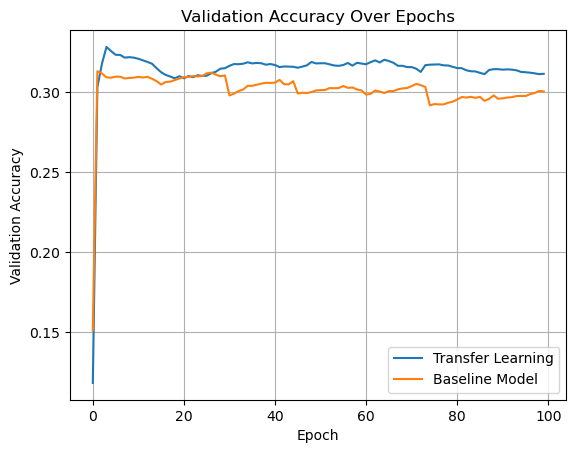

In [34]:
plt.plot(tl[0::100], label = "Transfer Learning")
plt.plot(bl[0::100],label = "Baseline Model")
plt.xlabel('Epoch')
plt.ylabel('Validation Accuracy')
plt.title('Validation Accuracy Over Epochs')
plt.grid(True)
plt.legend()
plt.show()